### Path

In [1]:
import os
os.chdir(r'C:\Users\user\Desktop\Data')

### Package

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import seaborn as sns

In [3]:
def statistics_1(data,feature):
    num=[]
    percent=[]
    c=[]
    for i in data[feature].unique():
        n=data[feature].loc[data[feature]==i].shape[0]
        p=n / data.shape[0]
        p=round(p*100,2)
        num.append(n)
        percent.append(p)
        c.append(i)
    sta=pd.DataFrame(c,columns=['class'])
    sta['num']=num
    sta['percentage']=percent
    sta.sort_values(by='percentage',ascending=False,inplace=True)
    sta.reset_index(drop=True,inplace=True)
    return sta
    '''
    sta=pd.DataFrame(np.vstack((c,percent)).T,columns=['class','percent'])
    sta['num']=num
    sta.sort_values(by='percent',ascending=False,inplace=True)
    sta.reset_index(drop=True,inplace=True)
    return sta, num, percent, c
    '''

In [4]:
def statistics_1_graph(data,feature,tick_spacing = 10):
    fontsize=20
    plt.rcParams['axes.titlesize'] = fontsize
    plt.rcParams['ytick.labelsize'] = fontsize
    plt.rcParams['xtick.labelsize'] = 15
    plt.rcParams['axes.labelsize'] = fontsize
    #matplotlib.rcParams['font.sans-serif'] = ['SimHei']

    fig, ax = plt.subplots(1,1,figsize=(15,5))
    
    x = statistics_1(data,feature)['class'].sort_index(ascending=False)
    y = statistics_1(data,feature)['percentage'].sort_values(ascending=True)
    ax.bar(x,y)
    '''
    sta, num, percent, c = statistics_1(data,feature)
    x, y = c, percent
    ax.bar(c_category,p_category)
    '''
    
    locs, labels = plt.xticks() 
    plt.setp(labels , rotation=90) 

    plt.title(feature)
    plt.ylabel("Percentage(%)")
    
    '''
    import matplotlib.ticker as ticker
    tick_spacing = 10
    ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    '''
    
    plt.gca().invert_xaxis()

    plt.show()

# 1. Merge

## * Kickstarter  

In [5]:
filename= "ks_projects_201801.csv"
kdata_df_all = pd.read_csv(filename, encoding='utf-8',low_memory=False)

In [6]:
kdata_df_all.dropna(inplace=True)

In [7]:
kdata_df_all['name_len'] = kdata_df_all['name'].apply(lambda x : len(x))

In [8]:
kdata_df_all['launched'] = pd.to_datetime(kdata_df_all['launched'])
kdata_df_all['deadline'] = pd.to_datetime(kdata_df_all['deadline'])

kdata_df_all['duration'] = kdata_df_all['deadline'].subtract(kdata_df_all['launched'])
kdata_df_all['duration'] = kdata_df_all['duration'].astype('timedelta64[D]')

In [9]:
kdata_df_all = kdata_df_all[kdata_df_all.duration < 200]

In [10]:
kdata_df_all['goal'] = pd.to_numeric(kdata_df_all['goal'], errors='coerce')
kdata_df_all['pledged'] = pd.to_numeric(kdata_df_all['pledged'], errors='coerce')
kdata_df_all['usd pledged'] = pd.to_numeric(kdata_df_all['usd pledged'], errors='coerce')
kdata_df_all['usd_pledged_real'] = pd.to_numeric(kdata_df_all['usd_pledged_real'], errors='coerce')
kdata_df_all['usd_goal_real'] = pd.to_numeric(kdata_df_all['usd_goal_real'], errors='coerce')

In [11]:
#drop columns
kdata_df_all = kdata_df_all.drop(['name', 'category', 'pledged', 'country', 'usd pledged','goal'], axis=1)

In [12]:
kdata_df_all.rename(columns={'ID': 'project_id', 'main_category': 'category', 'currency': 'location', 'state': 'status', 'usd_pledged_real': 'pledged' , 'usd_goal_real': 'goal'}, inplace=True)

In [13]:
kdata_df_all.dtypes

project_id             int64
category              object
location              object
deadline      datetime64[ns]
launched      datetime64[ns]
status                object
backers                int64
pledged              float64
goal                 float64
name_len               int64
duration             float64
dtype: object

##  *Indiegogo

In [14]:
filename = "combined_indiegogo_all.csv"
kdata_df_all = pd.read_csv(filename, header = 0, index_col = 0)

C:\Users\user\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [15]:
useless_columns = ["igg_image_url", "compressed_image_url", "url", "category_url", "category_name", "card_type",
                   "partner_name","in_forever_funding", "friend_team_members","friend_contributors", "source_url"]
kdata_df_all = kdata_df_all.drop(useless_columns, axis = 1)

In [16]:
import re
def Remove_Non_Numeric(column):
    return re.sub(r"\D", "", column)

kdata_df_all.balance = kdata_df_all.balance.apply(lambda row : Remove_Non_Numeric(row) )
kdata_df_all.collected_percentage = kdata_df_all.collected_percentage.apply(lambda row : Remove_Non_Numeric(row))

In [17]:
kdata_df_all.nearest_five_percent = kdata_df_all.nearest_five_percent.apply(lambda row: float(row)/100)
kdata_df_all.collected_percentage = kdata_df_all.collected_percentage.apply(lambda row: float(row)/100)

In [18]:
kdata_df_all['balance'] = pd.to_numeric(kdata_df_all['balance'], errors='coerce')
kdata_df_all['collected_percentage'] = pd.to_numeric(kdata_df_all['collected_percentage'], errors='coerce')
kdata_df_all['nearest_five_percent'] = pd.to_numeric(kdata_df_all['nearest_five_percent'], errors='coerce')

In [19]:
#collected_percentage >1 , funded
kdata_df_all['state'] = kdata_df_all.collected_percentage.apply(lambda row : np.where(row >= 1.0,1,0))

In [20]:
#clean up the amount of time left column, using days as the measurement
def Get_Days_Left(time):
    if  "hour" in time:
        return float(Remove_Non_Numeric(time))/24
    elif "day" in time:
        return float(Remove_Non_Numeric(time))
    else:
        return 0.0

In [21]:
kdata_df_all.rename(columns={'id': 'project_id', 'nearest_five_percent': 'nearest_5percent', 
                          'cached_collected_pledges_count': 'backers', 'balance': 'pledged',
                          'currency_code': 'location', 'amt_time_left': 'time_left',
                          'category_slug': 'category', 'collected_percentage': 'pledged_percent',
                          'state': 'status'}, inplace=True)

In [22]:
#drop columns
sub_kdata = kdata_df_all.drop(['title', 'tagline'], axis=1)
sub_kdata.dtypes

project_id            int64
nearest_5percent    float64
backers               int64
pledged               int64
location             object
time_left            object
category             object
pledged_percent     float64
status                int64
dtype: object

# 2. Data

擷取kstart、indeigogo資料集重疊的欄位做合併，形成新的資料集: merge

In [5]:
data = pd.read_csv(r'.\mix_platforms.csv', encoding='utf-8',low_memory=False)

In [24]:
data.head(6)

,platforms,status,project_id,category,location,backers,pledged_percent,goal_usd,pledged_usd
0,Kickstarter,1,620302213,Art,USD,6,10000.000000,0.01,100.00
1,Kickstarter,0,9572984,Film & Video,USD,0,0.000000,0.15,0.00
2,Kickstarter,1,1379346088,Art,MXN,7,33.489796,0.49,16.41
3,Kickstarter,0,219760504,Film & Video,USD,0,0.000000,0.50,0.00
4,Kickstarter,1,69101025,Publishing,MXN,2,950.563636,0.55,522.81
5,Kickstarter,1,952551201,Comics,AUD,59,1297.458333,0.72,934.17


## * Category合併

In [25]:
for j in data['platforms'].unique():
    print(j,':')
    for i in data.loc[data['platforms']==j]['category'].unique():
        print(i,', ',end='')
    print('\n')

Kickstarter :
Art , Film & Video , Publishing , Comics , Music , Games , Design , Technology , Food , Crafts , Photography , Theater , Journalism , Fashion , Dance , 

Indiegogo :
photography , writing , art , food , film , dance , community , design , gaming , technology , video_games , education , energy_green_tech , travel_outdoors , environment , comics , music , theatre , culture , animals , health , local_businesses , video_web , politics , sports , fashion , religion , home , small_business , human_rights , phones_accessories , camera_gear , productivity , transmedia , audio , tabletop_games , transportation , creative_works , wellness , podcasts_blogs_vlogs , spirituality , 



Art/art  
Comics/comics  
Music/music  
Design/design  
Technology/technology  
Food/food  
Photography/photography  
Theater/theatre  
Fashion/fashion  
Dance/dance

In [6]:
data['category'].loc[data['category']=='art']='Art'
data['category'].loc[data['category']=='comics']='Comics'
data['category'].loc[data['category']=='music']='Music'
data['category'].loc[data['category']=='design']='Design'
data['category'].loc[data['category']=='technology']='Technology'
data['category'].loc[data['category']=='food']='Food'
data['category'].loc[data['category']=='photography']='Photography'
data['category'].loc[data['category']=='theatre']='Theater'
data['category'].loc[data['category']=='fashion']='Fashion'
data['category'].loc[data['category']=='dance']='Dance'

C:\Users\user\Anaconda3\lib\site-packages\pandas\core\indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


## * platforms統計

In [27]:
print('類別種類:')
for i in data['platforms'].unique():
    print(i,', ',end='')
print('\n共{}種'.format(len(data['platforms'].unique())))

類別種類:
Kickstarter , Indiegogo , 
共2種


In [28]:
sta1_platforms = statistics_1(data,'platforms')
sta1_platforms

,class,num,percentage
0,Kickstarter,331462,55.89
1,Indiegogo,261549,44.11


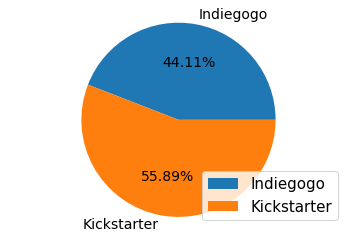

In [29]:
plt.figure()
values=[]
labels=[]
for i in np.unique(data['platforms']):
    values.append(data['platforms'].loc[data['platforms']==i].count())
    labels.append(i)
plt.pie(values,
        labels=labels,
        autopct='%1.2f%%',
        textprops = {"fontsize" : 14})
plt.legend(loc = "lower right",prop={'size':15})
plt.axis('equal')
plt.show()

In [30]:
data.drop(columns=['platforms'],inplace=True)

## * 刪除pledged_percent欄位

pledged_percent欄位是由pledged_usd和goal_usd兩欄位相除得到，考量到pledged_percent欄位會與pledged_usd和goal_usd兩欄位除在共線性，因此將其刪除

# 3. EDA

## 一、 單個特徵的敘述統計

### 1. 總樣本數

In [31]:
data.shape[0]

593011

### 2. 成功與失敗專案樣本數

In [32]:
num_1 = data['status'].loc[data['status']==1].shape[0]
percent_1 = num_1 / data.shape[0]
print('成功專案共: {}個，占總總樣本數{}%'.format(num_1,round(percent_1*100,2)))

num_0 = data['status'].loc[data['status']==0].shape[0]
percent_0 = num_0 / data.shape[0]
print('失敗專案共: {}個，占總總樣本數{}%'.format(num_0,round(percent_0*100,2)))

成功專案共: 213611個，占總總樣本數36.02%
失敗專案共: 379400個，占總總樣本數63.98%


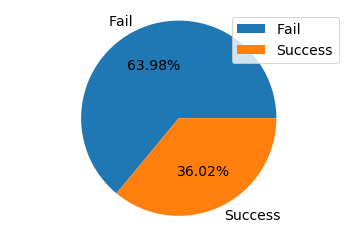

In [33]:
plt.figure()
values=[]
for i in np.unique(data['status']):
    values.append(data['status'].loc[data['status']==i].count())
labels=['Fail','Success']
plt.pie(values,
        labels=labels,
        autopct='%1.2f%%',
        textprops = {"fontsize" : 14})
plt.legend(loc = "best", prop={'size':14})
plt.axis('equal')
plt.show()

### 3. Category  敘述統計

In [34]:
print('類別種類:')
for i in data['category'].unique():
    print(i,', ',end='')
print('\n共{}種'.format(len(data['category'].unique())))

類別種類:
Art , Film & Video , Publishing , Comics , Music , Games , Design , Technology , Food , Crafts , Photography , Theater , Journalism , Fashion , Dance , writing , film , community , gaming , video_games , education , energy_green_tech , travel_outdoors , environment , culture , animals , health , local_businesses , video_web , politics , sports , religion , home , small_business , human_rights , phones_accessories , camera_gear , productivity , transmedia , audio , tabletop_games , transportation , creative_works , wellness , podcasts_blogs_vlogs , spirituality , 
共46種


In [38]:
#sta1_category, n_category, p_category, c_category = statistics_1(data,'category')
sta1_category = statistics_1(data,'category')
sta1_category

,class,num,percentage
0,Music,68513,11.55
1,Film & Video,56503,9.53
2,film,54495,9.19
3,Technology,38940,6.57
4,Publishing,35413,5.97
5,Art,35151,5.93
6,Design,28941,4.88
7,Games,28520,4.81
8,Fashion,25992,4.38
9,Food,25639,4.32


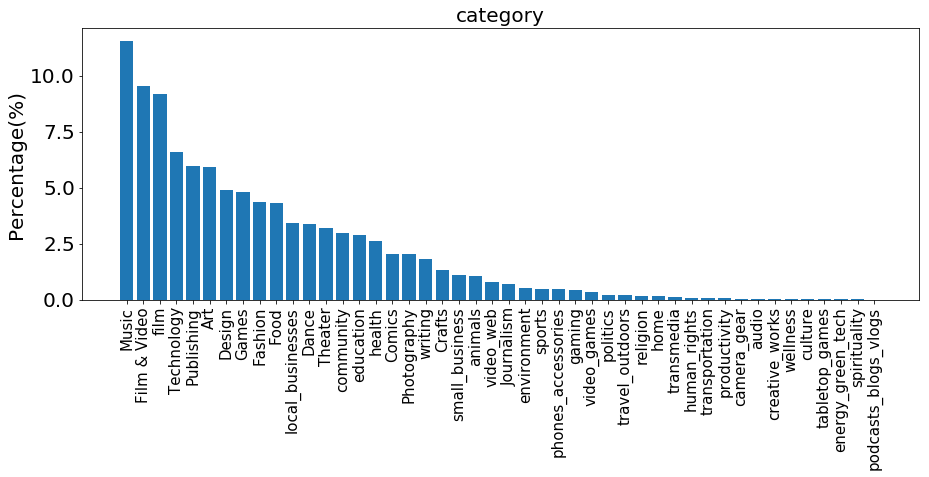

In [39]:
statistics_1_graph(data,'category')

### 3. location 敘述統計

In [40]:
print('類別種類:')
for i in data['location'].unique():
    print(i,', ',end='')
print('\n共{}種'.format(len(data['location'].unique())))

類別種類:
USD , MXN , AUD , DKK , CAD , NZD , EUR , GBP , SEK , HKD , SGD , NOK , CHF , JPY , 
共14種


In [41]:
#sta1_location, n_location, p_location, c_location = statistics_1(data,'location')
sta1_location = statistics_1(data,'location')
sta1_location

,class,num,percentage
0,USD,478886,80.75
1,GBP,43922,7.41
2,CAD,27281,4.60
3,EUR,26349,4.44
4,AUD,9265,1.56
5,SEK,1509,0.25
6,MXN,1411,0.24
7,NZD,1274,0.21
8,DKK,926,0.16
9,CHF,652,0.11


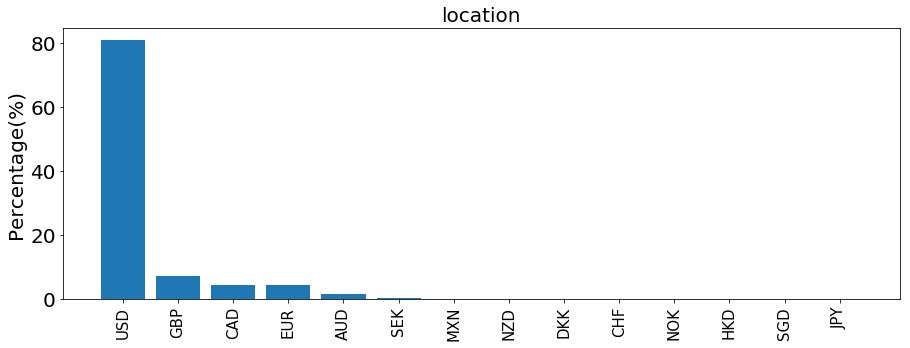

In [42]:
statistics_1_graph(data,'location')

### 4. backers敘述統計

#### backers數總額

In [43]:
data['backers'].sum()

73976757

#### backers敘述統計

In [44]:
data['backers'].describe().round()

count    593011.0
mean        125.0
std        1017.0
min           0.0
25%           6.0
50%          22.0
75%          60.0
max      219382.0
Name: backers, dtype: float64

<Figure size 432x288 with 0 Axes>

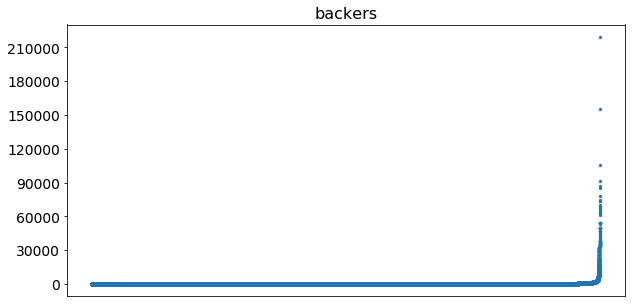

In [7]:
fontsize=14
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize
plt.rcParams['axes.labelsize'] = fontsize

plt.figure()
fig, ax = plt.subplots(1,1,figsize=(10,5))
ax.scatter(range(data['backers'].shape[0]),np.sort(data['backers']),s=5)

plt.xticks([])
plt.title('backers')

import matplotlib.ticker as ticker
tick_spacing = 30000
ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))

plt.show()

In [46]:
pd.DataFrame(data['backers'].sort_values().reset_index(drop=True))

,backers
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


### 5. goal_usd敘述統計

#### goal_usd總額

In [47]:
data['goal_usd'].sum()

18653595962.076492

#### goal_usd敘述統計

In [9]:
data['goal_usd'].describe()

count    5.930110e+05
mean     3.145573e+04
std      8.334892e+05
min      1.000000e-02
25%      2.188690e+03
50%      5.500000e+03
75%      1.516667e+04
max      1.663614e+08
Name: goal_usd, dtype: float64

<Figure size 432x288 with 0 Axes>

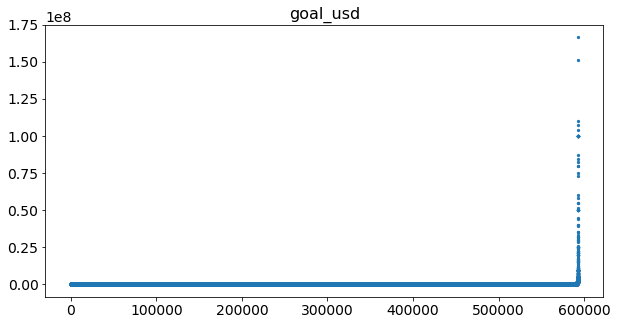

In [49]:
fontsize=14
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize
plt.rcParams['axes.labelsize'] = fontsize

plt.figure()
fig, ax = plt.subplots(1,1,figsize=(10,5))
ax.scatter(range(data['goal_usd'].shape[0]),np.sort(data['goal_usd']),s=5)

plt.xticks()
plt.title('goal_usd')
'''
import matplotlib.ticker as ticker
tick_spacing = 10
ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
'''
plt.show()

In [50]:
pd.DataFrame(data['goal_usd'].sort_values().reset_index(drop=True))

,goal_usd
0,1.000000e-02
1,1.500000e-01
2,4.900000e-01
3,5.000000e-01
4,5.500000e-01
5,7.200000e-01
6,7.400000e-01
7,7.400000e-01
8,7.500000e-01
9,7.500000e-01


### 6. pledged_usd 敘述統計

#### pledged_usd 總額

In [51]:
data['pledged_usd'].sum()

7055713011.0269

#### pledged_usd 敘述統計

In [10]:
data['pledged_usd'].describe()

count    5.930110e+05
mean     1.189811e+04
std      1.225808e+05
min      0.000000e+00
25%      2.910000e+02
50%      1.320000e+03
75%      4.450000e+03
max      2.033899e+07
Name: pledged_usd, dtype: float64

<Figure size 432x288 with 0 Axes>

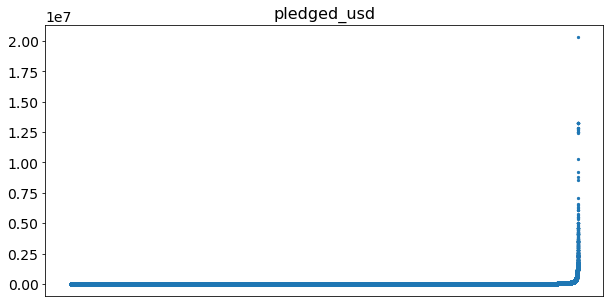

In [12]:
fontsize=14
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize
plt.rcParams['axes.labelsize'] = fontsize

plt.figure()
fig, ax = plt.subplots(1,1,figsize=(10,5))
ax.scatter(range(data['pledged_usd'].shape[0]),np.sort(data['pledged_usd']),s=5)

plt.xticks([])
plt.title('pledged_usd')
'''
import matplotlib.ticker as ticker
tick_spacing = 10
ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
'''
plt.show()

## 二、 不同category下單個特徵的敘述統計

### 1. 不同category下location統計

在不同category下，不同location在該category下的數量與所占的比率

In [54]:
print('不同category下location統計\n')
for i in data['category'].unique():
    print(i,':')
    for j in  data['location'].unique():
        df_c = data.loc[data['category']==i]
        n = df_c.loc[df_c['location']==j]['location'].count()
        p = n / data['category'].loc[data['category']==i].shape[0]
        print('{} 數量與比率: {}，{}%'.format(j,n,round(p*100,2)))
    print('\n')

不同category下location統計

Art :
USD 數量與比率: 28020，79.71%
MXN 數量與比率: 138，0.39%
AUD 數量與比率: 463，1.32%
DKK 數量與比率: 72，0.2%
CAD 數量與比率: 1566，4.46%
NZD 數量與比率: 81，0.23%
EUR 數量與比率: 1526，4.34%
GBP 數量與比率: 3053，8.69%
SEK 數量與比率: 105，0.3%
HKD 數量與比率: 31，0.09%
SGD 數量與比率: 20，0.06%
NOK 數量與比率: 31，0.09%
CHF 數量與比率: 44，0.13%
JPY 數量與比率: 1，0.0%


Film & Video :
USD 數量與比率: 46932，83.06%
MXN 數量與比率: 260，0.46%
AUD 數量與比率: 822，1.45%
DKK 數量與比率: 98，0.17%
CAD 數量與比率: 1489，2.64%
NZD 數量與比率: 176，0.31%
EUR 數量與比率: 1197，2.12%
GBP 數量與比率: 5216，9.23%
SEK 數量與比率: 183，0.32%
HKD 數量與比率: 9，0.02%
SGD 數量與比率: 15，0.03%
NOK 數量與比率: 62，0.11%
CHF 數量與比率: 44，0.08%
JPY 數量與比率: 0，0.0%


Publishing :
USD 數量與比率: 28677，80.98%
MXN 數量與比率: 126，0.36%
AUD 數量與比率: 745，2.1%
DKK 數量與比率: 73，0.21%
CAD 數量與比率: 1332，3.76%
NZD 數量與比率: 165，0.47%
EUR 數量與比率: 1051，2.97%
GBP 數量與比率: 2918，8.24%
SEK 數量與比率: 183，0.52%
HKD 數量與比率: 14，0.04%
SGD 數量與比率: 33，0.09%
NOK 數量與比率: 62，0.18%
CHF 數量與比率: 33，0.09%
JPY 數量與比率: 1，0.0%


Comics :
USD 數量與比率: 10036，82.1%
MXN 數量與比率: 28，0.23%
AUD 數量與比率: 173

AUD 數量與比率: 35，0.74%
DKK 數量與比率: 0，0.0%
CAD 數量與比率: 233，4.91%
NZD 數量與比率: 0，0.0%
EUR 數量與比率: 148，3.12%
GBP 數量與比率: 189，3.99%
SEK 數量與比率: 0，0.0%
HKD 數量與比率: 0，0.0%
SGD 數量與比率: 0，0.0%
NOK 數量與比率: 0，0.0%
CHF 數量與比率: 0，0.0%
JPY 數量與比率: 0，0.0%


politics :
USD 數量與比率: 786，63.23%
MXN 數量與比率: 0，0.0%
AUD 數量與比率: 16，1.29%
DKK 數量與比率: 0，0.0%
CAD 數量與比率: 69，5.55%
NZD 數量與比率: 0，0.0%
EUR 數量與比率: 66，5.31%
GBP 數量與比率: 306，24.62%
SEK 數量與比率: 0，0.0%
HKD 數量與比率: 0，0.0%
SGD 數量與比率: 0，0.0%
NOK 數量與比率: 0，0.0%
CHF 數量與比率: 0，0.0%
JPY 數量與比率: 0，0.0%


sports :
USD 數量與比率: 2282，77.94%
MXN 數量與比率: 0，0.0%
AUD 數量與比率: 45，1.54%
DKK 數量與比率: 0，0.0%
CAD 數量與比率: 227，7.75%
NZD 數量與比率: 0，0.0%
EUR 數量與比率: 216，7.38%
GBP 數量與比率: 158，5.4%
SEK 數量與比率: 0，0.0%
HKD 數量與比率: 0，0.0%
SGD 數量與比率: 0，0.0%
NOK 數量與比率: 0，0.0%
CHF 數量與比率: 0，0.0%
JPY 數量與比率: 0，0.0%


religion :
USD 數量與比率: 964，94.79%
MXN 數量與比率: 0，0.0%
AUD 數量與比率: 5，0.49%
DKK 數量與比率: 0，0.0%
CAD 數量與比率: 20，1.97%
NZD 數量與比率: 0，0.0%
EUR 數量與比率: 11，1.08%
GBP 數量與比率: 17，1.67%
SEK 數量與比率: 0，0.0%
HKD 數量與比率: 0，0.0%
SGD 數量與比率: 0

In [55]:
sta2_location_1=pd.DataFrame(data['category'].unique(),columns=['category'])
sta2_location_2=pd.DataFrame(data['category'].unique(),columns=['category'])
for i in data['location'].unique():
    n=[]
    p=[]
    for j in data['category'].unique():
        df_c = data.loc[data['category']==j]
        num = df_c.loc[df_c['location']==i]['location'].count()
        per = round(num / data['category'].loc[data['category']==j].shape[0],2)
        n.append(num)
        p.append(per)
    name1='num_'+i
    name2='percent_'+i
    sta2_location_1[name1]=n
    sta2_location_2[name2]=p

sta2_location_1.set_index('category',drop=True,inplace=True)
sta2_location_2.set_index('category',drop=True,inplace=True)

按USD在每個category下所占的比率大小來排序，其中category為religion時所使用美金的比率最高

In [56]:
sta2_location_2.sort_values(by='percent_USD',ascending=False,inplace=True)
sta2_location_2

,percent_USD,percent_MXN,percent_AUD,percent_DKK,percent_CAD,percent_NZD,percent_EUR,percent_GBP,percent_SEK,percent_HKD,percent_SGD,percent_NOK,percent_CHF,percent_JPY
category,,,,,,,,,,,,,,
religion,0.95,0.00,0.00,0.0,0.02,0.00,0.01,0.02,0.00,0.00,0.0,0.0,0.0,0.0
audio,0.92,0.00,0.01,0.0,0.01,0.00,0.03,0.04,0.00,0.00,0.0,0.0,0.0,0.0
phones_accessories,0.90,0.00,0.01,0.0,0.01,0.00,0.05,0.02,0.00,0.00,0.0,0.0,0.0,0.0
energy_green_tech,0.88,0.00,0.02,0.0,0.03,0.00,0.04,0.02,0.00,0.00,0.0,0.0,0.0,0.0
home,0.88,0.00,0.00,0.0,0.03,0.00,0.06,0.02,0.00,0.00,0.0,0.0,0.0,0.0
health,0.87,0.00,0.01,0.0,0.05,0.00,0.03,0.03,0.00,0.00,0.0,0.0,0.0,0.0
small_business,0.87,0.00,0.01,0.0,0.05,0.00,0.03,0.04,0.00,0.00,0.0,0.0,0.0,0.0
video_web,0.87,0.00,0.01,0.0,0.05,0.00,0.03,0.04,0.00,0.00,0.0,0.0,0.0,0.0
camera_gear,0.86,0.00,0.00,0.0,0.03,0.00,0.07,0.04,0.00,0.00,0.0,0.0,0.0,0.0


按每個category本身包含的專案數量大小排序，其中category為music的類別本身包含的專案數最多。

In [57]:
ddf=sta2_location_1.loc[sta1_category['class'].values].reset_index()
ddf

,category,num_USD,num_MXN,num_AUD,num_DKK,num_CAD,num_NZD,num_EUR,num_GBP,num_SEK,num_HKD,num_SGD,num_NOK,num_CHF,num_JPY
0,Music,58363,168,624,89,2874,86,2390,3626,160,4,8,74,46,1
1,Film & Video,46932,260,822,98,1489,176,1197,5216,183,9,15,62,44,0
2,film,44228,0,733,0,3000,0,2027,4507,0,0,0,0,0,0
3,Technology,28940,180,1041,154,1697,178,3417,2745,142,118,63,97,164,4
4,Publishing,28677,126,745,73,1332,165,1051,2918,183,14,33,62,33,1
5,Art,28020,138,463,72,1566,81,1526,3053,105,31,20,31,44,1
6,Design,21637,78,779,144,1232,131,1926,2411,143,177,118,47,114,4
7,Games,20229,103,747,79,1443,150,2077,3245,222,56,43,62,59,5
8,Fashion,19593,56,682,68,1138,90,1627,2416,95,39,91,34,56,7
9,Food,21113,87,432,51,1106,92,975,1578,91,8,19,44,43,0


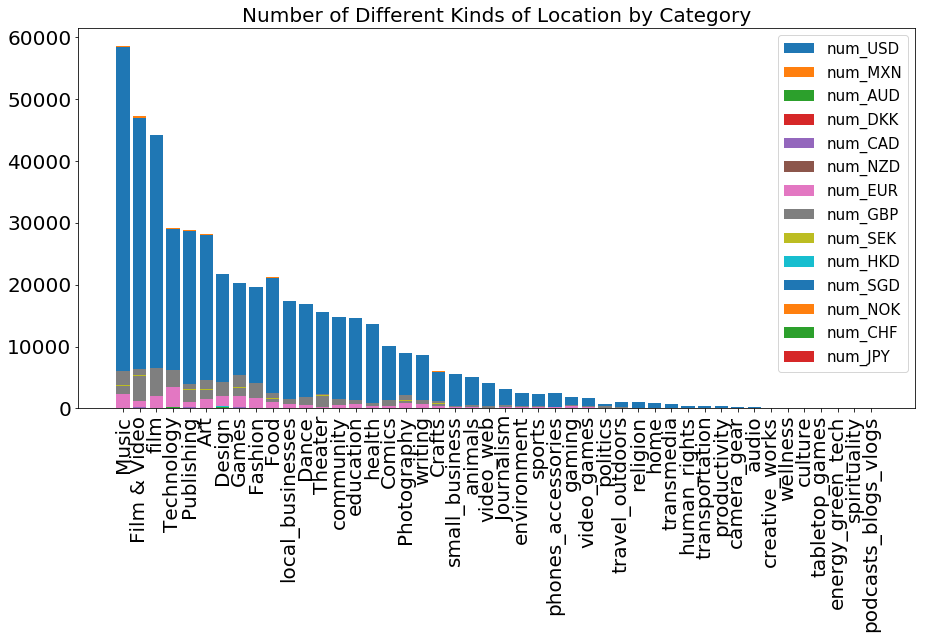

In [61]:
df2=sta2_location_1.loc[sta1_category['class'].values]
fontsize=20
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['axes.labelsize'] = fontsize
    
plt.figure(figsize=(15,7))
size = 5

x = df2.index.values
a=df2[df2.columns.values[0]].values
plt.bar(x, a, label = df2.columns.values[0])
for i in df2.columns.values[1:]:
    plt.bar(x, df2[i].values, bottom=a, label=i)
    a=df2[i].values
    
plt.legend(prop={'size':15},loc='best')
plt.title('Number of Different Kinds of Location by Category')
locs, labels = plt.xticks() 
plt.setp(labels , rotation=90) 
plt.show()

### 2. 不同category下成功與失敗專案統計

在不同category下，成功與失敗專案分別在該category下的數量與所占的比率

In [62]:
print('不同category下成功與失敗專案統計\n')
for i in data['category'].unique():
    df_c = data.loc[data['category']==i]
    n_fail = df_c.loc[df_c['status']==0]['status'].count()
    p_fail = n_fail / data['category'].loc[data['category']==i].shape[0]
    n_success = df_c.loc[df_c['status']==1]['status'].count()
    p_success = n_success / data['category'].loc[data['category']==i].shape[0]
    print(i,':')
    print('成功案例數與比率: {}，{}%'.format(n_success,round(p_success*100,2)))
    print('失敗案例數與比率: {}，{}%'.format(n_fail,round(p_fail*100,2)))
    print('\n')

不同category下成功與失敗專案統計

Art :
成功案例數與比率: 14255，40.55%
失敗案例數與比率: 20896，59.45%


Film & Video :
成功案例數與比率: 23612，41.79%
失敗案例數與比率: 32891，58.21%


Publishing :
成功案例數與比率: 12300，34.73%
失敗案例數與比率: 23113，65.27%


Comics :
成功案例數與比率: 6782，55.48%
失敗案例數與比率: 5442，44.52%


Music :
成功案例數與比率: 30925，45.14%
失敗案例數與比率: 37588，54.86%


Games :
成功案例數與比率: 12518，43.89%
失敗案例數與比率: 16002，56.11%


Design :
成功案例數與比率: 11993，41.44%
失敗案例數與比率: 16948，58.56%


Technology :
成功案例數與比率: 12426，31.91%
失敗案例數與比率: 26514，68.09%


Food :
成功案例數與比率: 6883，26.85%
失敗案例數與比率: 18756，73.15%


Crafts :
成功案例數與比率: 2115，27.05%
失敗案例數與比率: 5703，72.95%


Photography :
成功案例數與比率: 4037，33.63%
失敗案例數與比率: 7966，66.37%


Theater :
成功案例數與比率: 9781，51.85%
失敗案例數與比率: 9083，48.15%


Journalism :
成功案例數與比率: 1012，24.4%
失敗案例數與比率: 3136，75.6%


Fashion :
成功案例數與比率: 7291，28.05%
失敗案例數與比率: 18701，71.95%


Dance :
成功案例數與比率: 7775，38.77%
失敗案例數與比率: 12277，61.23%


writing :
成功案例數與比率: 3704，34.48%
失敗案例數與比率: 7037，65.52%


film :
成功案例數與比率: 14349，26.33%
失敗案例數與比率: 40146，73.67%


community 

In [63]:
sta2_category=pd.DataFrame(data['category'].unique(),columns=['category'])
n_s=[]
n_f=[]
p_s=[]
p_f=[]
for i in data['category'].unique():
    df_c = data.loc[data['category']==i]
    n_success = df_c.loc[df_c['status']==1]['status'].count()
    n_fail = df_c.loc[df_c['status']==0]['status'].count()
    p_success = round(n_success / data['category'].loc[data['category']==i].shape[0],2)
    p_fail = 1-p_success
    n_s.append(n_success)
    n_f.append(n_fail)
    p_s.append(p_success)
    p_f.append(p_fail)
sta2_category['num_success']=n_s
sta2_category['num_fail']=n_f
sta2_category['percent_success']=p_s
sta2_category['percent_fail']=p_f
sta2_category.sort_values(by='percent_success',ascending=False,inplace=True)
sta2_category.set_index('category',drop=True,inplace=True)
sta2_category

,num_success,num_fail,percent_success,percent_fail
category,,,,
Comics,6782,5442,0.55,0.45
Theater,9781,9083,0.52,0.48
audio,154,165,0.48,0.52
tabletop_games,42,51,0.45,0.55
Music,30925,37588,0.45,0.55
Games,12518,16002,0.44,0.56
Film & Video,23612,32891,0.42,0.58
gaming,1043,1470,0.42,0.58
Art,14255,20896,0.41,0.59


成功專案比率大於五成的category  
這些category本身包含的專案數

In [64]:
df1=sta2_category.loc[sta2_category['percent_success'] > 0.5]
df1

,num_success,num_fail,percent_success,percent_fail
category,,,,
Comics,6782,5442,0.55,0.45
Theater,9781,9083,0.52,0.48


In [65]:
for i in df1.index.values:
    print(sta1_category.loc[sta1_category['class']==i],'\n')

     class    num  percentage
16  Comics  12224        2.06 

      class    num  percentage
12  Theater  18864        3.18 



按每個category本身包含的專案數量大小排序，其中category為music的類別本身包含的專案數最多

In [66]:
df2 = sta2_category.loc[sta1_category['class'].values].reset_index()
df2.index = df2.index + 1
df2

,category,num_success,num_fail,percent_success,percent_fail
1,Music,30925,37588,0.45,0.55
2,Film & Video,23612,32891,0.42,0.58
3,film,14349,40146,0.26,0.74
4,Technology,12426,26514,0.32,0.68
5,Publishing,12300,23113,0.35,0.65
6,Art,14255,20896,0.41,0.59
7,Design,11993,16948,0.41,0.59
8,Games,12518,16002,0.44,0.56
9,Fashion,7291,18701,0.28,0.72
10,Food,6883,18756,0.27,0.73


包含專案數量前10名的category，其成功與失敗專案情況  
成功專案率大於五成的類別的數量

In [67]:
df2.iloc[0:10]

,category,num_success,num_fail,percent_success,percent_fail
1,Music,30925,37588,0.45,0.55
2,Film & Video,23612,32891,0.42,0.58
3,film,14349,40146,0.26,0.74
4,Technology,12426,26514,0.32,0.68
5,Publishing,12300,23113,0.35,0.65
6,Art,14255,20896,0.41,0.59
7,Design,11993,16948,0.41,0.59
8,Games,12518,16002,0.44,0.56
9,Fashion,7291,18701,0.28,0.72
10,Food,6883,18756,0.27,0.73


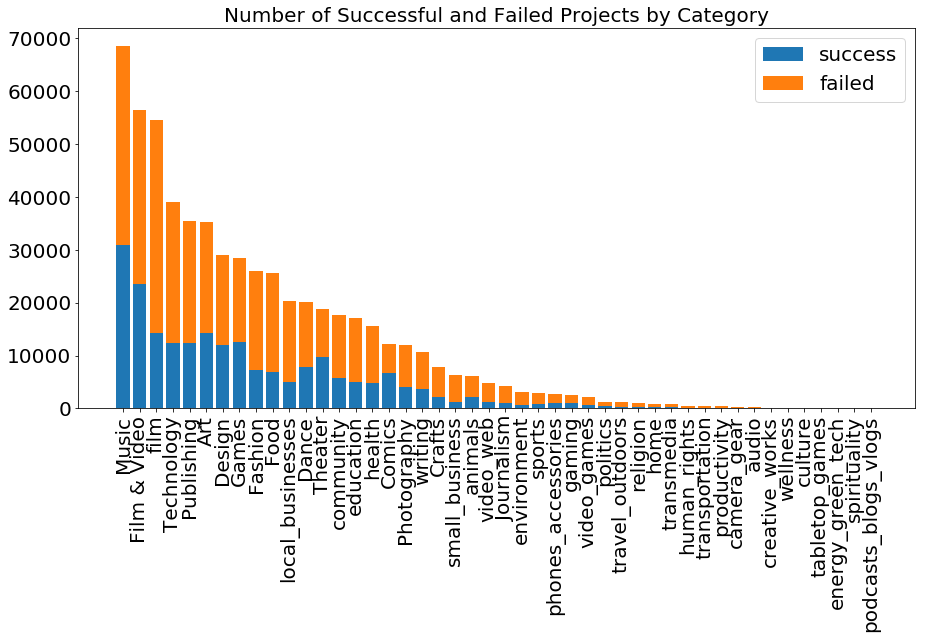

In [68]:
fontsize=20
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['axes.labelsize'] = fontsize
    
plt.figure(figsize=(15,7))
size = 5
x = df2['category'].values
a = df2['num_success'].values
b = df2['num_fail'].values
plt.bar(x, a, label='success')
plt.bar(x, b, bottom=a, label='failed')
plt.legend(prop={'size':20})
plt.title('Number of Successful and Failed Projects by Category')
#plt.yticks([])

locs, labels = plt.xticks() 
plt.setp(labels , rotation=90) 

plt.show()

### 3. 不同category下backers敘述統計

Art :
count    35151.000000
mean        47.469659
std        212.756699
min          0.000000
25%          3.000000
50%         16.000000
75%         43.000000
max      22834.000000
Name: backers, dtype: float64


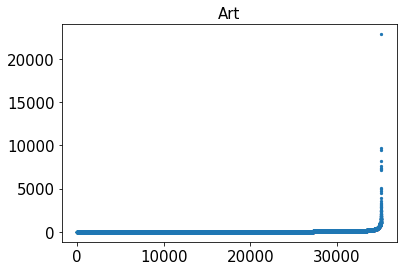



Film & Video :
count    56503.000000
mean        72.585066
std        573.874618
min          0.000000
25%          2.000000
50%         15.000000
75%         55.000000
max      91585.000000
Name: backers, dtype: float64


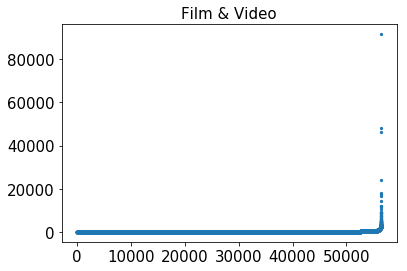



Publishing :
count    35413.000000
mean        61.821647
std        311.059565
min          0.000000
25%          1.000000
50%          9.000000
75%         46.000000
max      21808.000000
Name: backers, dtype: float64


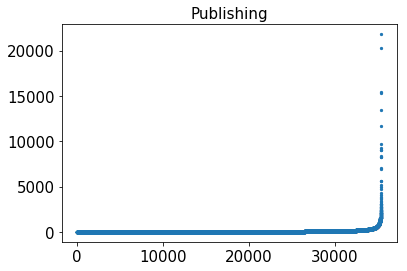



Comics :
count    12224.000000
mean       132.094486
std        376.465382
min          0.000000
25%         13.000000
50%         42.000000
75%        115.000000
max      14952.000000
Name: backers, dtype: float64


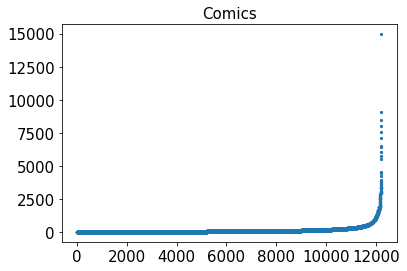



Music :
count    68513.000000
mean        58.962722
std        201.817380
min          0.000000
25%          6.000000
50%         26.000000
75%         64.000000
max      24883.000000
Name: backers, dtype: float64


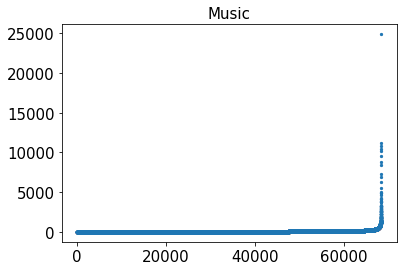



Games :
count     28520.000000
mean        382.116655
std        2387.484027
min           0.000000
25%           5.000000
50%          40.000000
75%         206.000000
max      219382.000000
Name: backers, dtype: float64


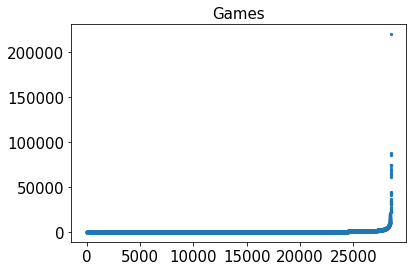



Design :
count     28941.000000
mean        285.444974
std        1663.831391
min           0.000000
25%           7.000000
50%          35.000000
75%         145.000000
max      154926.000000
Name: backers, dtype: float64


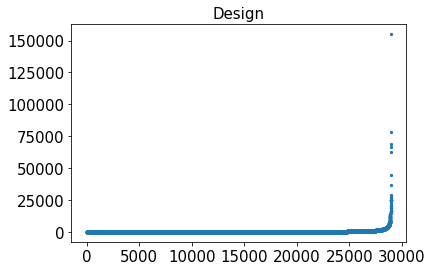



Technology :
count     38940.000000
mean        441.928223
std        2166.937255
min           0.000000
25%           3.000000
50%          17.000000
75%         131.000000
max      105857.000000
Name: backers, dtype: float64


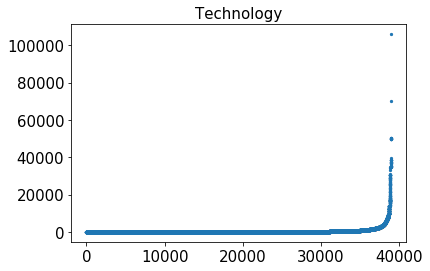



Food :
count    25639.000000
mean        60.952143
std        264.564208
min          0.000000
25%          2.000000
50%         11.000000
75%         52.000000
max      13116.000000
Name: backers, dtype: float64


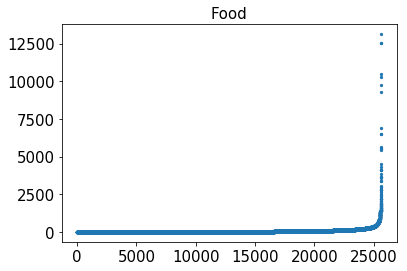



Crafts :
count     7818.000000
mean        29.851113
std        174.674853
min          0.000000
25%          1.000000
50%          4.000000
75%         19.000000
max      12705.000000
Name: backers, dtype: float64


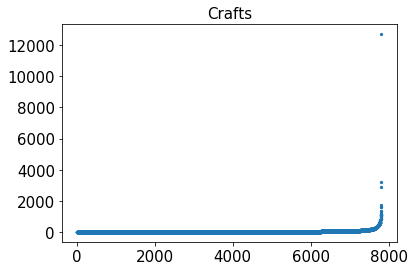



Photography :
count    12003.000000
mean        47.133217
std        151.820293
min          0.000000
25%          2.000000
50%         11.000000
75%         42.000000
max       5582.000000
Name: backers, dtype: float64


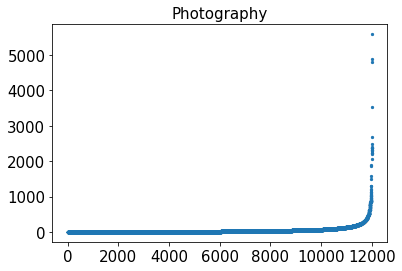



Theater :
count    18864.000000
mean        47.105598
std        186.969172
min          0.000000
25%         13.000000
50%         28.000000
75%         54.000000
max      22536.000000
Name: backers, dtype: float64


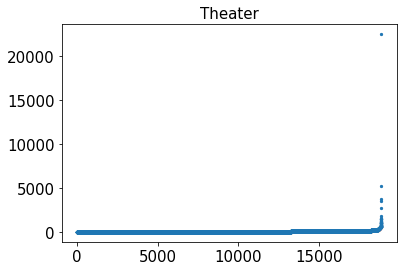



Journalism :
count    4148.000000
mean       43.068226
std       161.815427
min         0.000000
25%         1.000000
50%         3.000000
75%        20.000000
max      3136.000000
Name: backers, dtype: float64


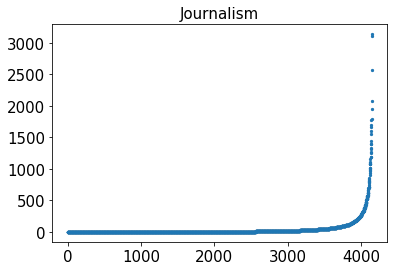



Fashion :
count    25992.000000
mean        82.237996
std        415.658757
min          0.000000
25%          2.000000
50%         11.000000
75%         46.000000
max      15129.000000
Name: backers, dtype: float64


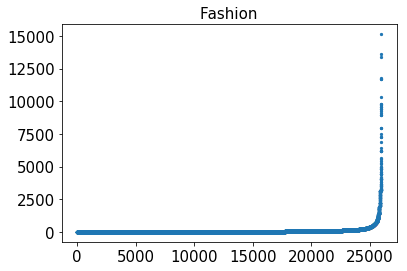



Dance :
count    20052.000000
mean        41.701177
std        234.503316
min          0.000000
25%         14.000000
50%         27.000000
75%         48.000000
max      22536.000000
Name: backers, dtype: float64


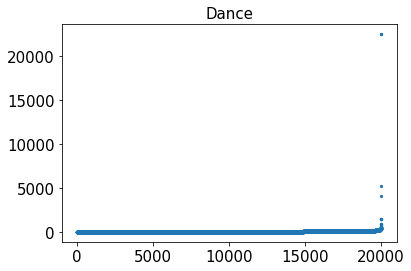



writing :
count    10741.000000
mean        57.705428
std        103.571376
min          1.000000
25%         14.000000
50%         29.000000
75%         60.000000
max       2434.000000
Name: backers, dtype: float64


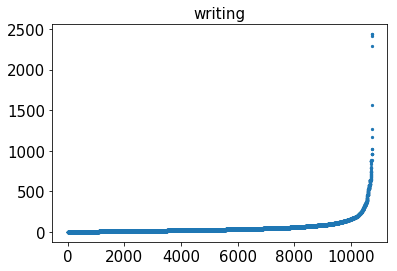



film :
count    54495.000000
mean        93.590274
std       1031.131615
min          1.000000
25%         12.000000
50%         24.000000
75%         50.000000
max      54313.000000
Name: backers, dtype: float64


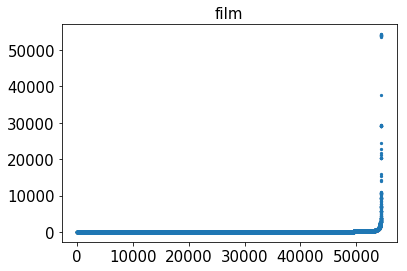



community :
count    17629.000000
mean        62.641783
std        342.659521
min          1.000000
25%         14.000000
50%         26.000000
75%         53.000000
max      32251.000000
Name: backers, dtype: float64


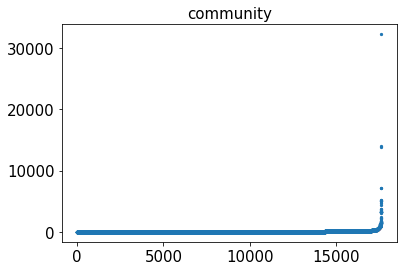



gaming :
count     2513.000000
mean       292.734978
std       2088.875968
min          1.000000
25%         14.000000
50%         37.000000
75%        126.000000
max      32432.000000
Name: backers, dtype: float64


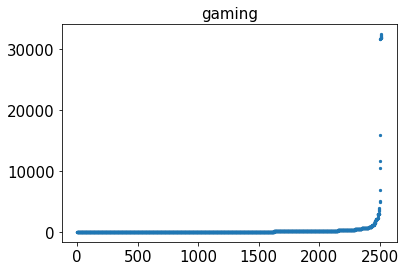



video_games :
count     2146.000000
mean       185.664026
std       1189.888936
min          1.000000
25%         11.000000
50%         28.000000
75%         80.000000
max      32615.000000
Name: backers, dtype: float64


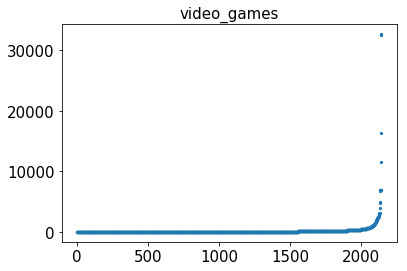



education :
count    17025.000000
mean        57.335330
std        460.888188
min          0.000000
25%         11.000000
50%         22.000000
75%         44.000000
max      33253.000000
Name: backers, dtype: float64


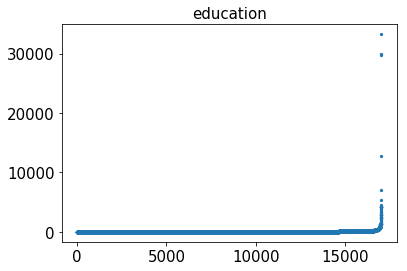



energy_green_tech :
count       89.000000
mean      2385.505618
std       9312.606718
min          1.000000
25%          6.000000
50%         22.000000
75%        286.000000
max      50111.000000
Name: backers, dtype: float64


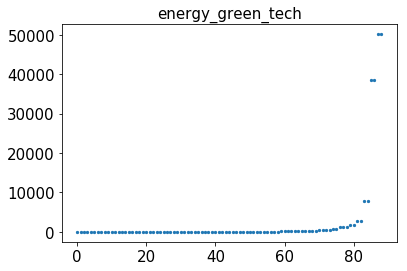



travel_outdoors :
count     1223.000000
mean       303.913328
std       2148.796026
min          1.000000
25%         10.500000
50%         24.000000
75%         66.000000
max      35341.000000
Name: backers, dtype: float64


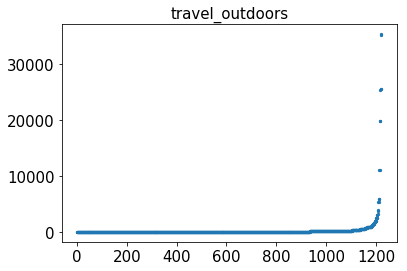



environment :
count    3044.000000
mean       86.825887
std       336.414571
min         1.000000
25%        12.000000
50%        26.000000
75%        60.000000
max      9267.000000
Name: backers, dtype: float64


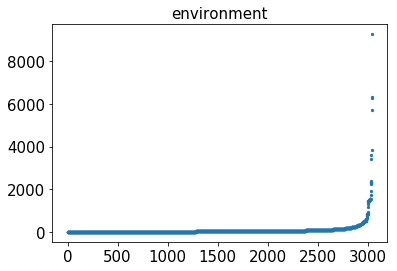



culture :
count     96.000000
mean      46.729167
std       98.250215
min        1.000000
25%        5.750000
50%       12.000000
75%       39.750000
max      744.000000
Name: backers, dtype: float64


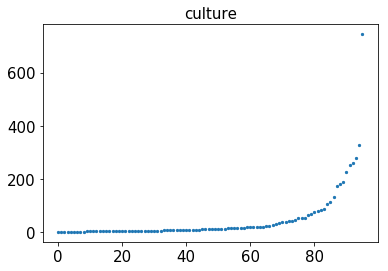



animals :
count     6180.000000
mean        70.353560
std        345.394505
min          1.000000
25%         14.000000
50%         27.000000
75%         51.000000
max      14407.000000
Name: backers, dtype: float64


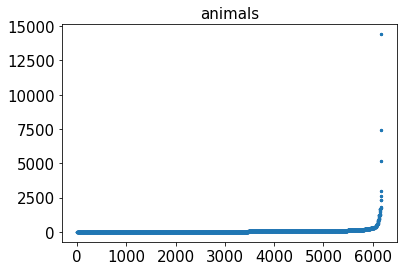



health :
count    15572.000000
mean       102.310814
std        584.014053
min          0.000000
25%         13.000000
50%         26.000000
75%         59.000000
max      19709.000000
Name: backers, dtype: float64


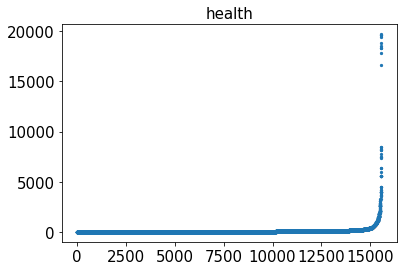



local_businesses :
count    20347.000000
mean        62.520617
std        339.454996
min          1.000000
25%         12.000000
50%         25.000000
75%         54.000000
max      32251.000000
Name: backers, dtype: float64


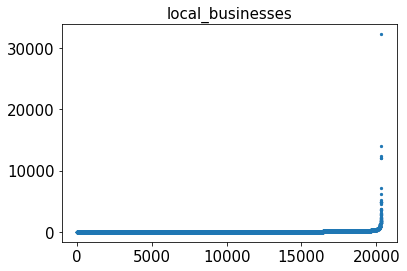



video_web :
count     4741.000000
mean       154.655558
std       1665.213931
min          1.000000
25%         14.000000
50%         28.000000
75%         57.000000
max      46992.000000
Name: backers, dtype: float64


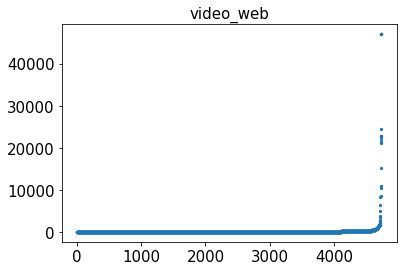



politics :
count     1243.000000
mean       169.050684
std        634.493433
min          1.000000
25%         16.000000
50%         35.000000
75%         99.000000
max      10495.000000
Name: backers, dtype: float64


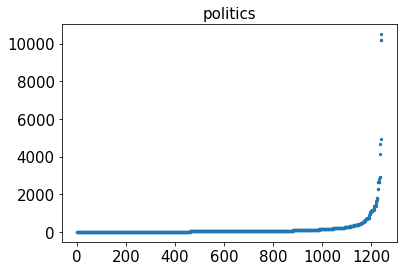



sports :
count    2928.000000
mean       57.842896
std       193.681861
min         1.000000
25%        12.000000
50%        22.000000
75%        45.000000
max      3164.000000
Name: backers, dtype: float64


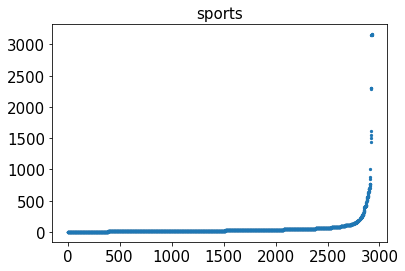



religion :
count    1017.000000
mean       43.718781
std       184.644561
min         1.000000
25%         9.000000
50%        17.000000
75%        34.000000
max      4475.000000
Name: backers, dtype: float64


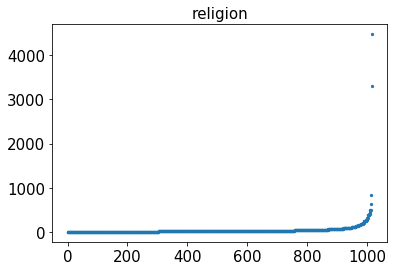



home :
count      929.000000
mean       487.803014
std       2308.330860
min          1.000000
25%         10.000000
50%         30.000000
75%        140.000000
max      41607.000000
Name: backers, dtype: float64


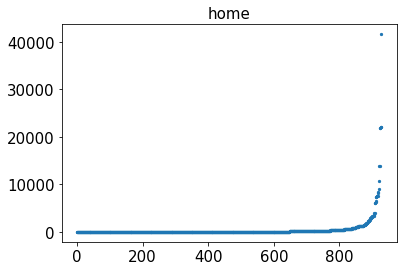



small_business :
count     6385.000000
mean        64.807361
std        394.640343
min          1.000000
25%         11.000000
50%         24.000000
75%         54.000000
max      12142.000000
Name: backers, dtype: float64


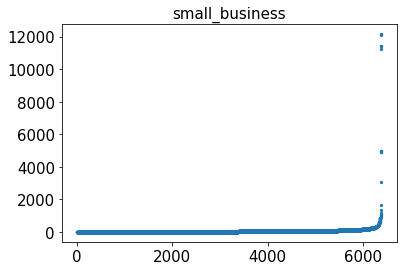



human_rights :
count     464.000000
mean       80.601293
std       199.576545
min         1.000000
25%        11.000000
50%        22.000000
75%        58.000000
max      2093.000000
Name: backers, dtype: float64


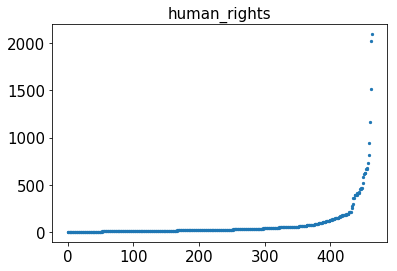



phones_accessories :
count     2783.000000
mean       540.819978
std       2084.482310
min          1.000000
25%         15.000000
50%         41.000000
75%        181.000000
max      30673.000000
Name: backers, dtype: float64


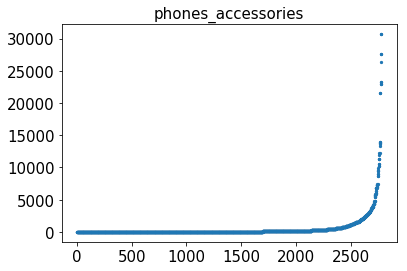



camera_gear :
count      293.000000
mean       459.317406
std       1453.064277
min          1.000000
25%         15.000000
50%         37.000000
75%        185.000000
max      17206.000000
Name: backers, dtype: float64


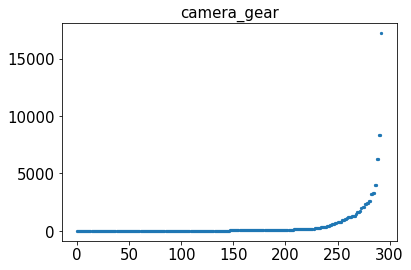



productivity :
count      432.000000
mean       349.967593
std       2180.896638
min          1.000000
25%          9.000000
50%         23.500000
75%         68.000000
max      28850.000000
Name: backers, dtype: float64


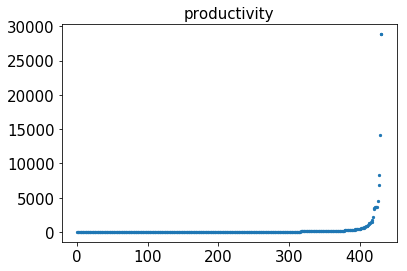



transmedia :
count      807.000000
mean        92.018587
std        590.067642
min          1.000000
25%         15.500000
50%         33.000000
75%         69.000000
max      16378.000000
Name: backers, dtype: float64


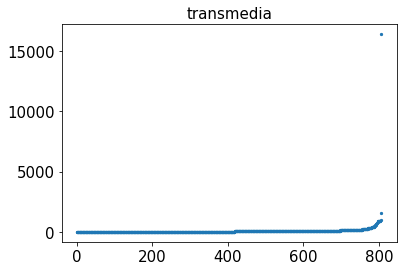



audio :
count      319.000000
mean      1124.159875
std       4045.017411
min          1.000000
25%         15.500000
50%         64.000000
75%        516.000000
max      37716.000000
Name: backers, dtype: float64


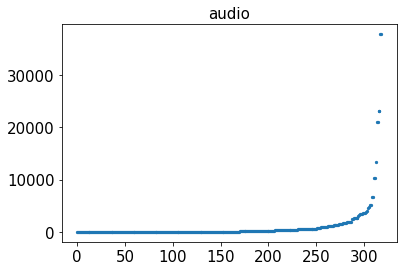



tabletop_games :
count      93.000000
mean      141.290323
std       546.637579
min         1.000000
25%         8.000000
50%        30.000000
75%        96.000000
max      5114.000000
Name: backers, dtype: float64


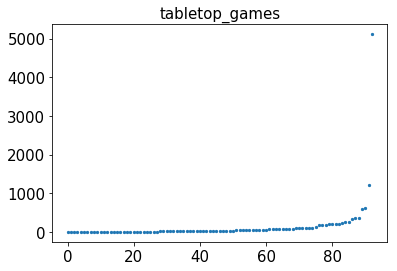



transportation :
count      396.000000
mean       318.959596
std       1246.290997
min          1.000000
25%         11.000000
50%         25.000000
75%         95.000000
max      15854.000000
Name: backers, dtype: float64


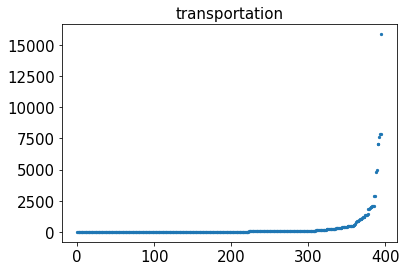



creative_works :
count     168.000000
mean      160.613095
std       556.168629
min         1.000000
25%         4.750000
50%        17.500000
75%        58.000000
max      3017.000000
Name: backers, dtype: float64


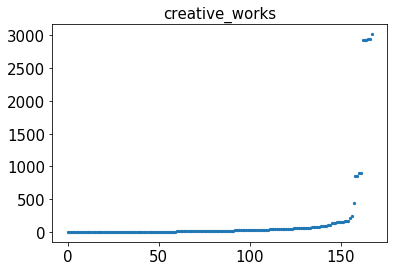



wellness :
count     126.000000
mean       51.706349
std       129.133609
min         1.000000
25%         7.250000
50%        15.000000
75%        44.000000
max      1266.000000
Name: backers, dtype: float64


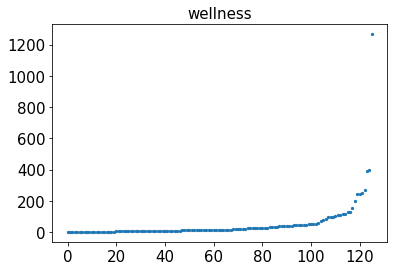



podcasts_blogs_vlogs :
count       26.000000
mean      1740.115385
std       6026.656601
min          1.000000
25%          2.250000
50%         23.500000
75%         63.000000
max      22211.000000
Name: backers, dtype: float64


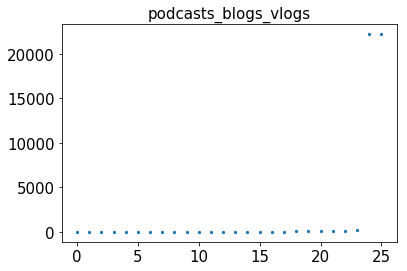



spirituality :
count     40.000000
mean      43.475000
std       49.943551
min        1.000000
25%        4.000000
50%       22.500000
75%       81.750000
max      163.000000
Name: backers, dtype: float64


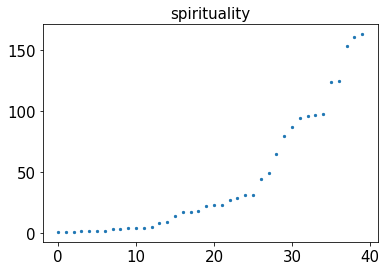

In [69]:
fontsize=15
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize
plt.rcParams['axes.labelsize'] = fontsize

for i in data['category'].unique():
    print(i,':')
    des = data.loc[data['category']==i]['backers'].describe()
    print(des)
    plt.figure()
    x=data.loc[data['category']==i]['backers'].sort_values()
    plt.scatter(range(x.shape[0]),x, s=5)
    plt.title(i)
    plt.show()
    print('\n')

In [70]:
sta2_backers=pd.DataFrame(data['category'].unique(),columns=['category'])
mean=[]
std=[]
Q1=[]
Q3=[]
Max=[]
for i in data['category'].unique():
    des = data.loc[data['category']==i]['backers'].describe()  
    mean.append(round(des['mean'],2))
    std.append(round(des['std'],2))
    Q1.append(round(des['25%'],2))
    Q3.append(round(des['75%'],2))
    Max.append(round(des['max'],2))
sta2_backers['mean']=mean
sta2_backers['std']=std
sta2_backers['Q1']=Q1
sta2_backers['Q3']=Q3
sta2_backers['max']=Max
sta2_backers.set_index('category',drop=True,inplace=True)

按每個category本身包含的專案數量大小排序，其中category為music的類別本身包含的專案數最多

In [71]:
sta2_backers.loc[sta1_category['class'].values]

,mean,std,Q1,Q3,max
category,,,,,
Music,58.96,201.82,6.00,64.00,24883.0
Film & Video,72.59,573.87,2.00,55.00,91585.0
film,93.59,1031.13,12.00,50.00,54313.0
Technology,441.93,2166.94,3.00,131.00,105857.0
Publishing,61.82,311.06,1.00,46.00,21808.0
Art,47.47,212.76,3.00,43.00,22834.0
Design,285.44,1663.83,7.00,145.00,154926.0
Games,382.12,2387.48,5.00,206.00,219382.0
Fashion,82.24,415.66,2.00,46.00,15129.0


按每個category下backers的平均值排序

In [72]:
df=sta2_backers.sort_values(by='mean',ascending=False)
df

,mean,std,Q1,Q3,max
category,,,,,
energy_green_tech,2385.51,9312.61,6.00,286.00,50111.0
podcasts_blogs_vlogs,1740.12,6026.66,2.25,63.00,22211.0
audio,1124.16,4045.02,15.50,516.00,37716.0
phones_accessories,540.82,2084.48,15.00,181.00,30673.0
home,487.80,2308.33,10.00,140.00,41607.0
camera_gear,459.32,1453.06,15.00,185.00,17206.0
Technology,441.93,2166.94,3.00,131.00,105857.0
Games,382.12,2387.48,5.00,206.00,219382.0
productivity,349.97,2180.90,9.00,68.00,28850.0


按每個category下backers的離散程度排序

In [73]:
df=sta2_backers.sort_values(by='std',ascending=False)
df

,mean,std,Q1,Q3,max
category,,,,,
energy_green_tech,2385.51,9312.61,6.00,286.00,50111.0
podcasts_blogs_vlogs,1740.12,6026.66,2.25,63.00,22211.0
audio,1124.16,4045.02,15.50,516.00,37716.0
Games,382.12,2387.48,5.00,206.00,219382.0
home,487.80,2308.33,10.00,140.00,41607.0
productivity,349.97,2180.90,9.00,68.00,28850.0
Technology,441.93,2166.94,3.00,131.00,105857.0
travel_outdoors,303.91,2148.80,10.50,66.00,35341.0
gaming,292.73,2088.88,14.00,126.00,32432.0


按每個category下backers的最大值排序

In [74]:
df=sta2_backers.sort_values(by='max',ascending=False)
df

,mean,std,Q1,Q3,max
category,,,,,
Games,382.12,2387.48,5.00,206.00,219382.0
Design,285.44,1663.83,7.00,145.00,154926.0
Technology,441.93,2166.94,3.00,131.00,105857.0
Film & Video,72.59,573.87,2.00,55.00,91585.0
film,93.59,1031.13,12.00,50.00,54313.0
energy_green_tech,2385.51,9312.61,6.00,286.00,50111.0
video_web,154.66,1665.21,14.00,57.00,46992.0
home,487.80,2308.33,10.00,140.00,41607.0
audio,1124.16,4045.02,15.50,516.00,37716.0


### 4. 不同category下goal_usd敘述統計

Art :
count    3.515100e+04
mean     3.137391e+04
std      1.167600e+06
min      1.000000e-02
25%      1.000000e+03
50%      3.000000e+03
75%      7.999792e+03
max      1.000000e+08
Name: goal_usd, dtype: float64


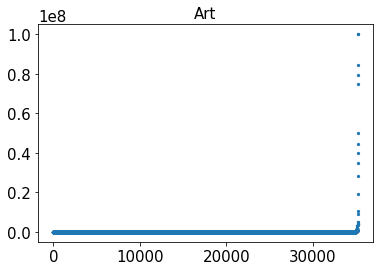



Film & Video :
count    5.650300e+04
mean     7.612296e+04
std      1.703545e+06
min      1.500000e-01
25%      2.500000e+03
50%      6.400000e+03
75%      2.000000e+04
max      1.513959e+08
Name: goal_usd, dtype: float64


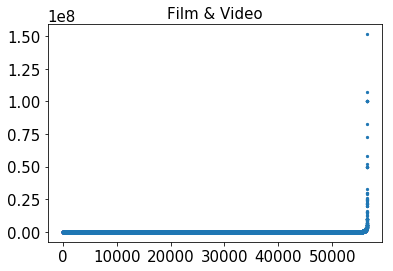



Publishing :
count    3.541300e+04
mean     1.755534e+04
std      5.881730e+05
min      5.500000e-01
25%      2.000000e+03
50%      4.995000e+03
75%      1.000000e+04
max      1.000000e+08
Name: goal_usd, dtype: float64


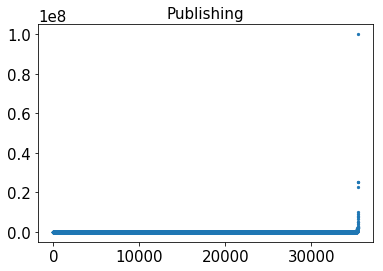



Comics :
count    1.222400e+04
mean     1.774913e+04
std      9.136786e+05
min      7.200000e-01
25%      1.350796e+03
50%      3.500000e+03
75%      7.897300e+03
max      1.000000e+08
Name: goal_usd, dtype: float64


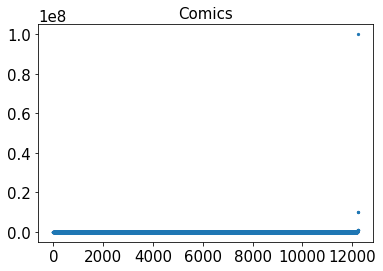



Music :
count    6.851300e+04
mean     1.252231e+04
std      2.788016e+05
min      7.400000e-01
25%      2.000000e+03
50%      4.200000e+03
75%      9.437623e+03
max      5.000000e+07
Name: goal_usd, dtype: float64


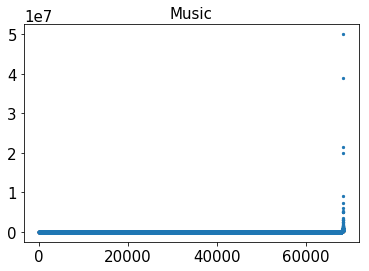



Games :
count    2.852000e+04
mean     3.894710e+04
std      8.731258e+05
min      7.500000e-01
25%      2.400000e+03
50%      7.500000e+03
75%      2.000000e+04
max      1.000000e+08
Name: goal_usd, dtype: float64


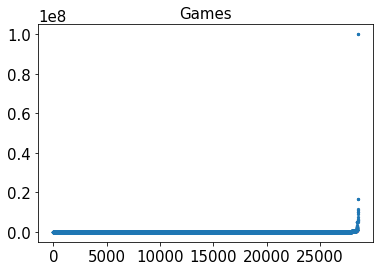



Design :
count    2.894100e+04
mean     3.619181e+04
std      6.529201e+05
min      7.500000e-01
25%      3.804550e+03
50%      1.000000e+04
75%      2.500000e+04
max      8.000000e+07
Name: goal_usd, dtype: float64


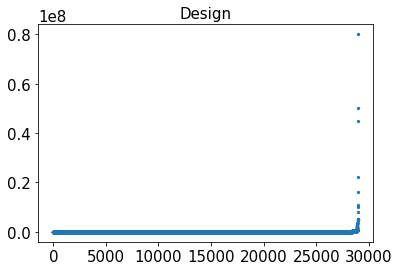



Technology :
count    3.894000e+04
mean     8.449875e+04
std      1.337287e+06
min      7.500000e-01
25%      7.000000e+03
50%      2.067690e+04
75%      5.034649e+04
max      1.101698e+08
Name: goal_usd, dtype: float64


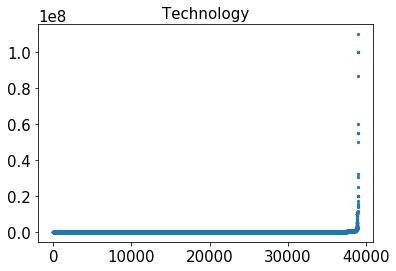



Food :
count    2.563900e+04
mean     4.491303e+04
std      1.253906e+06
min      8.800000e-01
25%      4.000000e+03
50%      1.000000e+04
75%      2.500000e+04
max      1.663614e+08
Name: goal_usd, dtype: float64


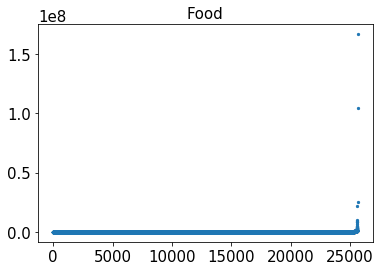



Crafts :
count    7.818000e+03
mean     9.954615e+03
std      1.221188e+05
min      1.000000e+00
25%      6.931025e+02
50%      2.176060e+03
75%      6.139340e+03
max      1.000000e+07
Name: goal_usd, dtype: float64


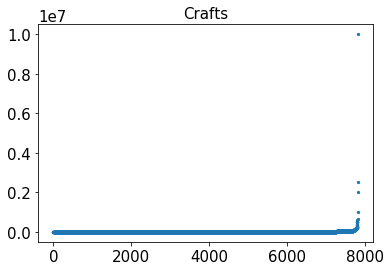



Photography :
count    1.200300e+04
mean     1.088658e+04
std      9.490086e+04
min      1.000000e+00
25%      1.500000e+03
50%      4.000000e+03
75%      9.990242e+03
max      7.300000e+06
Name: goal_usd, dtype: float64


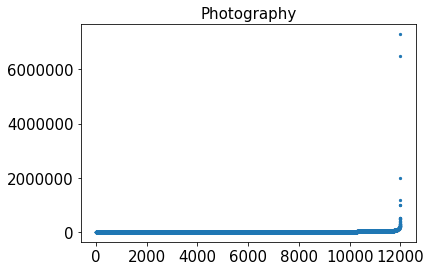



Theater :
count    1.886400e+04
mean     1.573736e+04
std      3.439334e+05
min      1.000000e+00
25%      1.711639e+03
50%      3.500000e+03
75%      7.500000e+03
max      4.000000e+07
Name: goal_usd, dtype: float64


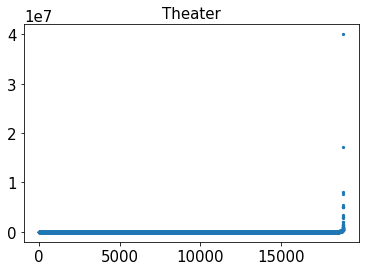



Journalism :
count    4.148000e+03
mean     7.011117e+04
std      1.706135e+06
min      1.000000e+00
25%      1.500000e+03
50%      5.000000e+03
75%      1.369403e+04
max      1.000000e+08
Name: goal_usd, dtype: float64


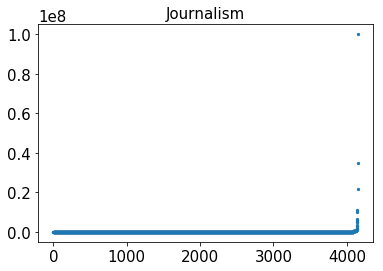



Fashion :
count    2.599200e+04
mean     2.132463e+04
std      6.377568e+05
min      1.000000e+00
25%      2.326855e+03
50%      6.800000e+03
75%      1.627568e+04
max      1.000000e+08
Name: goal_usd, dtype: float64


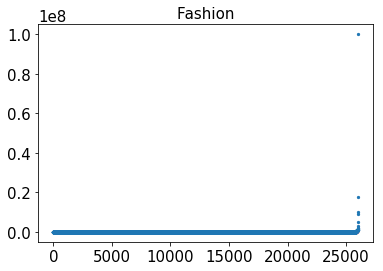



Dance :
count      20052.000000
mean        7281.881119
std        19408.535619
min            5.000000
25%         2000.000000
50%         3942.857143
75%         7500.000000
max      1000000.000000
Name: goal_usd, dtype: float64


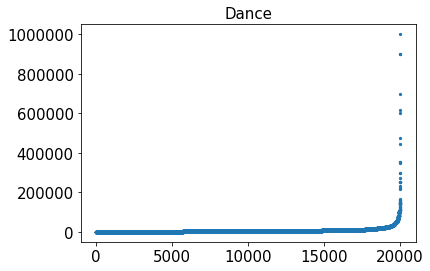



writing :
count     10741.000000
mean       7999.259424
std       13763.509331
min         300.000000
25%        1994.029851
50%        4495.049505
75%        9066.666667
max      375150.000000
Name: goal_usd, dtype: float64


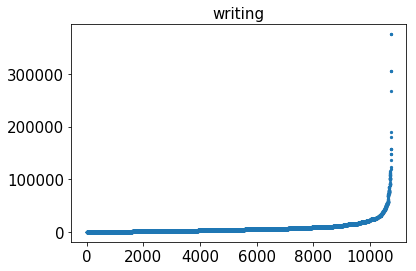



film :
count    5.449500e+04
mean     1.801731e+04
std      6.583212e+04
min      3.000000e+02
25%      2.500000e+03
50%      5.884615e+03
75%      1.520000e+04
max      3.379000e+06
Name: goal_usd, dtype: float64


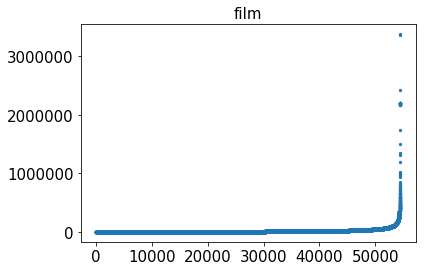



community :
count    1.762900e+04
mean     1.658050e+04
std      5.062446e+04
min      3.000000e+02
25%      2.005797e+03
50%      5.032258e+03
75%      1.498532e+04
max      3.379000e+06
Name: goal_usd, dtype: float64


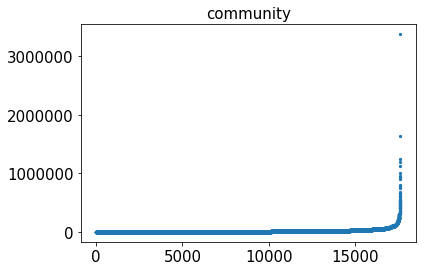



gaming :
count    2.513000e+03
mean     2.476614e+04
std      1.145757e+05
min      3.000000e+02
25%      1.798413e+03
50%      5.196970e+03
75%      1.753846e+04
max      2.028950e+06
Name: goal_usd, dtype: float64


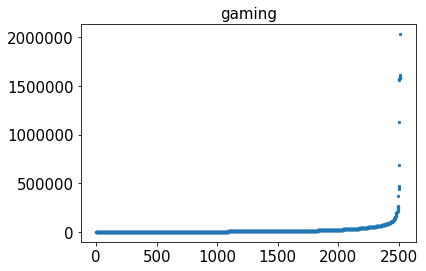



video_games :
count    2.146000e+03
mean     2.475610e+04
std      8.701466e+04
min      3.000000e+02
25%      2.391560e+03
50%      6.881818e+03
75%      2.102064e+04
max      2.028950e+06
Name: goal_usd, dtype: float64


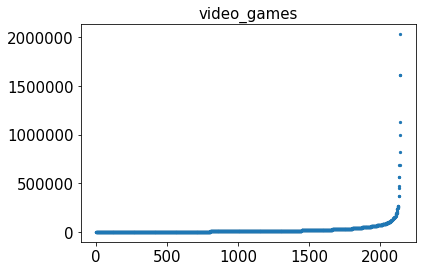



education :
count    1.702500e+04
mean     1.780813e+04
std      1.136213e+05
min      3.000000e+02
25%      2.378759e+03
50%      5.300000e+03
75%      1.493333e+04
max      8.013037e+06
Name: goal_usd, dtype: float64


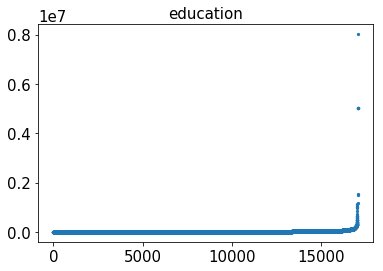



energy_green_tech :
count    8.900000e+01
mean     7.716494e+04
std      2.084706e+05
min      3.000000e+02
25%      7.600000e+03
50%      2.445082e+04
75%      5.350000e+04
max      1.310500e+06
Name: goal_usd, dtype: float64


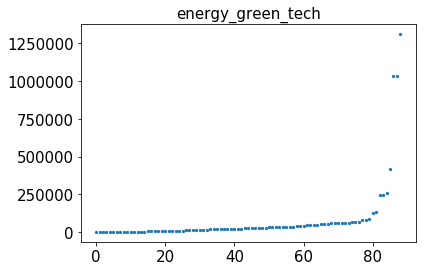



travel_outdoors :
count      1223.000000
mean      26291.352833
std       45671.059887
min         300.000000
25%        3842.480019
50%        9998.529412
75%       29182.825000
max      508000.000000
Name: goal_usd, dtype: float64


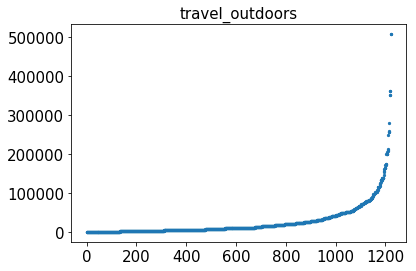



environment :
count    3.044000e+03
mean     2.634230e+04
std      7.875391e+04
min      3.590400e+02
25%      3.696765e+03
50%      9.733333e+03
75%      2.447955e+04
max      2.701800e+06
Name: goal_usd, dtype: float64


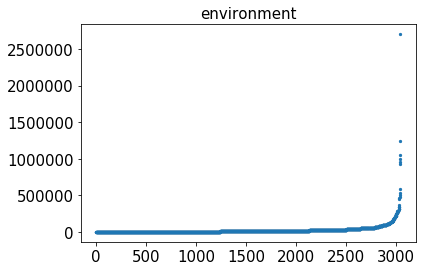



culture :
count        96.000000
mean      16641.857758
std       20658.452834
min         386.050000
25%        3131.250000
50%        9919.588414
75%       24929.391895
max      108241.176500
Name: goal_usd, dtype: float64


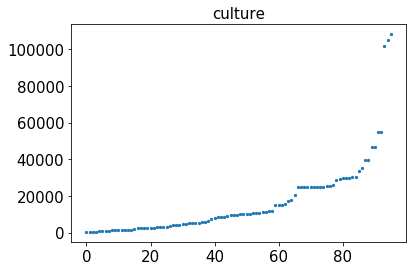



animals :
count      6180.000000
mean      15770.147896
std       43572.953195
min         386.050000
25%        1504.274425
50%        3968.750000
75%       10776.190480
max      799450.000000
Name: goal_usd, dtype: float64


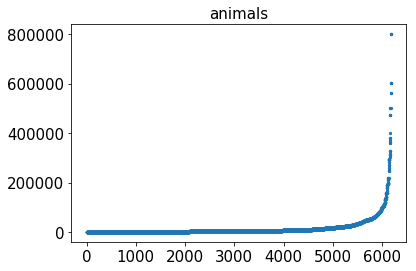



health :
count    1.557200e+04
mean     2.331089e+04
std      5.726537e+04
min      3.860500e+02
25%      3.007812e+03
50%      8.583128e+03
75%      2.450000e+04
max      2.005350e+06
Name: goal_usd, dtype: float64


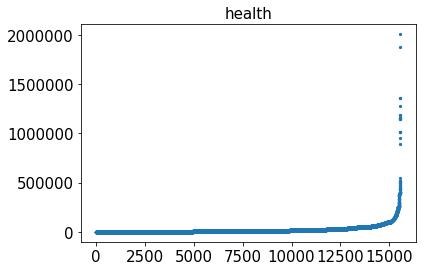



local_businesses :
count    2.034700e+04
mean     2.266941e+04
std      4.824031e+04
min      3.860500e+02
25%      3.419282e+03
50%      9.832518e+03
75%      2.450833e+04
max      1.640000e+06
Name: goal_usd, dtype: float64


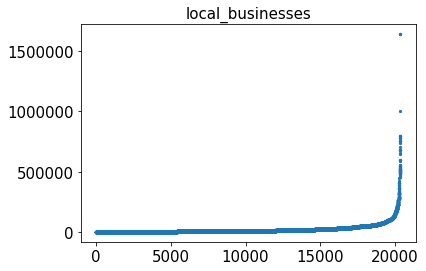



video_web :
count      4741.000000
mean      16652.118732
std       38467.641874
min         386.050000
25%        2615.789474
50%        6075.892857
75%       15500.000000
max      748453.333300
Name: goal_usd, dtype: float64


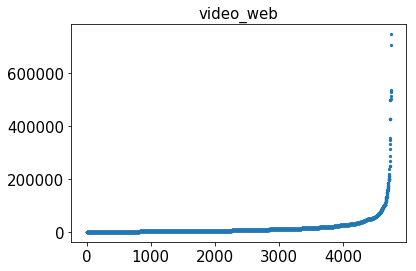



politics :
count      1243.000000
mean      18300.674263
std       43382.546423
min         386.050000
25%        2011.190671
50%        6691.490909
75%       17500.000000
max      649540.000000
Name: goal_usd, dtype: float64


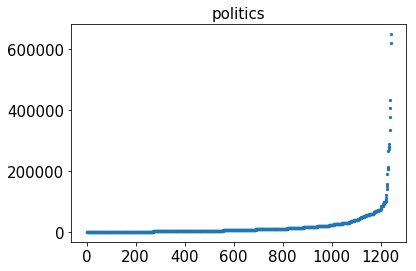



sports :
count    2.928000e+03
mean     1.807999e+04
std      5.792648e+04
min      3.860500e+02
25%      2.000000e+03
50%      5.031250e+03
75%      1.495697e+04
max      1.217265e+06
Name: goal_usd, dtype: float64


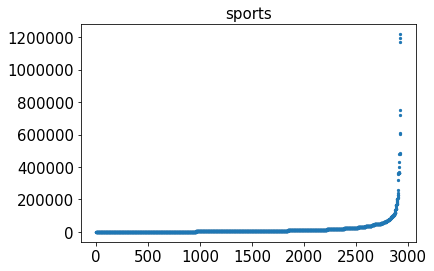



religion :
count    1.017000e+03
mean     1.956067e+04
std      8.651060e+04
min      3.931000e+02
25%      2.148148e+03
50%      5.030769e+03
75%      1.360000e+04
max      2.428100e+06
Name: goal_usd, dtype: float64


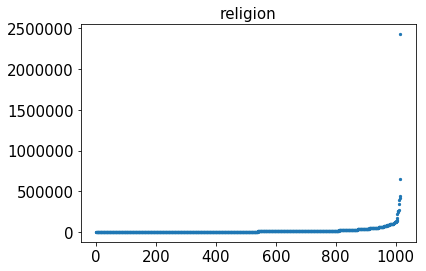



home :
count       929.000000
mean      36871.485476
std       60987.596671
min         393.100000
25%        5333.333333
50%       16666.666670
75%       49792.307690
max      783300.000000
Name: goal_usd, dtype: float64


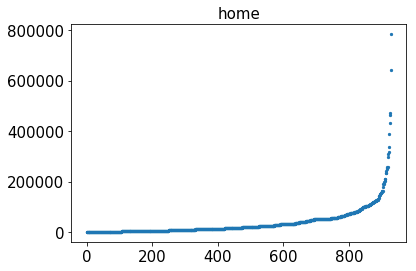



small_business :
count      6385.000000
mean      23818.582956
std       40428.967439
min         393.100000
25%        5000.000000
50%       10694.805190
75%       25794.512200
max      778000.000000
Name: goal_usd, dtype: float64


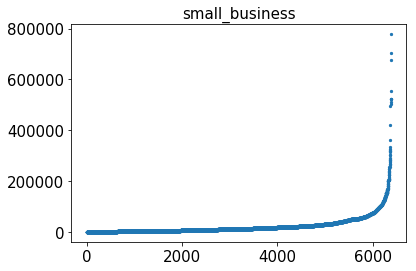



human_rights :
count       464.000000
mean      17370.207441
std       36532.300996
min         393.100000
25%        2287.633333
50%        6071.092683
75%       16787.500000
max      463600.000000
Name: goal_usd, dtype: float64


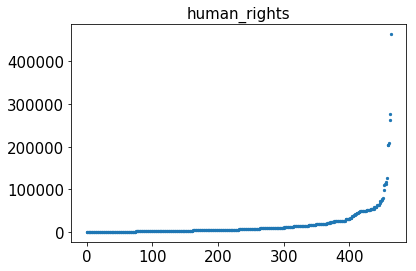



phones_accessories :
count    2.783000e+03
mean     6.723133e+04
std      8.670553e+05
min      3.931000e+02
25%      6.709376e+03
50%      2.053333e+04
75%      4.967083e+04
max      3.203554e+07
Name: goal_usd, dtype: float64


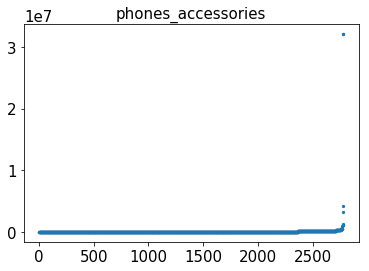



camera_gear :
count       293.000000
mean      33457.829999
std       82172.399572
min         393.100000
25%        2693.750000
50%        9884.615385
75%       35454.545450
max      899300.719400
Name: goal_usd, dtype: float64


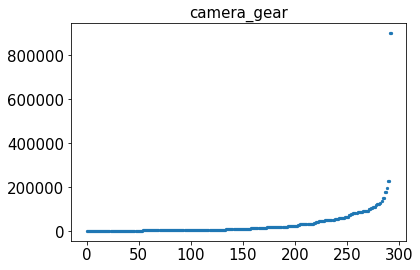



productivity :
count    4.320000e+02
mean     3.782108e+04
std      9.692242e+04
min      4.000000e+02
25%      4.982903e+03
50%      1.591250e+04
75%      4.915297e+04
max      1.813990e+06
Name: goal_usd, dtype: float64


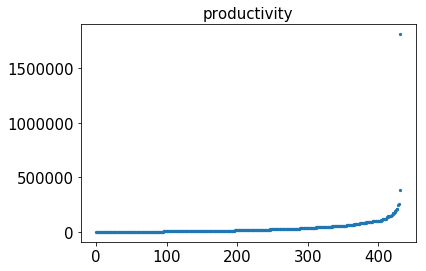



transmedia :
count       807.000000
mean      18288.326866
std       46422.208400
min         423.170192
25%        3131.178314
50%        6846.153846
75%       18764.285715
max      990541.176500
Name: goal_usd, dtype: float64


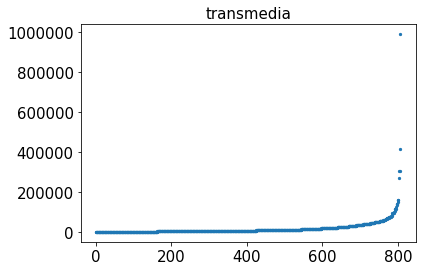



audio :
count       319.000000
mean      35814.583906
std       42401.908166
min         433.333333
25%        7442.642140
50%       23114.611870
75%       50100.057400
max      292567.918100
Name: goal_usd, dtype: float64


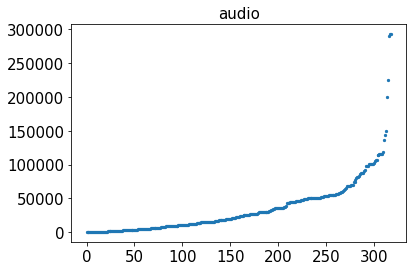



tabletop_games :
count        93.000000
mean      14048.904077
std       44456.766167
min         483.333333
25%        1955.555556
50%        3433.333333
75%        5840.000000
max      343000.000000
Name: goal_usd, dtype: float64


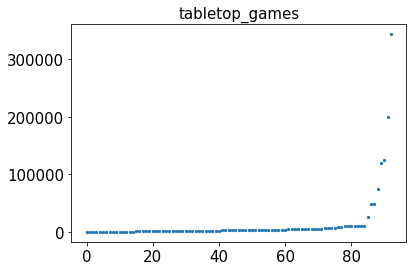



transportation :
count       396.000000
mean      45552.103937
std       73780.642372
min         500.000000
25%        7523.868828
50%       24570.266670
75%       54503.708787
max      761400.000000
Name: goal_usd, dtype: float64


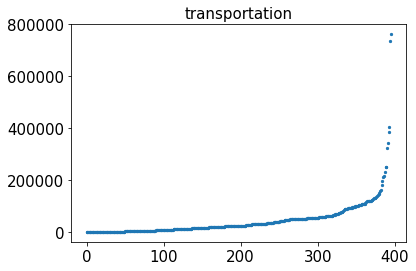



creative_works :
count       168.000000
mean      20587.491217
std       67520.740281
min         500.000000
25%        1513.157895
50%        4996.225423
75%       11502.777777
max      544100.000000
Name: goal_usd, dtype: float64


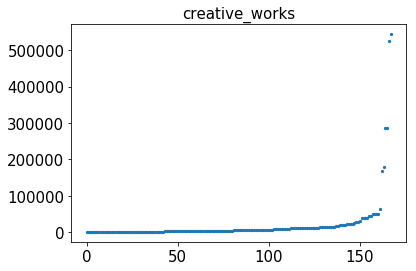



wellness :
count       126.000000
mean      18486.636882
std       34321.730146
min         500.000000
25%        2459.285714
50%        7558.086708
75%       18632.856307
max      254900.000000
Name: goal_usd, dtype: float64


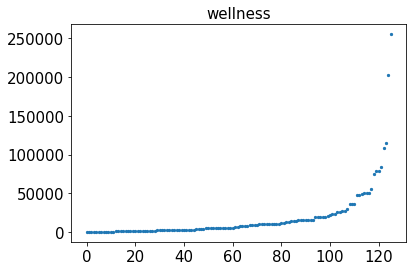



podcasts_blogs_vlogs :
count        26.000000
mean      43570.991198
std      134378.307598
min         500.000000
25%        1307.954545
50%        4115.150770
75%        9981.927711
max      499702.826900
Name: goal_usd, dtype: float64


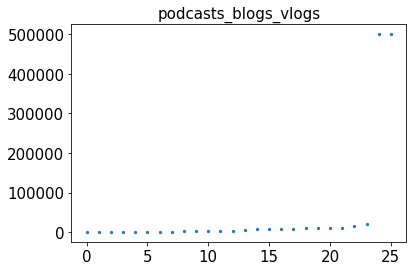



spirituality :
count        40.000000
mean      16770.312545
std       27429.016101
min        1000.000000
25%        3027.173913
50%        7517.290367
75%       11804.545452
max      125000.000000
Name: goal_usd, dtype: float64


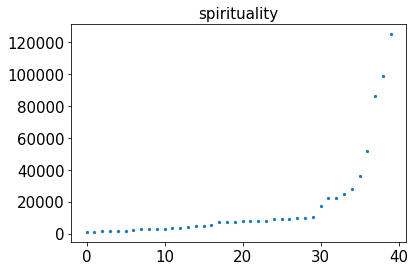

In [75]:
fontsize=15
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize
plt.rcParams['axes.labelsize'] = fontsize

for i in data['category'].unique():
    print(i,':')
    des = data.loc[data['category']==i]['goal_usd'].describe()
    print(des)
    plt.figure()
    x=data.loc[data['category']==i]['goal_usd'].sort_values()
    plt.scatter(range(x.shape[0]),x, s=5)
    plt.title(i)
    plt.show()
    print('\n')

In [76]:
sta2_goal_usd=pd.DataFrame(data['category'].unique(),columns=['category'])
mean=[]
std=[]
Q1=[]
Q3=[]
Max=[]
for i in data['category'].unique():
    des = data.loc[data['category']==i]['goal_usd'].describe()  
    mean.append(round(des['mean'],2))
    std.append(round(des['std'],2))
    Q1.append(round(des['25%'],2))
    Q3.append(round(des['75%'],2))
    Max.append(round(des['max'],2))
sta2_goal_usd['mean']=mean
sta2_goal_usd['std']=std
sta2_goal_usd['Q1']=Q1
sta2_goal_usd['Q3']=Q3
sta2_goal_usd['max']=Max
sta2_goal_usd.set_index('category',drop=True,inplace=True)

按每個category本身包含的專案數量大小排序，其中category為music的類別本身包含的專案數最多

In [77]:
sta2_goal_usd.loc[sta1_category['class'].values]

,mean,std,Q1,Q3,max
category,,,,,
Music,12522.31,278801.61,2000.00,9437.62,5.000000e+07
Film & Video,76122.96,1703544.55,2500.00,20000.00,1.513959e+08
film,18017.31,65832.12,2500.00,15200.00,3.379000e+06
Technology,84498.75,1337286.63,7000.00,50346.49,1.101698e+08
Publishing,17555.34,588173.02,2000.00,10000.00,1.000000e+08
Art,31373.91,1167600.32,1000.00,7999.79,1.000000e+08
Design,36191.81,652920.08,3804.55,25000.00,8.000000e+07
Games,38947.10,873125.80,2400.00,20000.00,1.000000e+08
Fashion,21324.63,637756.77,2326.86,16275.68,1.000000e+08


按每個category下goal_usd的平均值排序

In [78]:
df=sta2_goal_usd.sort_values(by='mean',ascending=False)
df

,mean,std,Q1,Q3,max
category,,,,,
Technology,84498.75,1337286.63,7000.00,50346.49,1.101698e+08
energy_green_tech,77164.94,208470.55,7600.00,53500.00,1.310500e+06
Film & Video,76122.96,1703544.55,2500.00,20000.00,1.513959e+08
Journalism,70111.17,1706134.80,1500.00,13694.04,1.000000e+08
phones_accessories,67231.33,867055.28,6709.38,49670.83,3.203554e+07
transportation,45552.10,73780.64,7523.87,54503.71,7.614000e+05
Food,44913.03,1253906.29,4000.00,25000.00,1.663614e+08
podcasts_blogs_vlogs,43570.99,134378.31,1307.95,9981.93,4.997028e+05
Games,38947.10,873125.80,2400.00,20000.00,1.000000e+08


按每個category下goal_usd的離散程度排序

In [79]:
df=sta2_goal_usd.sort_values(by='std',ascending=False)
df

,mean,std,Q1,Q3,max
category,,,,,
Journalism,70111.17,1706134.80,1500.00,13694.04,1.000000e+08
Film & Video,76122.96,1703544.55,2500.00,20000.00,1.513959e+08
Technology,84498.75,1337286.63,7000.00,50346.49,1.101698e+08
Food,44913.03,1253906.29,4000.00,25000.00,1.663614e+08
Art,31373.91,1167600.32,1000.00,7999.79,1.000000e+08
Comics,17749.13,913678.65,1350.80,7897.30,1.000000e+08
Games,38947.10,873125.80,2400.00,20000.00,1.000000e+08
phones_accessories,67231.33,867055.28,6709.38,49670.83,3.203554e+07
Design,36191.81,652920.08,3804.55,25000.00,8.000000e+07


按每個category下goal_usd的最大值排序

In [80]:
df=sta2_goal_usd.sort_values(by='max',ascending=False)
df

,mean,std,Q1,Q3,max
category,,,,,
Food,44913.03,1253906.29,4000.00,25000.00,1.663614e+08
Film & Video,76122.96,1703544.55,2500.00,20000.00,1.513959e+08
Technology,84498.75,1337286.63,7000.00,50346.49,1.101698e+08
Art,31373.91,1167600.32,1000.00,7999.79,1.000000e+08
Fashion,21324.63,637756.77,2326.86,16275.68,1.000000e+08
Publishing,17555.34,588173.02,2000.00,10000.00,1.000000e+08
Comics,17749.13,913678.65,1350.80,7897.30,1.000000e+08
Games,38947.10,873125.80,2400.00,20000.00,1.000000e+08
Journalism,70111.17,1706134.80,1500.00,13694.04,1.000000e+08


### 5. 不同category下pledged_usd敘述統計

Art :
count    3.515100e+04
mean     3.547491e+03
std      2.119411e+04
min      0.000000e+00
25%      1.110000e+02
50%      8.250000e+02
75%      2.821000e+03
max      1.924018e+06
Name: pledged_usd, dtype: float64


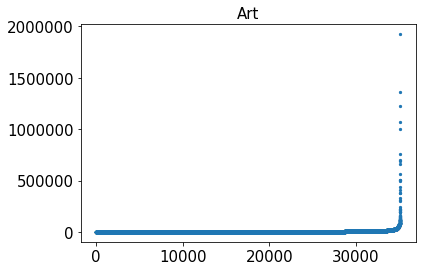



Film & Video :
count    5.650300e+04
mean     6.716799e+03
std      4.378515e+04
min      0.000000e+00
25%      5.100000e+01
50%      9.636800e+02
75%      5.145000e+03
max      5.764229e+06
Name: pledged_usd, dtype: float64


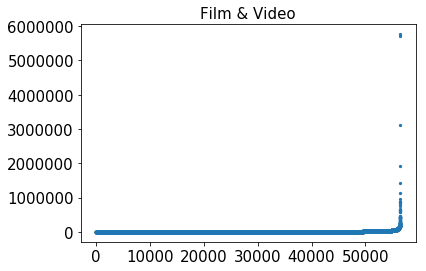



Publishing :
count     35413.000000
mean       3692.415368
std       15638.073416
min           0.000000
25%          25.000000
50%         382.000000
75%        2750.000000
max      866193.500000
Name: pledged_usd, dtype: float64


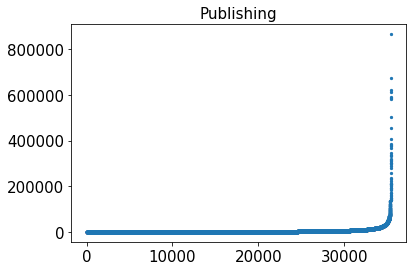



Comics :
count    1.222400e+04
mean     6.546372e+03
std      2.352556e+04
min      0.000000e+00
25%      4.950000e+02
50%      1.650000e+03
75%      5.012227e+03
max      1.254120e+06
Name: pledged_usd, dtype: float64


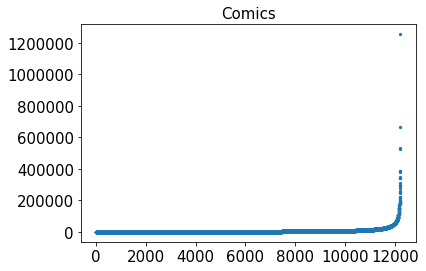



Music :
count    6.851300e+04
mean     4.054950e+03
std      1.429305e+04
min      0.000000e+00
25%      2.727168e+02
50%      1.425000e+03
75%      4.205000e+03
max      1.665254e+06
Name: pledged_usd, dtype: float64


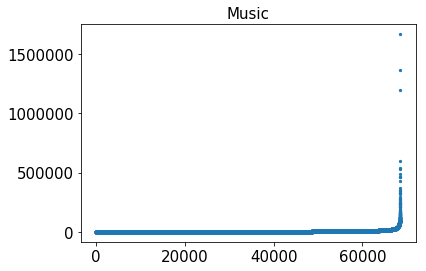



Games :
count    2.852000e+04
mean     2.507250e+04
std      1.869390e+05
min      0.000000e+00
25%      1.409675e+02
50%      1.743000e+03
75%      1.019225e+04
max      1.239314e+07
Name: pledged_usd, dtype: float64


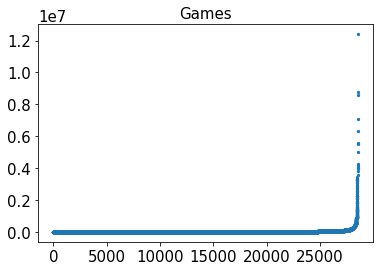



Design :
count    2.894100e+04
mean     2.901019e+04
std      2.331712e+05
min      0.000000e+00
25%      3.530000e+02
50%      2.360000e+03
75%      1.261100e+04
max      2.033899e+07
Name: pledged_usd, dtype: float64


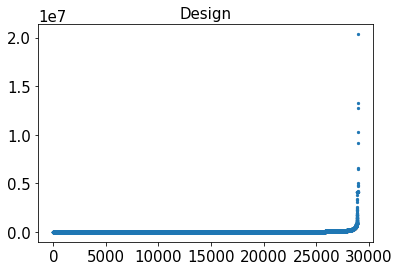



Technology :
count    3.894000e+04
mean     5.862748e+04
std      3.186807e+05
min      0.000000e+00
25%      6.200000e+01
50%      1.382500e+03
75%      1.614077e+04
max      1.327041e+07
Name: pledged_usd, dtype: float64


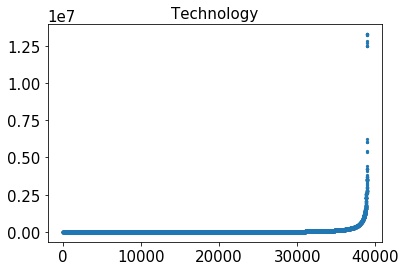



Food :
count    2.563900e+04
mean     6.034543e+03
std      3.996809e+04
min      0.000000e+00
25%      3.000000e+01
50%      6.150000e+02
75%      4.412500e+03
max      2.769041e+06
Name: pledged_usd, dtype: float64


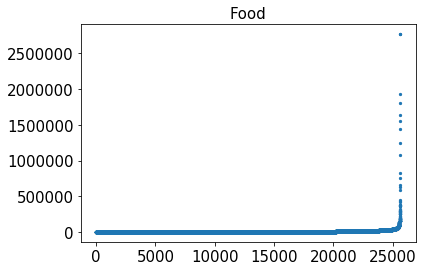



Crafts :
count      7818.000000
mean       1784.832227
std        8508.694564
min           0.000000
25%          10.000000
50%         109.630000
75%         832.250000
max      454717.530000
Name: pledged_usd, dtype: float64


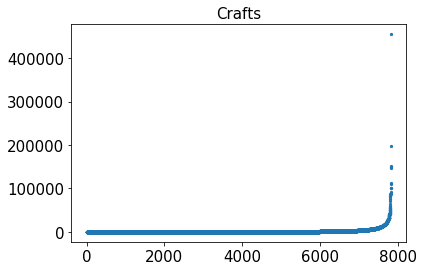



Photography :
count     12003.000000
mean       4053.463545
std       19455.005644
min           0.000000
25%          40.000000
50%         605.000000
75%        2844.630000
max      793266.770000
Name: pledged_usd, dtype: float64


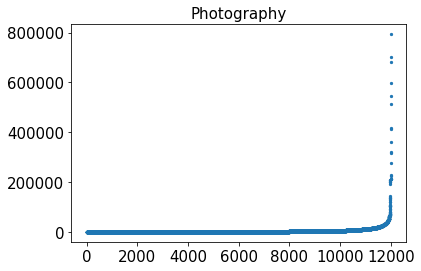



Theater :
count     18864.000000
mean       3712.013222
std        8991.520361
min           0.000000
25%         750.000000
50%        1790.000000
75%        3975.000000
max      447521.000000
Name: pledged_usd, dtype: float64


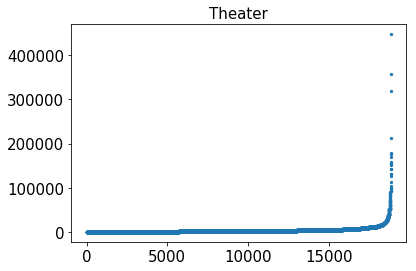



Journalism :
count      4148.000000
mean       2940.007030
std       11105.781588
min           0.000000
25%           1.000000
50%          74.595000
75%        1080.075000
max      215487.750000
Name: pledged_usd, dtype: float64


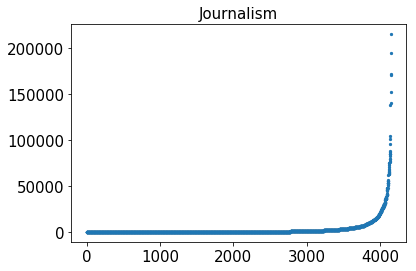



Fashion :
count    2.599200e+04
mean     8.094778e+03
std      4.361283e+04
min      0.000000e+00
25%      4.800000e+01
50%      6.844500e+02
75%      3.703500e+03
max      1.851033e+06
Name: pledged_usd, dtype: float64


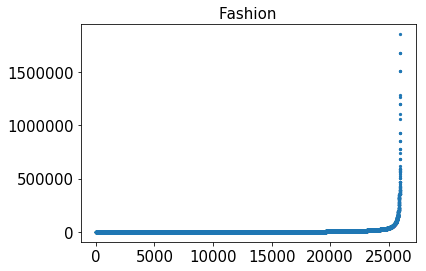



Dance :
count     20052.000000
mean       3073.930935
std        6534.898434
min           0.000000
25%         840.000000
50%        1685.000000
75%        3541.500000
max      447521.000000
Name: pledged_usd, dtype: float64


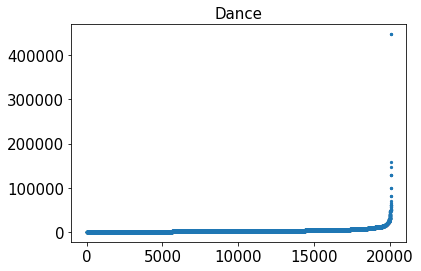



writing :
count     10741.000000
mean       3311.909169
std        6403.468799
min           3.000000
25%         740.000000
50%        1443.340800
75%        3351.686100
max      181676.000000
Name: pledged_usd, dtype: float64


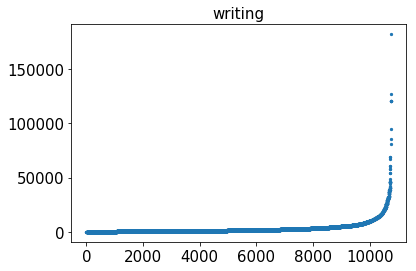



film :
count    5.449500e+04
mean     7.677034e+03
std      8.439485e+04
min      3.000000e+00
25%      7.416080e+02
50%      1.587456e+03
75%      3.860000e+03
max      4.599290e+06
Name: pledged_usd, dtype: float64


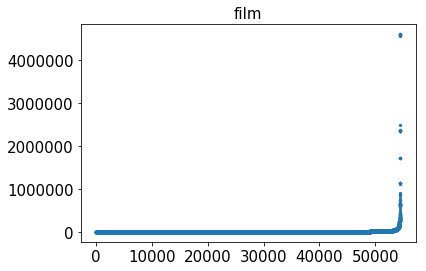



community :
count    1.762900e+04
mean     4.793408e+03
std      2.449677e+04
min      3.000000e+00
25%      8.410000e+02
50%      1.655000e+03
75%      3.942000e+03
max      2.532180e+06
Name: pledged_usd, dtype: float64


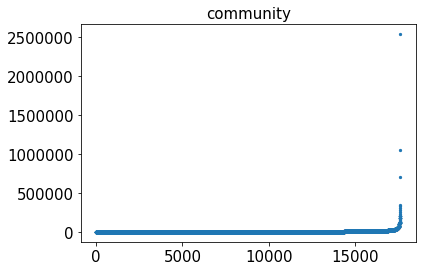



gaming :
count    2.513000e+03
mean     1.734978e+04
std      1.296663e+05
min      3.000000e+00
25%      7.120000e+02
50%      1.695000e+03
75%      6.307000e+03
max      1.991830e+06
Name: pledged_usd, dtype: float64


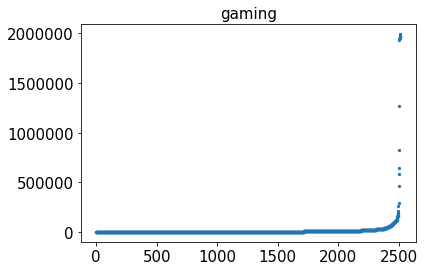



video_games :
count    2.146000e+03
mean     1.301258e+04
std      8.564312e+04
min      3.000000e+00
25%      6.472040e+02
50%      1.371533e+03
75%      4.919522e+03
max      2.002450e+06
Name: pledged_usd, dtype: float64


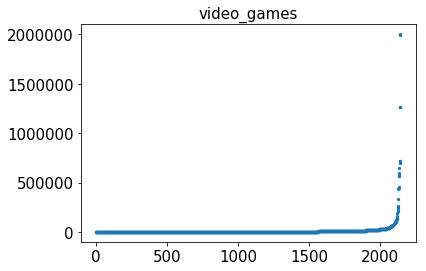



education :
count    1.702500e+04
mean     6.602562e+03
std      1.002554e+05
min      3.000000e+00
25%      7.300000e+02
50%      1.500000e+03
75%      3.455000e+03
max      5.048213e+06
Name: pledged_usd, dtype: float64


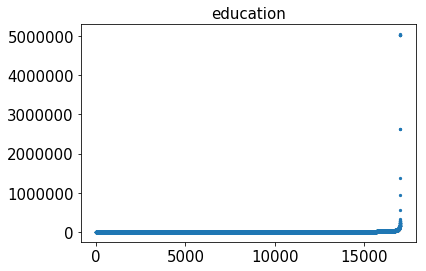



energy_green_tech :
count    8.900000e+01
mean     4.102187e+05
std      1.996043e+06
min      3.000000e+00
25%      5.290000e+02
50%      3.210000e+03
75%      7.610600e+04
max      1.327266e+07
Name: pledged_usd, dtype: float64


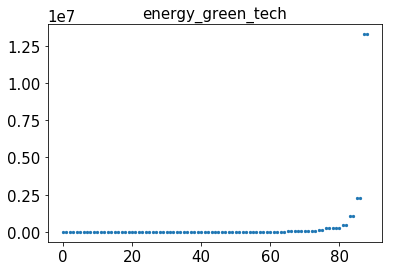



travel_outdoors :
count    1.223000e+03
mean     3.913230e+04
std      2.874837e+05
min      3.000000e+00
25%      7.930000e+02
50%      1.827000e+03
75%      6.080000e+03
max      4.419724e+06
Name: pledged_usd, dtype: float64


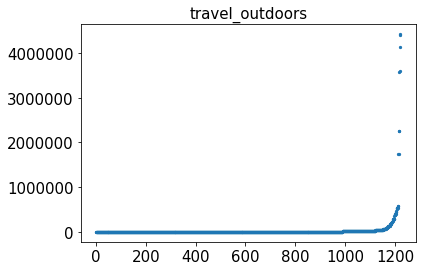



environment :
count    3.044000e+03
mean     8.896963e+03
std      4.599447e+04
min      3.590400e+00
25%      7.309336e+02
50%      1.778500e+03
75%      4.782550e+03
max      1.191686e+06
Name: pledged_usd, dtype: float64


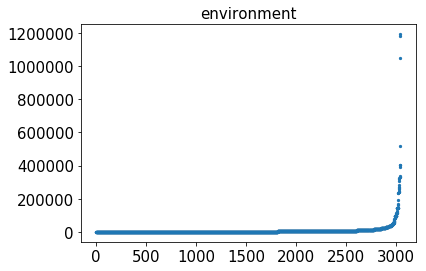



culture :
count        96.000000
mean       4153.741059
std       12418.306987
min           3.931000
25%         238.750000
50%         858.500000
75%        2346.750000
max      110406.000000
Name: pledged_usd, dtype: float64


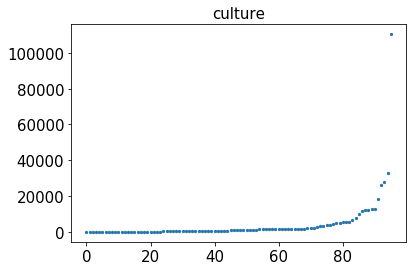



animals :
count      6180.000000
mean       4289.374602
std       17062.823985
min           7.180800
25%         725.000000
50%        1323.000000
75%        3020.500000
max      500072.000000
Name: pledged_usd, dtype: float64


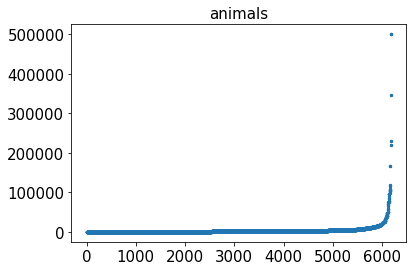



health :
count    1.557200e+04
mean     1.105817e+04
std      6.579629e+04
min      5.000000e+00
25%      8.958720e+02
50%      1.905306e+03
75%      5.002624e+03
max      1.823075e+06
Name: pledged_usd, dtype: float64


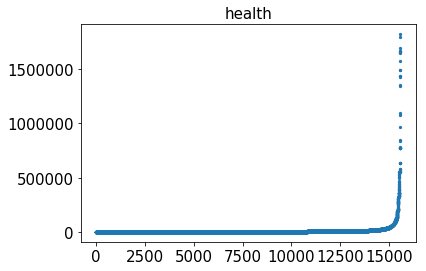



local_businesses :
count    2.034700e+04
mean     5.873864e+03
std      3.052291e+04
min      4.000000e+00
25%      8.140800e+02
50%      1.730000e+03
75%      4.425000e+03
max      2.532180e+06
Name: pledged_usd, dtype: float64


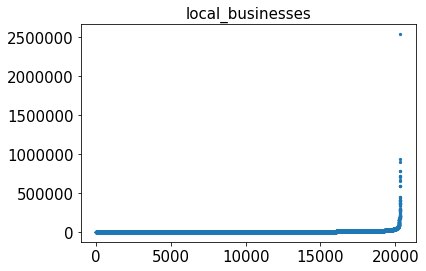



video_web :
count    4.741000e+03
mean     8.900176e+03
std      1.001500e+05
min      4.000000e+00
25%      8.000000e+02
50%      1.661158e+03
75%      3.736000e+03
max      3.156178e+06
Name: pledged_usd, dtype: float64


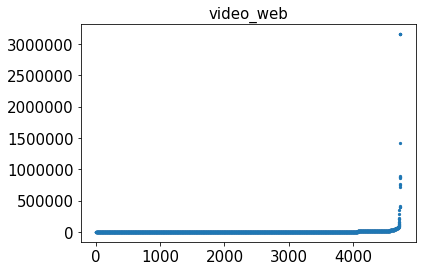



politics :
count      1243.000000
mean       8256.643653
std       23306.891603
min           5.000000
25%         850.356800
50%        1800.000000
75%        5607.000000
max      293869.312000
Name: pledged_usd, dtype: float64


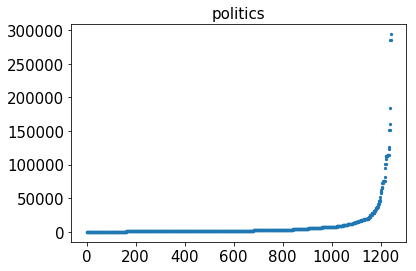



sports :
count      2928.000000
mean       5174.494143
std       20666.953524
min          10.000000
25%         799.110400
50%        1464.343200
75%        3297.500000
max      402509.644800
Name: pledged_usd, dtype: float64


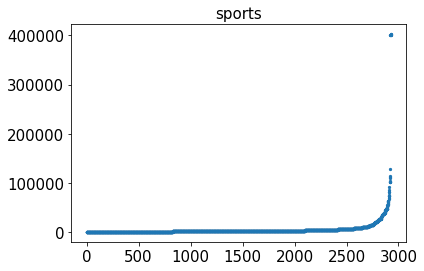



religion :
count      1017.000000
mean       4056.973228
std       15003.527429
min          15.000000
25%         785.000000
50%        1460.000000
75%        3233.000000
max      411262.000000
Name: pledged_usd, dtype: float64


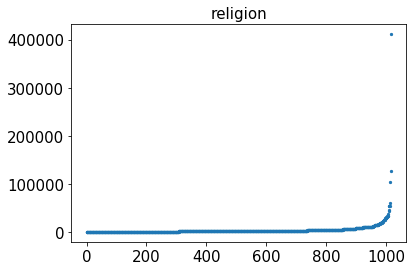



home :
count    9.290000e+02
mean     7.336468e+04
std      2.734993e+05
min      1.200000e+01
25%      8.923370e+02
50%      2.765000e+03
75%      1.504700e+04
max      3.678070e+06
Name: pledged_usd, dtype: float64


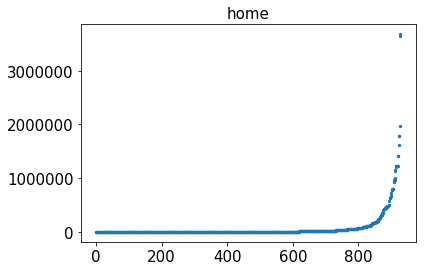



small_business :
count      6385.000000
mean       6131.992544
std       31849.590773
min           5.000000
25%         805.855000
50%        1710.000000
75%        4490.000000
max      785352.000000
Name: pledged_usd, dtype: float64


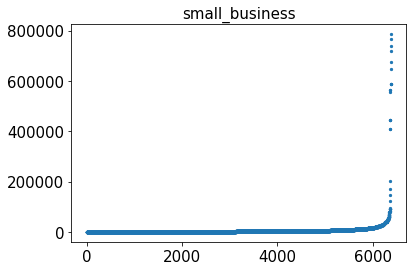



human_rights :
count       464.000000
mean       7656.574541
std       39567.665008
min          21.000000
25%         629.750000
50%        1426.428000
75%        4016.299600
max      595359.000000
Name: pledged_usd, dtype: float64


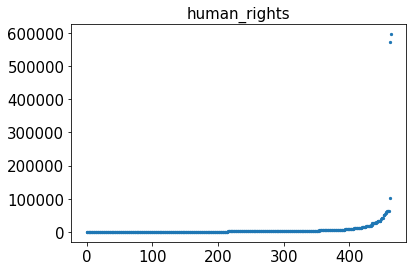



phones_accessories :
count    2.783000e+03
mean     6.019029e+04
std      3.963663e+05
min      8.140800e+00
25%      1.003000e+03
50%      2.900000e+03
75%      2.015100e+04
max      1.281422e+07
Name: pledged_usd, dtype: float64


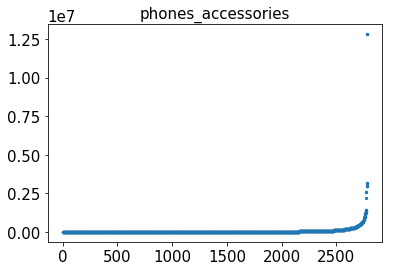



camera_gear :
count    2.930000e+02
mean     9.560584e+04
std      3.314208e+05
min      9.497600e+00
25%      1.000000e+03
50%      2.515000e+03
75%      2.751300e+04
max      3.516542e+06
Name: pledged_usd, dtype: float64


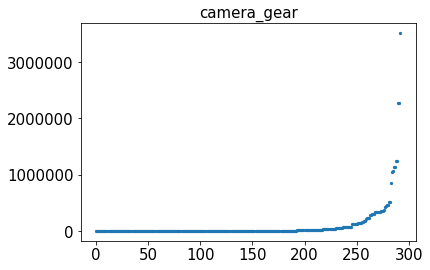



productivity :
count    4.320000e+02
mean     3.066748e+04
std      1.356426e+05
min      4.000000e+00
25%      6.760000e+02
50%      1.633000e+03
75%      7.528250e+03
max      1.537680e+06
Name: pledged_usd, dtype: float64


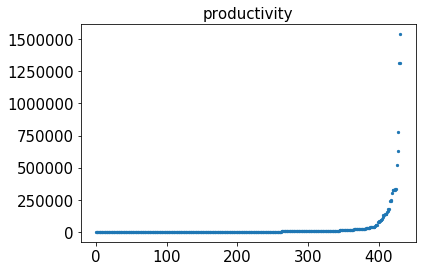



transmedia :
count       807.000000
mean       5417.252139
std       15022.868120
min          10.000000
25%         982.000000
50%        2150.000000
75%        4724.000000
max      336784.000000
Name: pledged_usd, dtype: float64


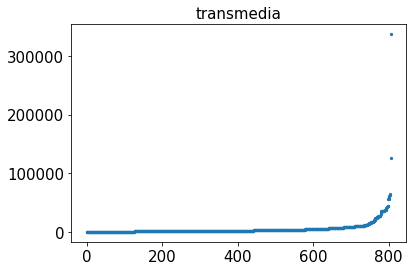



audio :
count    3.190000e+02
mean     1.533198e+05
std      4.767408e+05
min      1.300000e+01
25%      9.721992e+02
50%      6.657000e+03
75%      8.642400e+04
max      3.428896e+06
Name: pledged_usd, dtype: float64


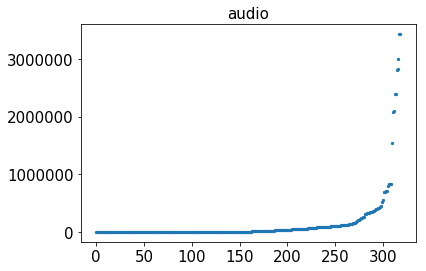



tabletop_games :
count        93.000000
mean      11765.469913
std       42092.681525
min          25.000000
25%         382.976000
50%        1340.000000
75%        4862.000000
max      289460.000000
Name: pledged_usd, dtype: float64


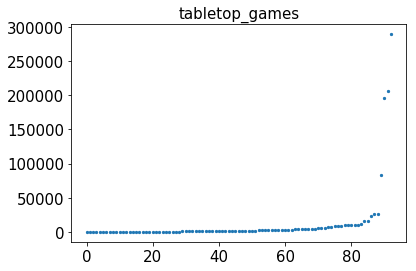



transportation :
count    3.960000e+02
mean     1.275503e+05
std      5.523054e+05
min      2.500000e+01
25%      9.346160e+02
50%      2.822000e+03
75%      2.373892e+04
max      6.051571e+06
Name: pledged_usd, dtype: float64


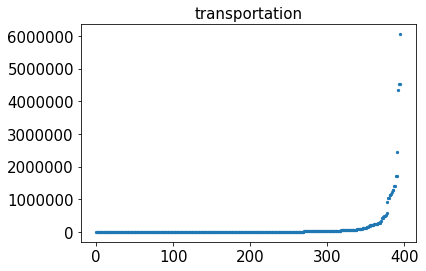



creative_works :
count      168.000000
mean      7859.595904
std      19694.347805
min         15.000000
25%        149.812000
50%       1046.000000
75%       3751.162000
max      86431.000000
Name: pledged_usd, dtype: float64


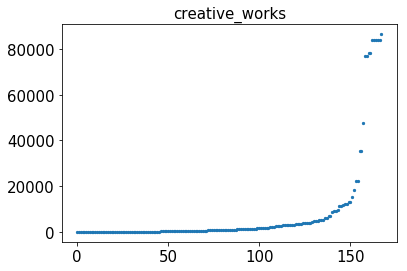



wellness :
count      126.000000
mean      5339.661887
std      13195.830785
min         20.000000
25%        270.000000
50%        948.685500
75%       3309.250000
max      83546.000000
Name: pledged_usd, dtype: float64


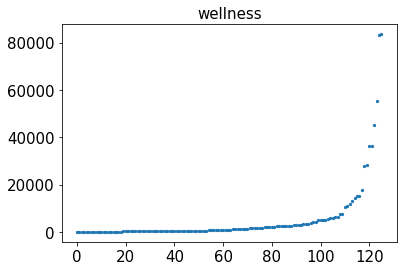



podcasts_blogs_vlogs :
count    2.600000e+01
mean     1.109248e+05
std      3.836742e+05
min      2.500000e+01
25%      2.000000e+02
50%      1.004012e+03
75%      3.898500e+03
max      1.414159e+06
Name: pledged_usd, dtype: float64


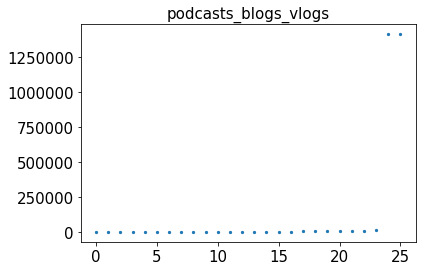



spirituality :
count       40.000000
mean      3426.924350
std       4941.884241
min         10.000000
25%        358.908000
50%       1407.231200
75%       4968.750000
max      27642.000000
Name: pledged_usd, dtype: float64


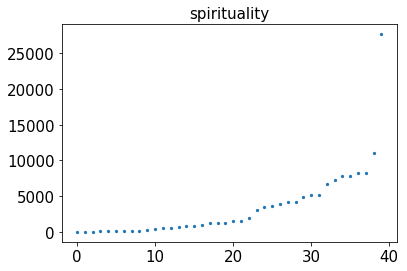

In [81]:
fontsize=15
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize
plt.rcParams['axes.labelsize'] = fontsize

for i in data['category'].unique():
    print(i,':')
    des = data.loc[data['category']==i]['pledged_usd'].describe()
    print(des)
    plt.figure()
    x=data.loc[data['category']==i]['pledged_usd'].sort_values()
    plt.scatter(range(x.shape[0]),x, s=5)
    plt.title(i)
    plt.show()
    print('\n')

In [82]:
sta2_pledged_usd=pd.DataFrame(data['category'].unique(),columns=['category'])
mean=[]
std=[]
Q1=[]
Q3=[]
Max=[]
for i in data['category'].unique():
    des = data.loc[data['category']==i]['pledged_usd'].describe()  
    mean.append(round(des['mean'],2))
    std.append(round(des['std'],2))
    Q1.append(round(des['25%'],2))
    Q3.append(round(des['75%'],2))
    Max.append(round(des['max'],2))
sta2_pledged_usd['mean']=mean
sta2_pledged_usd['std']=std
sta2_pledged_usd['Q1']=Q1
sta2_pledged_usd['Q3']=Q3
sta2_pledged_usd['max']=Max
sta2_pledged_usd.set_index('category',drop=True,inplace=True)

按每個category本身包含的專案數量大小排序，其中category為music的類別本身包含的專案數最多

In [83]:
sta2_pledged_usd.loc[sta1_category['class'].values]

,mean,std,Q1,Q3,max
category,,,,,
Music,4054.95,14293.05,272.72,4205.00,1665254.00
Film & Video,6716.80,43785.15,51.00,5145.00,5764229.38
film,7677.03,84394.85,741.61,3860.00,4599290.00
Technology,58627.48,318680.70,62.00,16140.77,13270411.00
Publishing,3692.42,15638.07,25.00,2750.00,866193.50
Art,3547.49,21194.11,111.00,2821.00,1924018.00
Design,29010.19,233171.19,353.00,12611.00,20338986.27
Games,25072.50,186938.95,140.97,10192.25,12393139.69
Fashion,8094.78,43612.83,48.00,3703.50,1851033.00


按每個category下pledged_usd的平均值排序

In [84]:
df=sta2_pledged_usd.sort_values(by='mean',ascending=False)
df

,mean,std,Q1,Q3,max
category,,,,,
energy_green_tech,410218.67,1996043.30,529.00,76106.00,13272655.00
audio,153319.76,476740.78,972.20,86424.00,3428896.00
transportation,127550.30,552305.41,934.62,23738.92,6051571.00
podcasts_blogs_vlogs,110924.79,383674.25,200.00,3898.50,1414159.00
camera_gear,95605.84,331420.83,1000.00,27513.00,3516542.00
home,73364.68,273499.35,892.34,15047.00,3678070.00
phones_accessories,60190.29,396366.31,1003.00,20151.00,12814216.00
Technology,58627.48,318680.70,62.00,16140.77,13270411.00
travel_outdoors,39132.30,287483.68,793.00,6080.00,4419724.00


按每個category下pledged_usd的離散程度排序

In [85]:
df=sta2_pledged_usd.sort_values(by='std',ascending=False)
df

,mean,std,Q1,Q3,max
category,,,,,
energy_green_tech,410218.67,1996043.30,529.00,76106.00,13272655.00
transportation,127550.30,552305.41,934.62,23738.92,6051571.00
audio,153319.76,476740.78,972.20,86424.00,3428896.00
phones_accessories,60190.29,396366.31,1003.00,20151.00,12814216.00
podcasts_blogs_vlogs,110924.79,383674.25,200.00,3898.50,1414159.00
camera_gear,95605.84,331420.83,1000.00,27513.00,3516542.00
Technology,58627.48,318680.70,62.00,16140.77,13270411.00
travel_outdoors,39132.30,287483.68,793.00,6080.00,4419724.00
home,73364.68,273499.35,892.34,15047.00,3678070.00


按每個category下pledged_usd的最大值排序

In [86]:
df=sta2_pledged_usd.sort_values(by='max',ascending=False)
df

,mean,std,Q1,Q3,max
category,,,,,
Design,29010.19,233171.19,353.00,12611.00,20338986.27
energy_green_tech,410218.67,1996043.30,529.00,76106.00,13272655.00
Technology,58627.48,318680.70,62.00,16140.77,13270411.00
phones_accessories,60190.29,396366.31,1003.00,20151.00,12814216.00
Games,25072.50,186938.95,140.97,10192.25,12393139.69
transportation,127550.30,552305.41,934.62,23738.92,6051571.00
Film & Video,6716.80,43785.15,51.00,5145.00,5764229.38
education,6602.56,100255.38,730.00,3455.00,5048213.00
film,7677.03,84394.85,741.61,3860.00,4599290.00


## 三、個別特徵成功與失敗專案情況

### 1. 不同location下成功與失敗專案情況

不同location下成功與失敗專案數量與占比

In [87]:
sta3_location=data.groupby(['location'])['status'].agg(['sum','count'])
sta3_location['success_percentage']=round(sta3_location['sum']/sta3_location['count'],2)
sta3_location.sort_values(by='success_percentage',ascending=False,inplace=True)
sta3_location.rename(columns={'count':'num_all'})
sta3_location.drop(columns=['sum'],inplace=True)
sta3_location

,count,success_percentage
location,,
HKD,477,0.45
DKK,926,0.39
SGD,454,0.39
GBP,43922,0.38
USD,478886,0.37
NZD,1274,0.35
SEK,1509,0.34
CAD,27281,0.33
JPY,23,0.30


按專案數排序

In [88]:
sta3_location.sort_values(by='count',ascending=False,inplace=True)
sta3_location

,count,success_percentage
location,,
USD,478886,0.37
GBP,43922,0.38
CAD,27281,0.33
EUR,26349,0.28
AUD,9265,0.29
SEK,1509,0.34
MXN,1411,0.28
NZD,1274,0.35
DKK,926,0.39


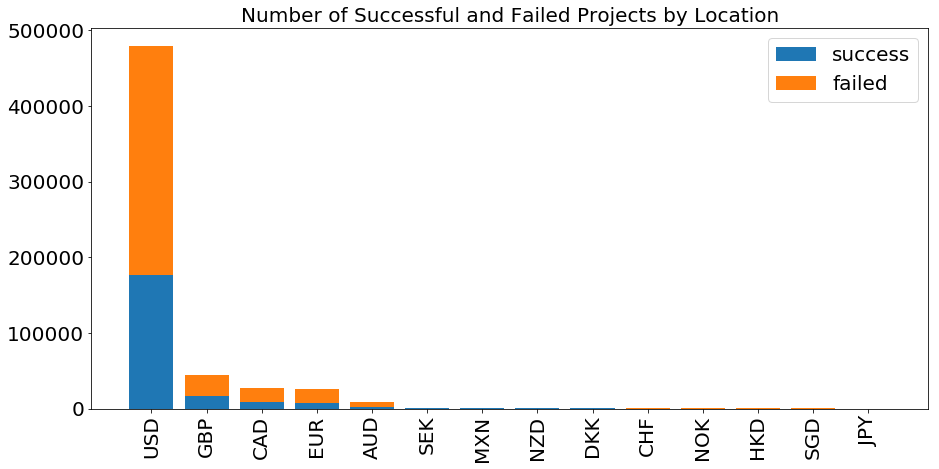

In [89]:
df=sta3_location.copy()
df['fail_percentage']=1-df['success_percentage']
df['num_success']=df['count']*df['success_percentage']
df['num_fail']=df['count']*df['fail_percentage']
df.sort_values(by='count',ascending=False,inplace=True)

fontsize=20
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize
plt.rcParams['axes.labelsize'] = fontsize

plt.figure(figsize=(15,7))
size = 5
x = df.index.values
a = df['num_success'].values
b = df['num_fail'].values
plt.bar(x, a, label='success')
plt.bar(x, b, bottom=a, label='failed')
plt.legend(prop={'size':20})
plt.title('Number of Successful and Failed Projects by Location')
#plt.yticks([])

locs, labels = plt.xticks() 
plt.setp(labels , rotation=90) 

plt.show()

### 2. 不同category下成功與失敗專案情況

不同category下成功與失敗專案數量與占比

In [90]:
sta3_category=data.groupby(['category'])['status'].agg(['sum','count'])
sta3_category['success_percentage']=round(sta3_category['sum']/sta3_category['count'],2)
sta3_category.sort_values(by='success_percentage',ascending=False,inplace=True)
sta3_category.rename(columns={'count':'num_all'})
sta3_category.drop(columns=['sum'],inplace=True)
sta3_category

,count,success_percentage
category,,
Comics,12224,0.55
Theater,18864,0.52
audio,319,0.48
tabletop_games,93,0.45
Music,68513,0.45
Games,28520,0.44
Film & Video,56503,0.42
gaming,2513,0.42
Design,28941,0.41


按專案數排序

In [91]:
sta3_category.sort_values(by='count',ascending=False,inplace=True)
sta3_category

,count,success_percentage
category,,
Music,68513,0.45
Film & Video,56503,0.42
film,54495,0.26
Technology,38940,0.32
Publishing,35413,0.35
Art,35151,0.41
Design,28941,0.41
Games,28520,0.44
Fashion,25992,0.28


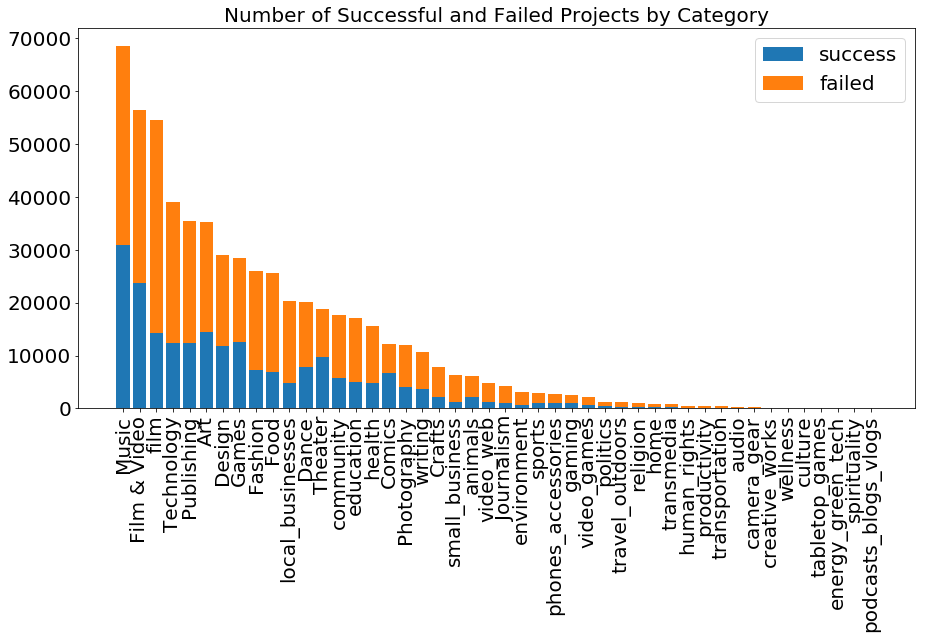

In [92]:
df=sta3_category.copy()
df['fail_percentage']=1-df['success_percentage']
df['num_success']=df['count']*df['success_percentage']
df['num_fail']=df['count']*df['fail_percentage']
df.sort_values(by='count',ascending=False,inplace=True)

fontsize=20
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize
plt.rcParams['axes.labelsize'] = fontsize

plt.figure(figsize=(15,7))
size = 5
x = df.index.values
a = df['num_success'].values
b = df['num_fail'].values
plt.bar(x, a, label='success')
plt.bar(x, b, bottom=a, label='failed')
plt.legend(prop={'size':20})
plt.title('Number of Successful and Failed Projects by Category')
#plt.yticks([])

locs, labels = plt.xticks() 
plt.setp(labels , rotation=90) 

plt.show()

### 3. 專案為成功和失敗情況下backers的敘述統計

In [93]:
sta3_backers=data.groupby(['status'])['backers'].agg(['mean','std','min','max','count'])
sta3_backers.rename(index={0:'failed',1:'success'},inplace=True)
round(sta3_backers,2)

,mean,std,min,max,count
status,,,,,
failed,26.42,119.50,0,27635,379400
success,299.39,1673.23,1,219382,213611


<Figure size 432x288 with 0 Axes>

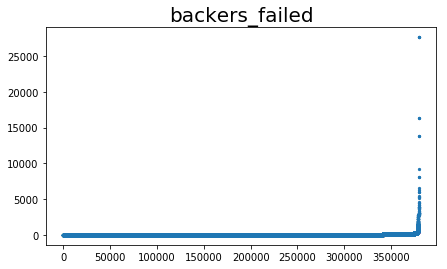

<Figure size 432x288 with 0 Axes>

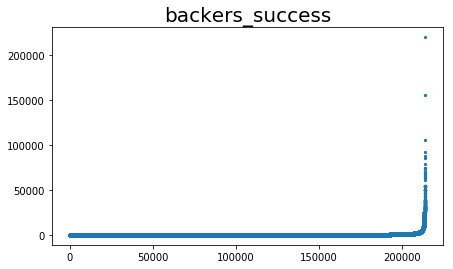

In [94]:
matplotlib.rcParams.update({'font.size': 22})
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 
for i in [0,1]:
    plt.figure()
    fig, ax = plt.subplots(1,1,figsize=(7,4))
    x=range(data['status'].loc[data['status']==i].shape[0])
    y=np.sort(data.loc[data['status']==i]['backers'])
    ax.scatter(x,y,s=5)

    plt.xticks()
    if i==0:
        plt.title('backers_failed')
    else:
        plt.title('backers_success')
    '''
    import matplotlib.ticker as ticker
    tick_spacing = 9500
    ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    '''
    plt.show()

<Figure size 432x288 with 0 Axes>

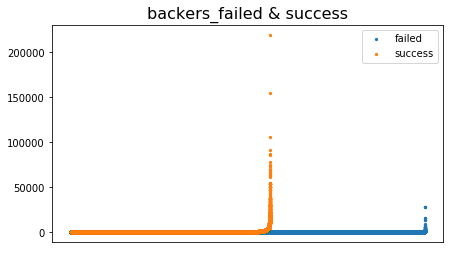

In [13]:
matplotlib.rcParams.update({'font.size': 22})
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 

plt.figure()
fig, ax = plt.subplots(1,1,figsize=(7,4))

x1=range(data['status'].loc[data['status']==0].shape[0])
y1=np.sort(data.loc[data['status']==0]['backers'])
ax.scatter(x1,y1,s=5,label='failed')

x2=range(data['status'].loc[data['status']==1].shape[0])
y2=np.sort(data.loc[data['status']==1]['backers'])
ax.scatter(x2,y2,s=5,label='success')

plt.title('backers_failed & success')
plt.legend(prop={'size':10})
plt.xticks([])

import matplotlib.ticker as ticker
tick_spacing = 50000
ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))

plt.show()

### 4. 專案為成功和失敗情況下goal_usd的敘述統計

In [96]:
sta3_goal_usd=data.groupby(['status'])['goal_usd'].agg(['mean','std','min','max','count'])
sta3_goal_usd.rename(index={0:'failed',1:'success'},inplace=True)
round(sta3_goal_usd,2)

,mean,std,min,max,count
status,,,,,
failed,43019.70,1041262.05,0.15,166361390.7,379400
success,10916.68,46966.34,0.01,5024421.0,213611


<Figure size 432x288 with 0 Axes>

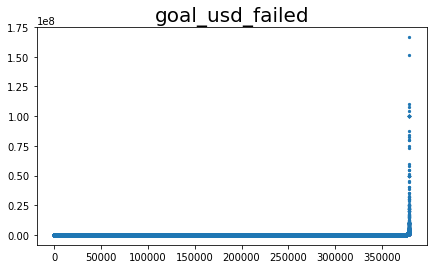

<Figure size 432x288 with 0 Axes>

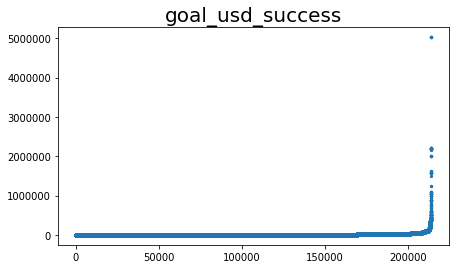

In [97]:
matplotlib.rcParams.update({'font.size': 22})
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 
for i in [0,1]:
    plt.figure()
    fig, ax = plt.subplots(1,1,figsize=(7,4))
    x=range(data['status'].loc[data['status']==i].shape[0])
    y=np.sort(data.loc[data['status']==i]['goal_usd'])
    ax.scatter(x,y,s=5)

    plt.xticks()
    if i==0:
        plt.title('goal_usd_failed')
    else:
        plt.title('goal_usd_success')
    '''
    import matplotlib.ticker as ticker
    tick_spacing = 9500
    ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    '''
    plt.show()

<Figure size 432x288 with 0 Axes>

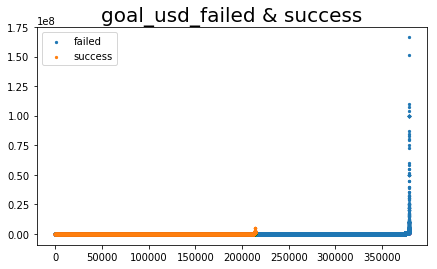

In [98]:
matplotlib.rcParams.update({'font.size': 22})
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 

plt.figure()
fig, ax = plt.subplots(1,1,figsize=(7,4))

x1=range(data['status'].loc[data['status']==0].shape[0])
y1=np.sort(data.loc[data['status']==0]['goal_usd'])
ax.scatter(x1,y1,s=5,label='failed')

x2=range(data['status'].loc[data['status']==1].shape[0])
y2=np.sort(data.loc[data['status']==1]['goal_usd'])
ax.scatter(x2,y2,s=5,label='success')

plt.title('goal_usd_failed & success')
plt.legend(prop={'size':10})
plt.xticks()

plt.show()

### 5. 專案為成功和失敗情況下pledged_usd的敘述統計

In [99]:
sta3_pledged_usd=data.groupby(['status'])['pledged_usd'].agg(['mean','std','min','max','count'])
sta3_pledged_usd.rename(index={0:'failed',1:'success'},inplace=True)
round(sta3_pledged_usd,2)

,mean,std,min,max,count
status,,,,,
failed,2185.60,37654.74,0.00,12814216.00,379400
success,29148.76,196801.66,0.79,20338986.27,213611


<Figure size 432x288 with 0 Axes>

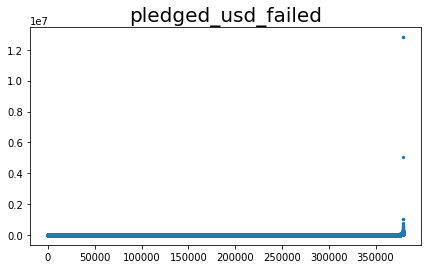

<Figure size 432x288 with 0 Axes>

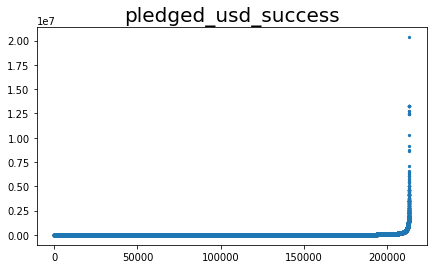

In [100]:
matplotlib.rcParams.update({'font.size': 22})
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 
for i in [0,1]:
    plt.figure()
    fig, ax = plt.subplots(1,1,figsize=(7,4))
    x=range(data['status'].loc[data['status']==i].shape[0])
    y=np.sort(data.loc[data['status']==i]['pledged_usd'])
    ax.scatter(x,y,s=5)

    plt.xticks()
    if i==0:
        plt.title('pledged_usd_failed')
    else:
        plt.title('pledged_usd_success')
    '''
    import matplotlib.ticker as ticker
    tick_spacing = 9500
    ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    '''
    plt.show()

<Figure size 432x288 with 0 Axes>

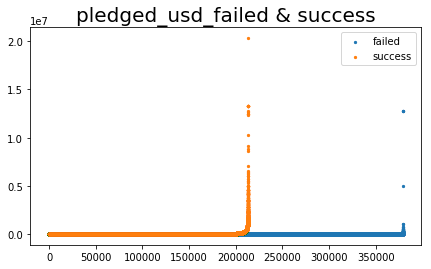

In [101]:
matplotlib.rcParams.update({'font.size': 22})
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 

plt.figure()
fig, ax = plt.subplots(1,1,figsize=(7,4))

x1=range(data['status'].loc[data['status']==0].shape[0])
y1=np.sort(data.loc[data['status']==0]['pledged_usd'])
ax.scatter(x1,y1,s=5,label='failed')

x2=range(data['status'].loc[data['status']==1].shape[0])
y2=np.sort(data.loc[data['status']==1]['pledged_usd'])
ax.scatter(x2,y2,s=5,label='success')

plt.title('pledged_usd_failed & success')
plt.legend(prop={'size':10})
plt.xticks()

plt.show()

## 四、個別feature，在不同category下，成功與失敗情形

### 1. 不同category下location成功與失敗專案情形

In [102]:
for i in data['category'].unique():
    df_sta=data.loc[data['category']==i].groupby(['location'])['status'].agg(['count','sum'])
    df_sta['percentage_success']=round(df_sta['sum']/df_sta['count'],2)
    df_sta.rename(columns={'count':'total'},inplace=True)
    df_sta.drop(columns=['sum'],inplace=True)
    df_sta.sort_values(by='percentage_success',inplace=True,ascending=False)
    print('category = {}'.format(i))
    print(df_sta,'\n')

category = Art
          total  percentage_success
location                           
DKK          72                0.56
SGD          20                0.55
HKD          31                0.42
USD       28020                0.42
GBP        3053                0.41
SEK         105                0.38
NZD          81                0.37
CHF          44                0.34
AUD         463                0.33
CAD        1566                0.32
EUR        1526                0.30
MXN         138                0.30
NOK          31                0.19
JPY           1                0.00 

category = Film & Video
          total  percentage_success
location                           
DKK          98                0.50
NZD         176                0.48
GBP        5216                0.46
MXN         260                0.45
USD       46932                0.42
CAD        1489                0.34
AUD         822                0.30
EUR        1197                0.29
NOK          62        

category = film
          total  percentage_success
location                           
CAD        3000                0.31
GBP        4507                0.27
USD       44228                0.26
AUD         733                0.23
EUR        2027                0.22 

category = community
          total  percentage_success
location                           
GBP         911                0.41
CAD        1244                0.34
USD       14718                0.33
AUD         210                0.29
EUR         546                0.29 

category = gaming
          total  percentage_success
location                           
AUD          13                0.54
EUR         462                0.49
CAD          86                0.44
GBP          76                0.43
USD        1876                0.39 

category = video_games
          total  percentage_success
location                           
EUR         297                0.38
GBP          80                0.36
AUD          17 

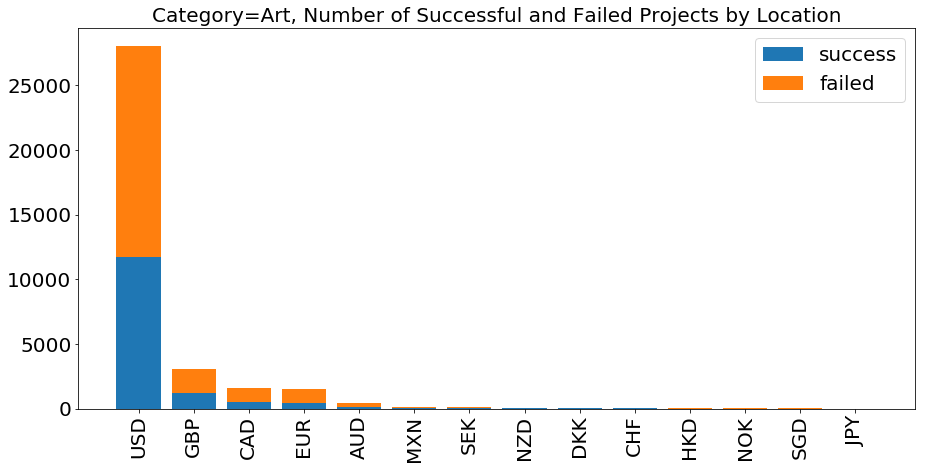

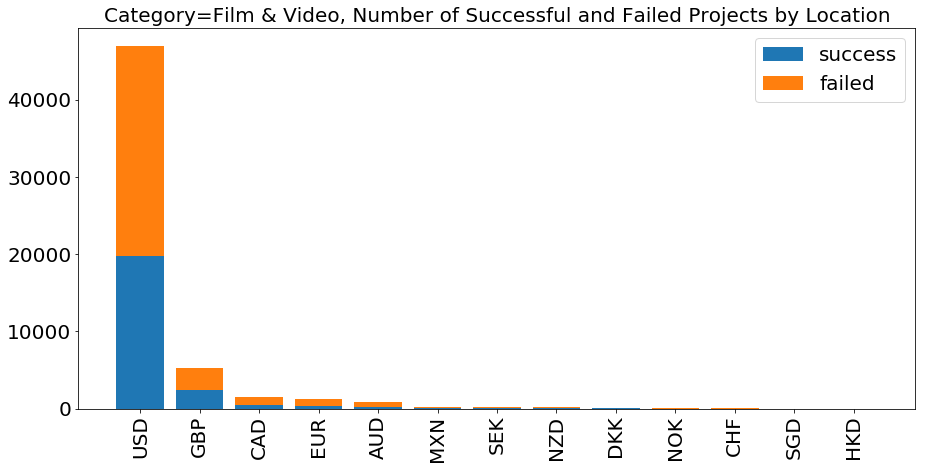

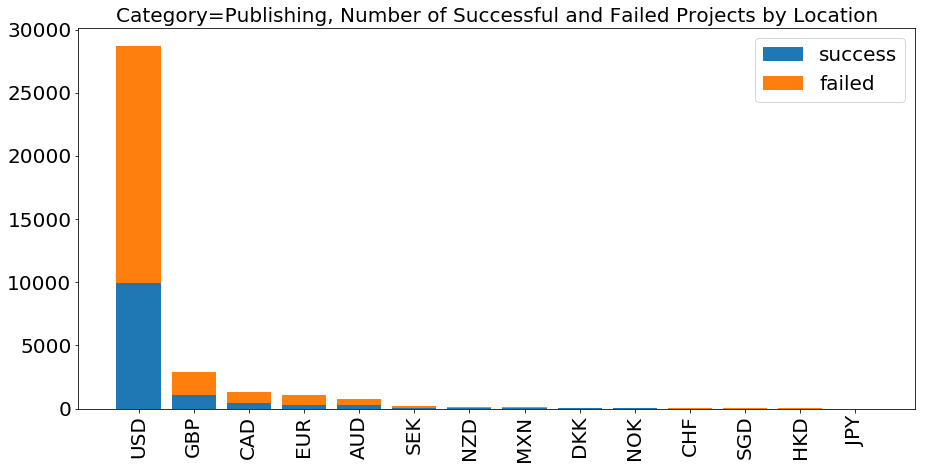

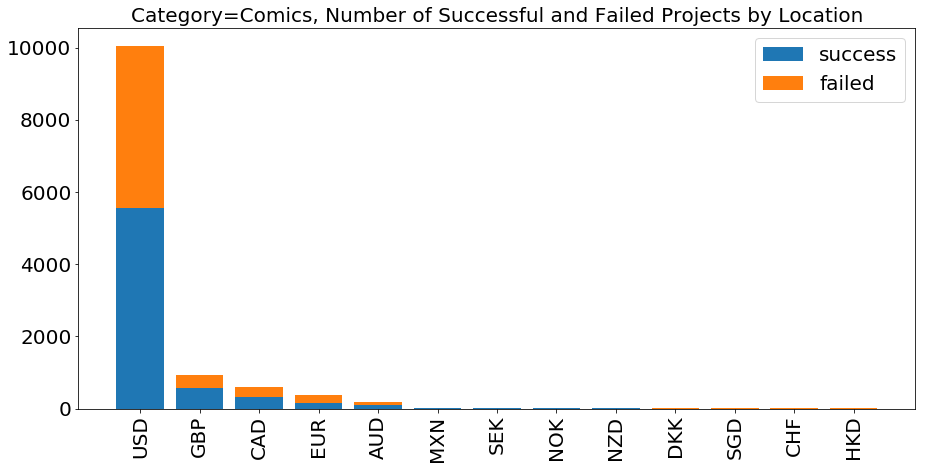

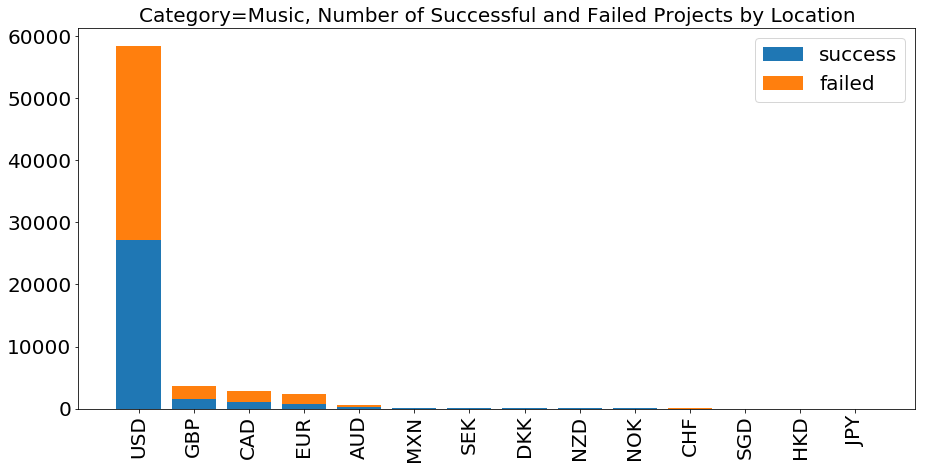

...

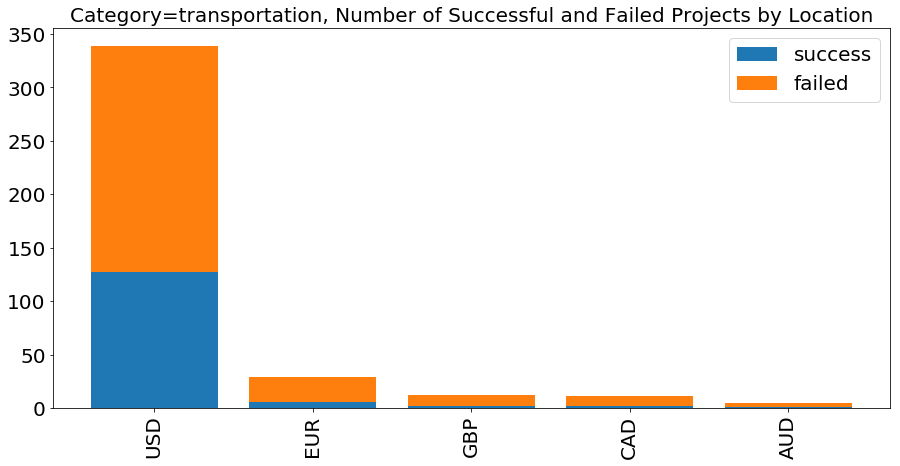

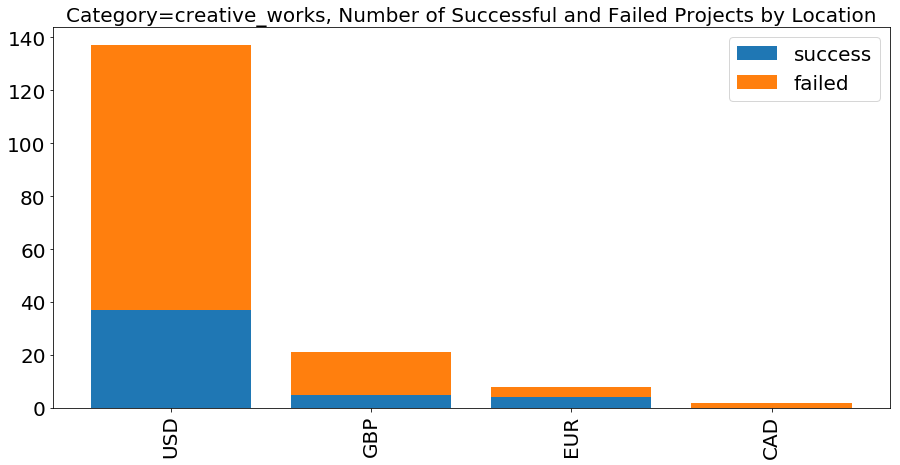

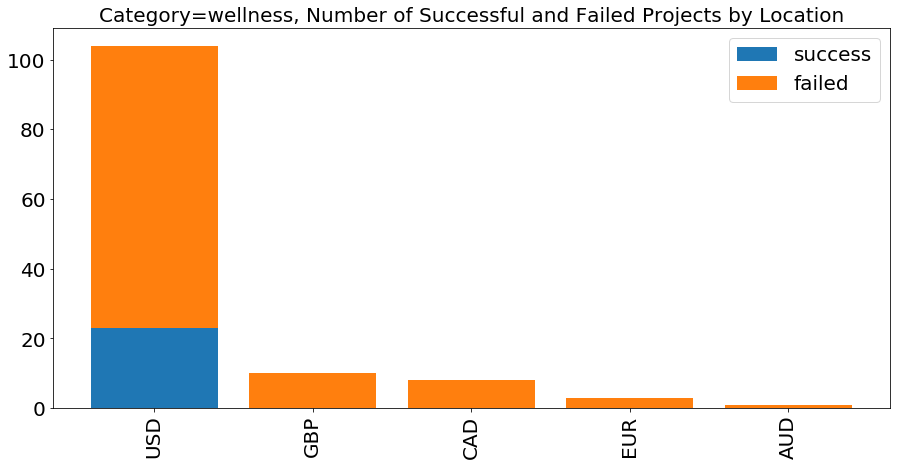

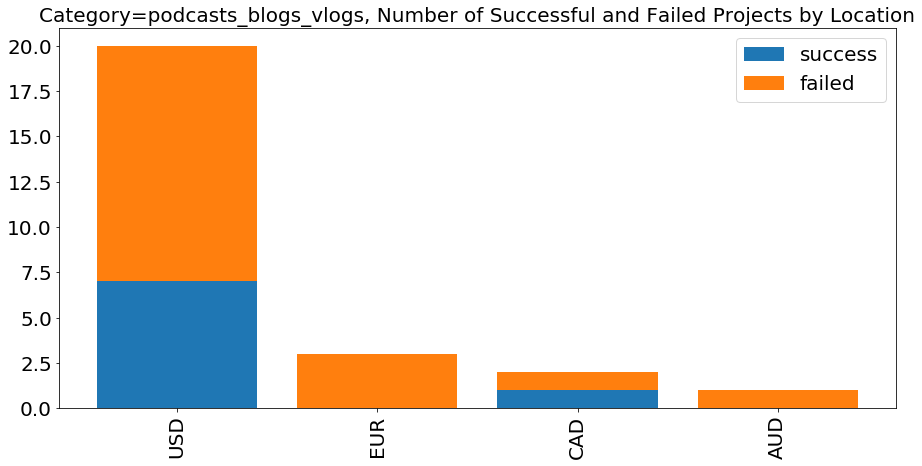

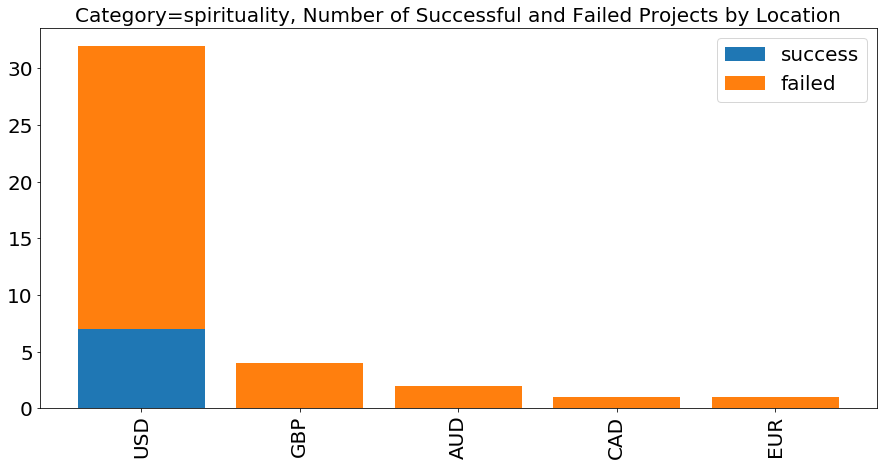

In [103]:
fontsize=20
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize
plt.rcParams['axes.labelsize'] = fontsize

for i in data['category'].unique():    
    df_sta=data.loc[data['category']==i].groupby(['location'])['status'].agg(['count','sum'])
    df_sta.rename(columns={'count':'total','sum':'num_success'},inplace=True)
    df_sta['num_fail']=df_sta['total']-df_sta['num_success']
    df_sta.sort_values(by='total',inplace=True,ascending=False)
    
    plt.figure(figsize=(15,7))
    size = 5
    x = df_sta.index.values
    a = df_sta['num_success'].values
    b = df_sta['num_fail'].values
    plt.bar(x, a, label='success')
    plt.bar(x, b, bottom=a, label='failed')
    plt.legend(prop={'size':20})
    plt.title('Category={}, Number of Successful and Failed Projects by Location'.format(i))
    locs, labels = plt.xticks() 
    plt.setp(labels , rotation=90) 
    
    plt.show()

### 2. 不同category分別在專案成功與失敗情形下backers的敘述統計

In [104]:
pd.set_option('display.max_rows', None)

In [105]:
round(data.groupby(['category','status'])['backers'].agg(['count','mean','std','min','max']),2)

count     mean       std  min     max
category             status                                       
Art                  0       20896    15.25     34.25    0    2180
                     1       14255    94.70    325.81    1   22834
Comics               0        5442    25.26     41.01    0     681
                     1        6782   217.82    487.45    1   14952
Crafts               0        5703     6.01     17.54    0     853
                     1        2115    94.15    326.07    1   12705
Dance                0       12277    28.84     32.72    0     893
                     1        7775    62.01    373.46    1   22536
Design               0       16948    32.34     77.54    0    5338
                     1       11993   643.13   2540.43    1  154926
Fashion              0       18701    15.41     32.83    0     912
                     1        7291   253.66    756.55    1   15129
Film & Video         0       32891    15.12     60.39    0    4435
                     1       23612   152.63    878.64    1   91585
Food                 0       18756    16.90     37.65    0    1265
                     1        6883   180.99    487.02    1   13116
Games                0       16002    43.96    188.60    0    6550
                     1       12518   814.38   3550.87    1  219382
Journalism           0        3136     7.82     43.31    0    1792
                     1        1012   152.31    292.90    1    3136
Music                0       37588    20.52     40.63    0    2561
                     1       30925   105.69    290.26    1   24883
Photography          0        7966    13.98     39.15    0    1199
                     1        4037   112.55    243.04    1    5582
Publishing           0       23113    10.20     27.94    0     952
                     1       12300   158.82    512.55    1   21808
Technology           0       26514    27.51    193.38    0   27635
                     1       12426  1326.19   3672.52    1  105857
Theater              0        9083    25.38     35.12    0     893
                     1        9781    67.28    255.80    1   22536
animals              0        4097    43.29     85.48    1    1700
                     1        2083   123.58    579.14    2   14407
audio                0         165    34.93     52.53    1     415
                     1         154  2291.19   5599.49   10   37716
camera_gear          0         175    32.29     34.75    1     179
                     1         118  1092.63   2142.52    4   17206
community            0       11819    38.49    144.57    1   13882
                     1        5810   111.77    556.95    2   32251
creative_works       0         122    19.40     29.39    1     165
                     1          46   535.13    973.74   22    3017
culture              0          87    33.55     61.66    1     327
                     1           9   174.11    231.54   12     744
education            0       12120    30.57     74.02    0    5365
                     1        4905   123.47    847.18    1   33253
energy_green_tech    0          60    22.35     33.83    1     143
                     1          29  7274.79  15356.92   16   50111
environment          0        2302    52.55    253.67    1    9267
                     1         742   193.18    499.96    2    6320
film                 0       40146    36.05    112.54    1   13882
                     1       14349   254.59   1991.87    1   54313
gaming               0        1470    60.34    204.98    1    3006
                     1        1043   620.28   3205.66    2   32432
health               0       10779    38.03     69.23    0    2246
                     1        4793   246.88   1033.10    2   19709
home                 0         598    38.24     76.89    1    1141
                     1         331  1300.00   3734.37    3   41607
human_rights         0         327    34.64     67.44    1     818
                     1         137   190.31    327.87    2    2093
local_bus

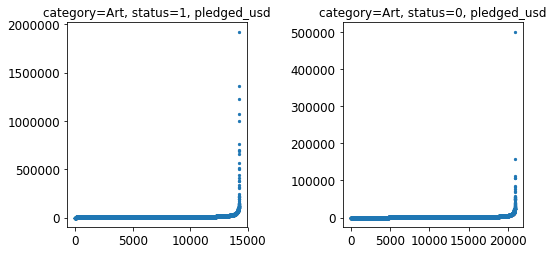

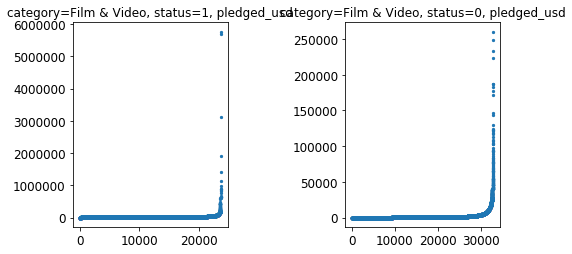

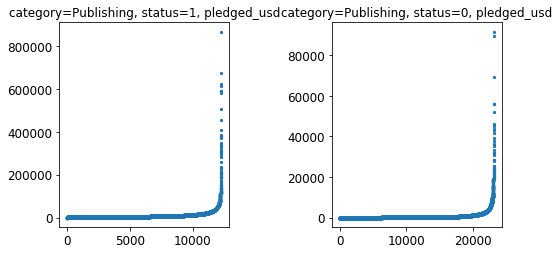

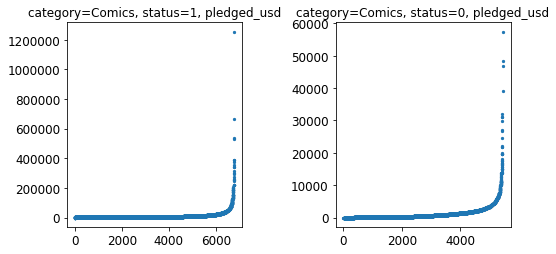

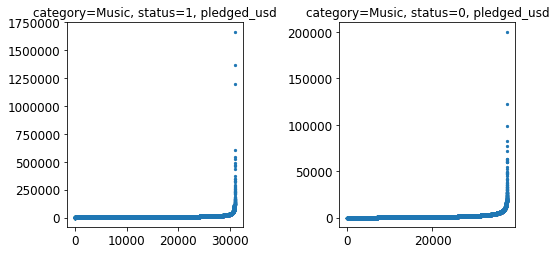

...

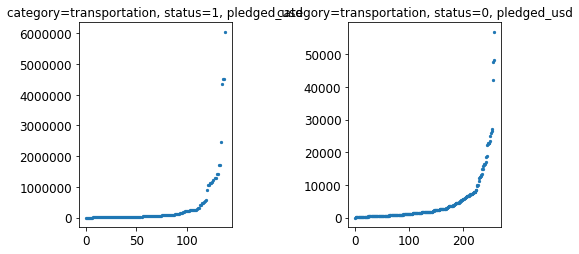

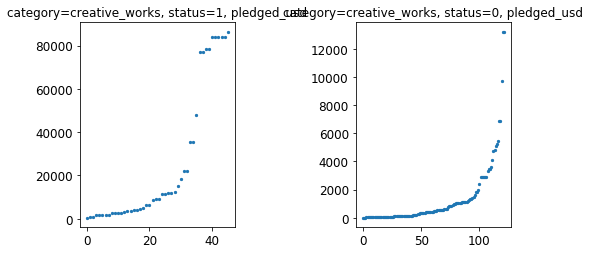

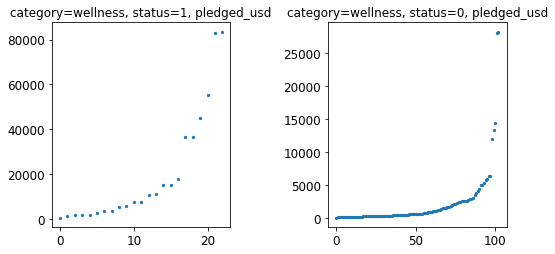

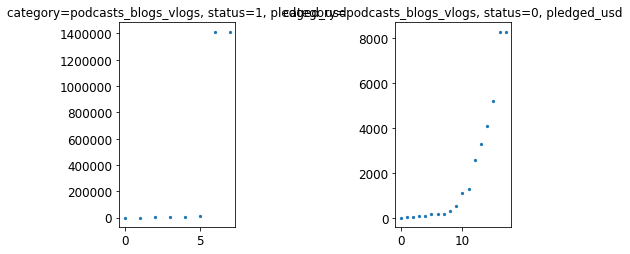

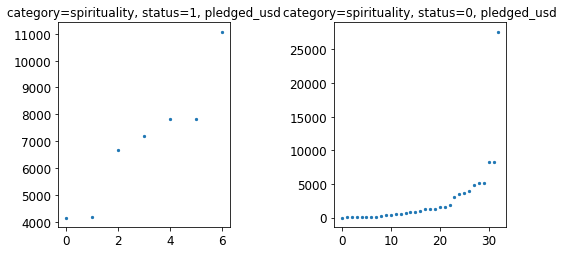

In [106]:
fontsize=12
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize

for i in data['category'].unique():
    fig,ax=plt.subplots(1,2,figsize=(8,4))
    for j,k in zip(data['status'].unique(),ax.flatten()):
        df=data.loc[data['category']==i]
        ddf=df.loc[df['status']==j]
        x=range(ddf['pledged_usd'].shape[0])
        y=np.sort(ddf['pledged_usd'])
        k.scatter(x,y,s=5)
        k.set_title('category={}, status={}, pledged_usd'.format(i,j))
    plt.tight_layout()
    plt.show() 

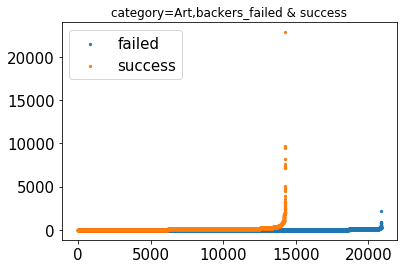

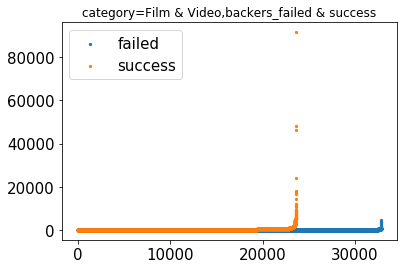

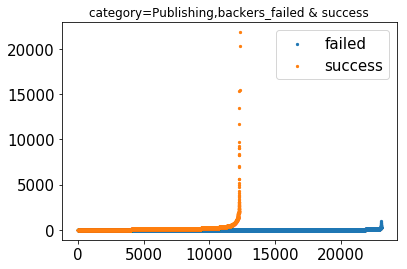

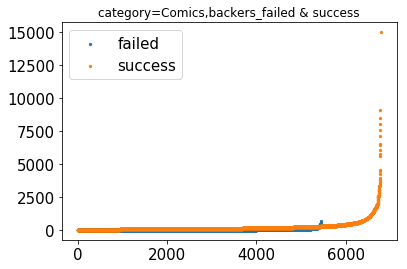

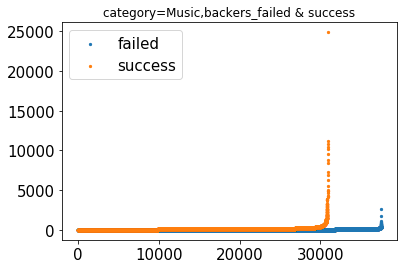

...

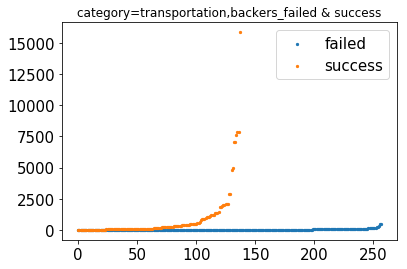

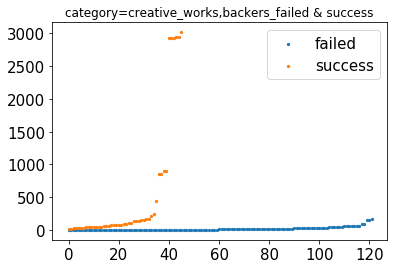

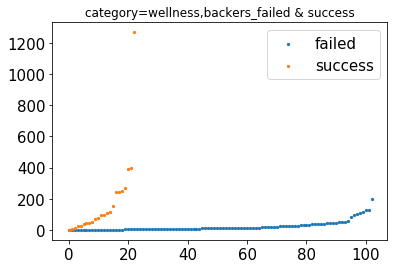

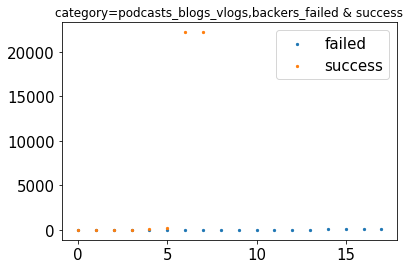

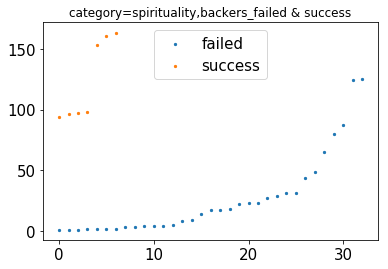

In [107]:
fontsize=15
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize

for i in data['category'].unique():
    df=data.loc[data['category']==i]
    x1=range(df.loc[df['status']==0]['backers'].shape[0])
    x2=range(df.loc[df['status']==1]['backers'].shape[0])
    y1=np.sort(df.loc[df['status']==0]['backers'])
    y2=np.sort(df.loc[df['status']==1]['backers'])
    plt.scatter(x1,y1,s=5,label='failed')
    plt.scatter(x2,y2,s=5,label='success')
    plt.title('category={},backers_failed & success'.format(i))
    plt.legend(prop={'size':15})
    plt.show() 

### 3. 不同category分別在專案成功與失敗情形下goal_usd的敘述統計

In [108]:
round(data.groupby(['category','status'])['goal_usd'].agg(['count','mean','std','min','max']),2)

count       mean         std      min  \
category             status                                          
Art                  0       20896   49667.07  1514087.71     1.00   
                     1       14255    4558.49    10028.57     0.01   
Comics               0        5442   33267.56  1369241.96    15.00   
                     1        6782    5296.86     9322.05     0.72   
Crafts               0        5703   12528.80   142854.83     1.00   
                     1        2115    3013.43     5818.26     1.00   
Dance                0       12277    9337.53    23981.12    20.00   
                     1        7775    4035.93     6799.19     5.00   
Design               0       16948   50620.35   852573.78     1.00   
                     1       11993   15802.01    29266.80     0.75   
Fashion              0       18701   25664.78   751767.24     6.98   
                     1        7291   10192.42    15626.96     1.00   
Film & Video         0       32891  122766.88  2231465.23     0.15   
                     1       23612   11148.99    34126.44     0.77   
Food                 0       18756   57025.18  1465827.73     1.00   
                     1        6883   11907.73    16797.63     0.88   
Games                0       16002   57792.05  1164176.37     1.00   
                     1       12518   14857.22    58072.80     0.75   
Journalism           0        3136   90106.72  1961845.13    10.00   
                     1        1012    8148.65    15546.85     1.00   
Music                0       37588   18107.57   376230.32     0.86   
                     1       30925    5733.67     8903.57     0.74   
Photography          0        7966   13035.12   116058.78     1.00   
                     1        4037    6646.98    13142.08     1.00   
Publishing           0       23113   23759.09   727939.31     1.00   
                     1       12300    5897.85     9811.12     0.55   
Technology           0       26514  106295.84  1619613.22     0.83   
                     1       12426   37989.17    62814.93     0.75   
Theater              0        9083   27620.53   495295.05     1.00   
                     1        9781    4702.21     9392.73     1.00   
animals              0        4097   20839.21    49950.61   463.26   
                     1        2083    5799.94    24001.18   386.05   
audio                0         165   25060.39    35398.54   433.33   
                     1         154   47336.93    46209.91   498.10   
camera_gear          0         175   19038.18    27546.73   520.00   
                     1         118   54842.91   122274.96   393.10   
community            0       11819   21948.72    59893.79   300.00   
                     1        5810    5660.18    17356.25   385.66   
creative_works       0         122   25889.94    78499.38   500.00   
                     1          46    6524.46     8450.53   500.00   
culture              0          87   16352.38    18921.98   386.05   
                     1           9   19440.13    34774.25   678.40   
education            0       12120   20070.31    86926.95   300.00   
                     1        4905   12218.41   161549.81   386.05   
energy_green_tech    0          60   55874.72   176821.39   300.00   
                     1          29  121213.68   260242.35   500.00   
environment          0        2302   30374.79    88253.78   359.04   
                     1         742   13831.79    32812.33   386.05   
film                 0       40146   19384.97    51294.80   300.00   
                     1       14349   14190.84    95280.62   385.66   
gaming               0        1470   24083.74    69899.64   300.00   
                     1        1043   25727.90   157345.32   386.05   
health               0       10779   28579.05    65771.51   393.10   
                     1        4793   11463.31    26893.80   386.05   
home                 0         598   36323.50    64104.58   393.10   
                     1         331   37

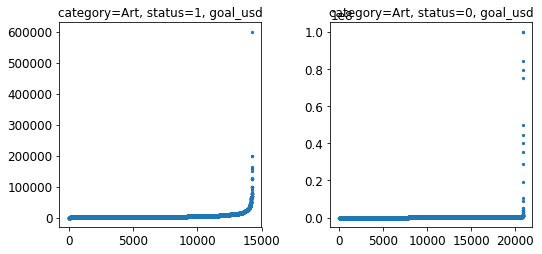

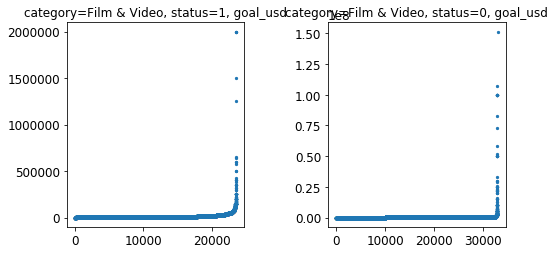

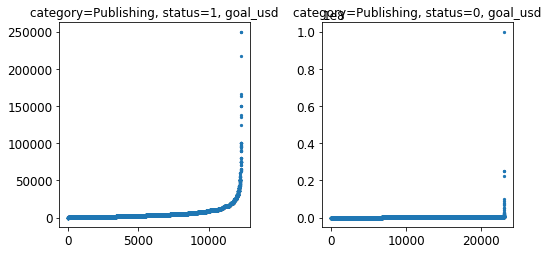

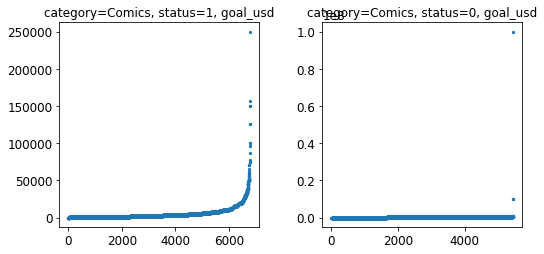

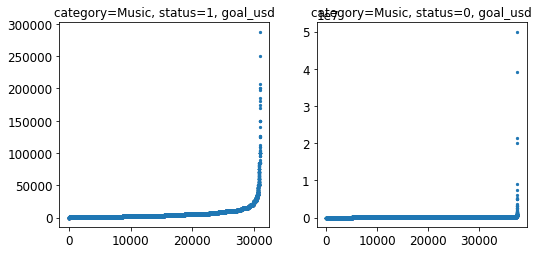

...

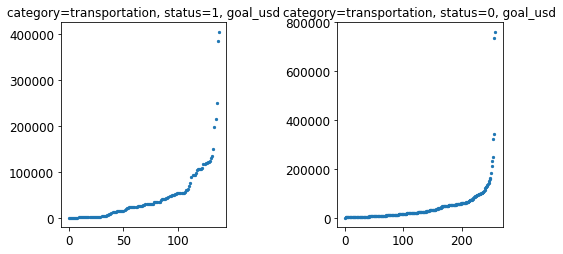

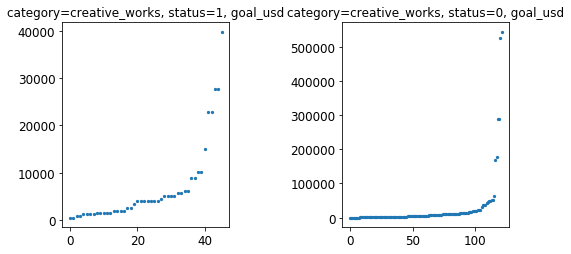

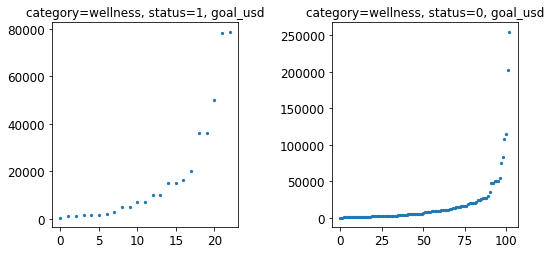

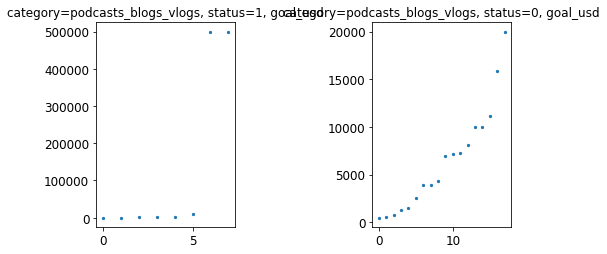

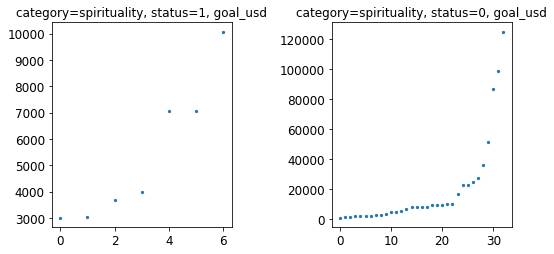

In [109]:
fontsize=12
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize

for i in data['category'].unique():
    fig,ax=plt.subplots(1,2,figsize=(8,4))
    for j,k in zip(data['status'].unique(),ax.flatten()):
        df=data.loc[data['category']==i]
        ddf=df.loc[df['status']==j]
        x=range(ddf['goal_usd'].shape[0])
        y=np.sort(ddf['goal_usd'])
        k.scatter(x,y,s=5)
        k.set_title('category={}, status={}, goal_usd'.format(i,j))
    plt.tight_layout()
    plt.show() 

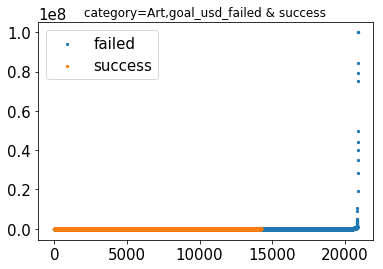

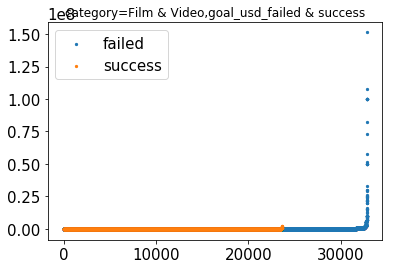

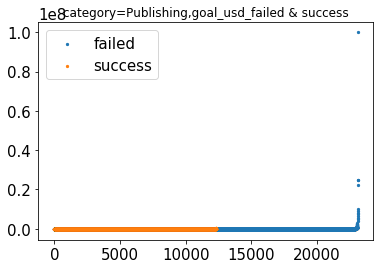

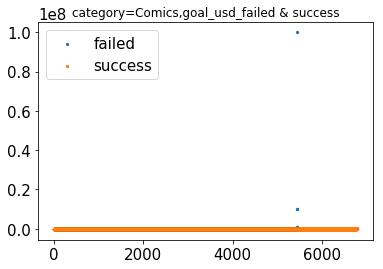

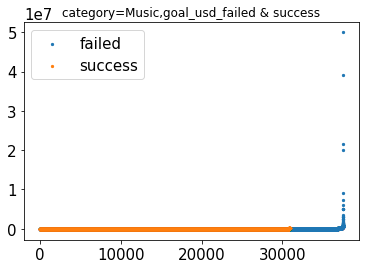

...

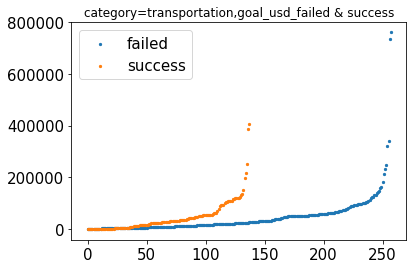

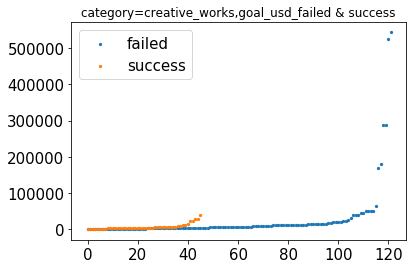

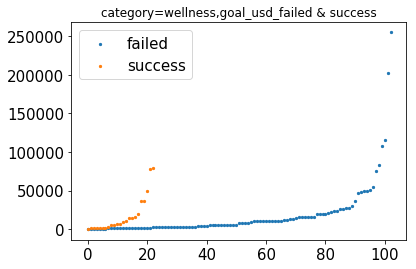

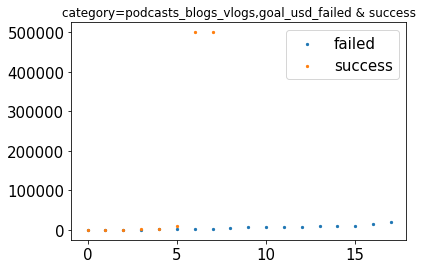

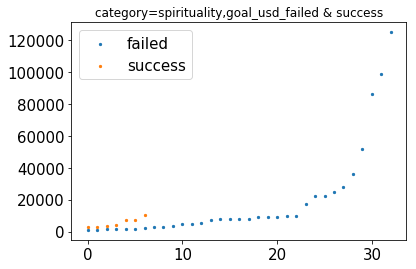

In [110]:
fontsize=15
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize

for i in data['category'].unique():
    df=data.loc[data['category']==i]
    x1=range(df.loc[df['status']==0]['goal_usd'].shape[0])
    x2=range(df.loc[df['status']==1]['goal_usd'].shape[0])
    y1=np.sort(df.loc[df['status']==0]['goal_usd'])
    y2=np.sort(df.loc[df['status']==1]['goal_usd'])
    plt.scatter(x1,y1,s=5,label='failed')
    plt.scatter(x2,y2,s=5,label='success')
    plt.title('category={},goal_usd_failed & success'.format(i))
    plt.legend(prop={'size':15})
    plt.show() 

### 4. 不同category分別在專案成功與失敗情形下pledged_usd的敘述統計

In [111]:
round(data.groupby(['category','status'])['pledged_usd'].agg(['count','mean','std','min','max']),2)

count        mean         std      min  \
category             status                                           
Art                  0       20896     1119.88     4829.68     0.00   
                     1       14255     7106.06    32437.55     1.00   
Comics               0        5442     1222.91     2605.76     0.00   
                     1        6782    10818.01    30841.15     2.00   
Crafts               0        5703      358.94     2930.94     0.00   
                     1        2115     5629.70    14975.39     1.00   
Dance                0       12277     2132.74     3057.53     0.00   
                     1        7775     4560.11     9579.97    14.00   
Design               0       16948     2880.67    10636.90     0.00   
                     1       11993    65935.33   358773.63     2.00   
Fashion              0       18701     1379.15     3919.40     0.00   
                     1        7291    25319.99    79558.93     1.00   
Film & Video         0       32891     1519.28     6391.96     0.00   
                     1       23612    13956.84    66639.48     1.00   
Food                 0       18756     1466.34     4154.37     0.00   
                     1        6883    18482.78    75446.64     1.00   
Games                0       16002     2264.22    11003.80     0.00   
                     1       12518    54228.76   279199.05     4.37   
Journalism           0        3136      550.40     4370.08     0.00   
                     1        1012    10344.95    19341.66     1.00   
Music                0       37588     1287.92     3061.95     0.00   
                     1       30925     7418.15    20508.36     1.11   
Photography          0        7966     1006.01     3725.52     0.00   
                     1        4037    10066.85    32305.73     1.00   
Publishing           0       23113      635.38     2264.05     0.00   
                     1       12300     9436.91    25375.65     1.00   
Technology           0       26514     3550.30    79602.06     0.00   
                     1       12426   176148.51   533353.98     0.79   
Theater              0        9083     1909.67     3264.17     0.00   
                     1        9781     5385.74    11841.46     3.00   
animals              0        4097     2665.32     5370.42     7.18   
                     1        2083     7483.69    28140.92   386.05   
audio                0         165     3411.67     6249.77    13.00   
                     1         154   313935.57   649728.15   523.00   
camera_gear          0         175     2942.17     4620.72     9.50   
                     1         118   233030.78   492146.42   518.89   
community            0       11819     3094.85    11674.28     3.00   
                     1        5810     8248.71    39063.51   386.05   
creative_works       0         122     1315.67     2271.37    15.00   
                     1          46    25215.21    31647.08   575.00   
culture              0          87     2357.95     4302.90     3.93   
                     1           9    21513.10    35470.74   816.00   
education            0       12120     2974.17    46299.52     3.00   
                     1        4905    15568.13   171702.17   386.05   
energy_green_tech    0          60     3575.94     6539.63     3.00   
                     1          29  1251548.45  3381448.12   580.00   
environment          0        2302     4412.47    26640.04     3.59   
                     1         742    22809.76    78913.99   393.10   
film                 0       40146     2820.83     7428.63     3.00   
                     1       14349    21263.85   163237.14   386.05   
gaming               0        1470     3121.55     8864.27     3.00   
                     1        1043    37402.99   199333.50   400.96   
health               0       10779     3324.83     7269.56     5.00   
                     1        4793    28449.73   116237.34   386.05   
home                 0         598     3940.82     91

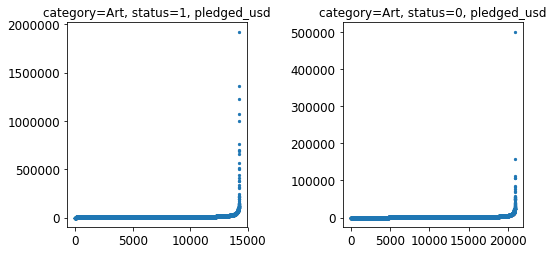

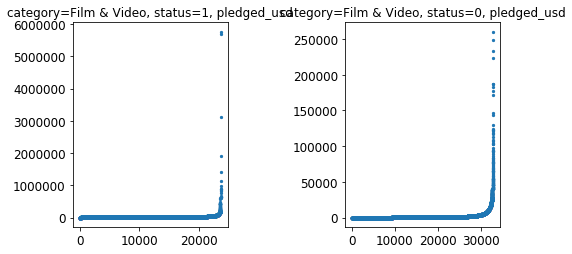

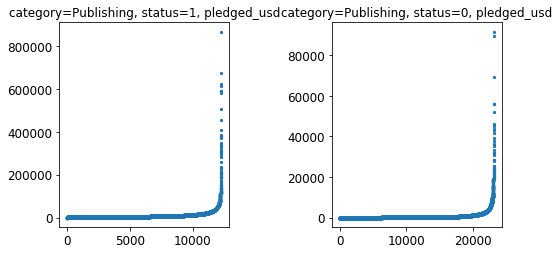

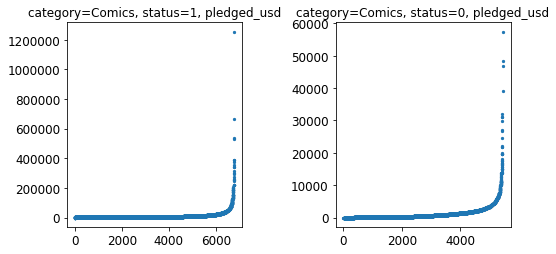

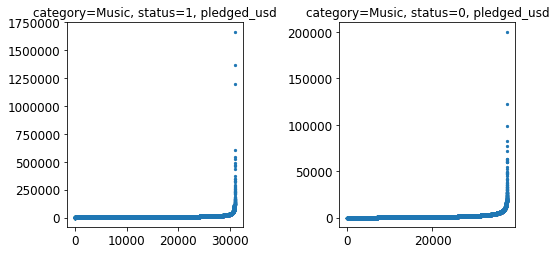

...

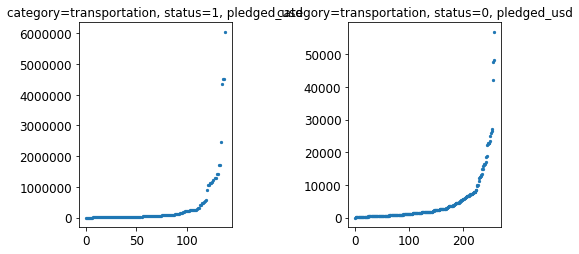

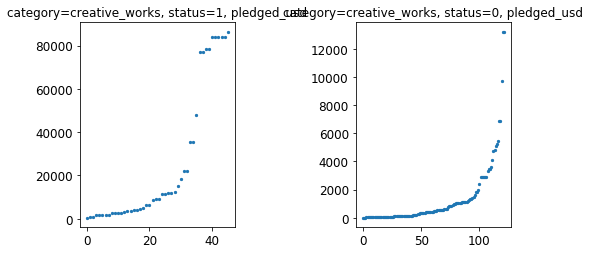

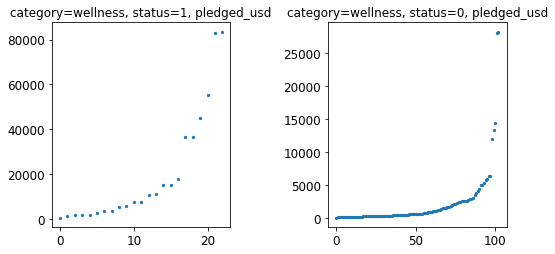

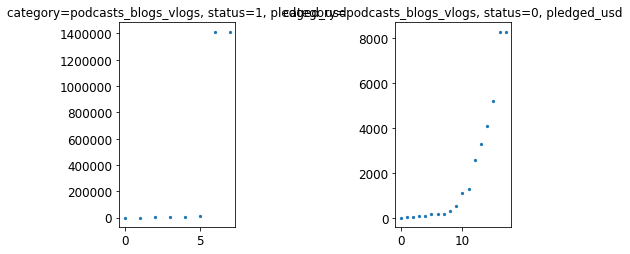

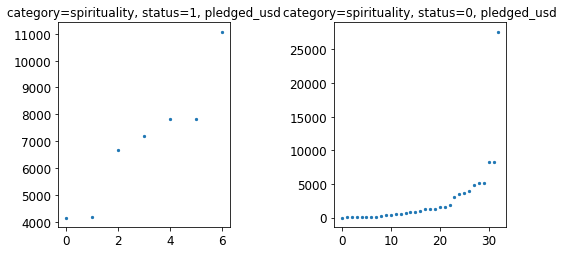

In [112]:
fontsize=12
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize

for i in data['category'].unique():
    fig,ax=plt.subplots(1,2,figsize=(8,4))
    for j,k in zip(data['status'].unique(),ax.flatten()):
        df=data.loc[data['category']==i]
        ddf=df.loc[df['status']==j]
        x=range(ddf['pledged_usd'].shape[0])
        y=np.sort(ddf['pledged_usd'])
        k.scatter(x,y,s=5)
        k.set_title('category={}, status={}, pledged_usd'.format(i,j))
    plt.tight_layout()
    plt.show() 

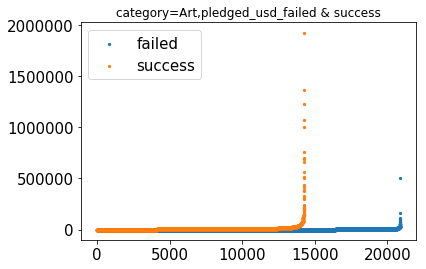

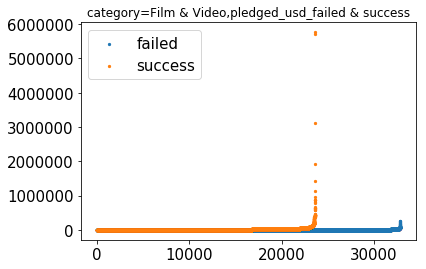

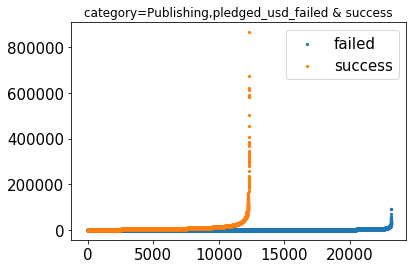

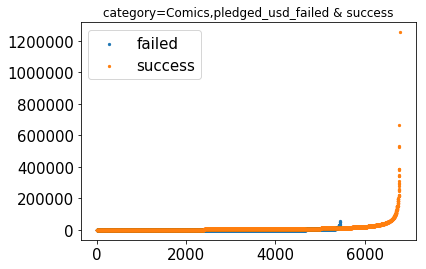

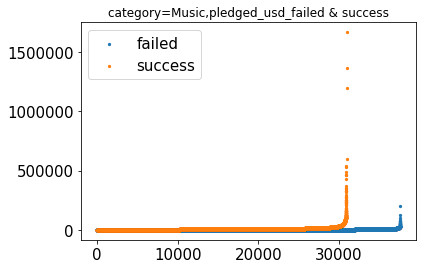

...

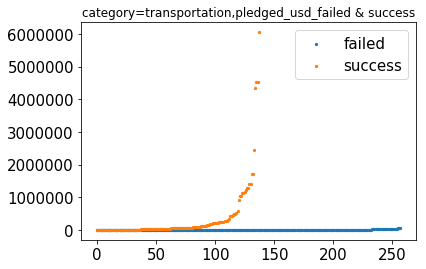

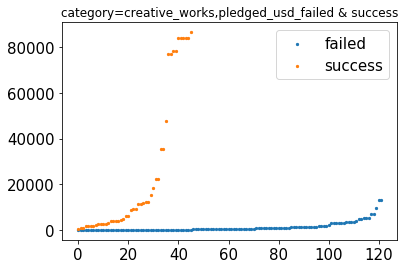

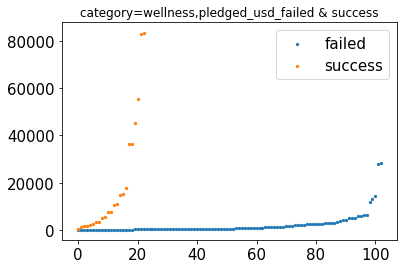

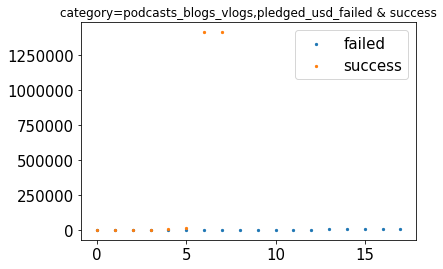

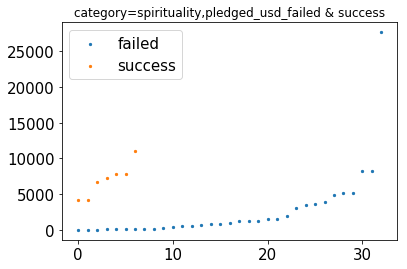

In [113]:
fontsize=15
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize

for i in data['category'].unique():
    df=data.loc[data['category']==i]
    x1=range(df.loc[df['status']==0]['pledged_usd'].shape[0])
    x2=range(df.loc[df['status']==1]['pledged_usd'].shape[0])
    y1=np.sort(df.loc[df['status']==0]['pledged_usd'])
    y2=np.sort(df.loc[df['status']==1]['pledged_usd'])
    plt.scatter(x1,y1,s=5,label='failed')
    plt.scatter(x2,y2,s=5,label='success')
    plt.title('category={},pledged_usd_failed & success'.format(i))
    plt.legend(prop={'size':15})
    plt.show() 

## 五、特徵間相關性

In [114]:
df=data[['backers','pledged_usd','goal_usd']]

In [115]:
round(df.corr(),2)

,backers,pledged_usd,goal_usd
backers,1.00,0.73,0.02
pledged_usd,0.73,1.00,0.03
goal_usd,0.02,0.03,1.00


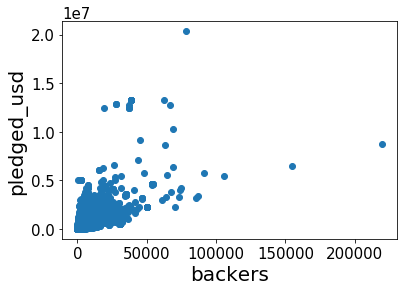

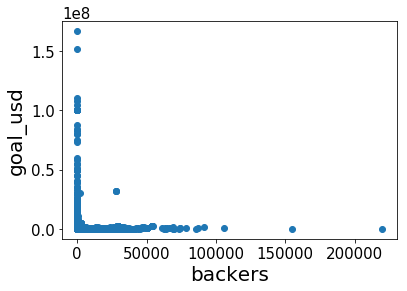

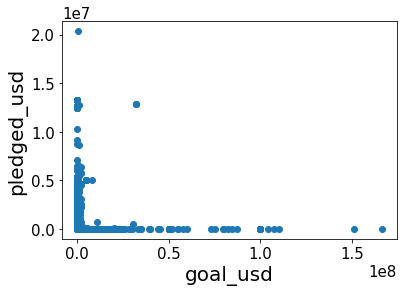

In [116]:
plt.figure()
plt.scatter(data['backers'],data['pledged_usd'])
plt.xlabel('backers')
plt.ylabel('pledged_usd')
plt.show()
plt.figure()
plt.scatter(data['backers'],data['goal_usd'])
plt.xlabel('backers')
plt.ylabel('goal_usd')
plt.show()
plt.figure()
plt.scatter(data['goal_usd'],data['pledged_usd'])
plt.xlabel('goal_usd')
plt.ylabel('pledged_usd')
plt.show()

### 1. 分別在專案失敗與成功的情況下，特徵間的相關性

In [117]:
df_fail=data.loc[data['status']==0][['backers','pledged_usd','goal_usd']]

In [118]:
round(df_fail.corr(),2)

,backers,pledged_usd,goal_usd
backers,1.00,0.72,0.06
pledged_usd,0.72,1.00,0.09
goal_usd,0.06,0.09,1.00


In [119]:
df_success=data.loc[data['status']==1][['backers','pledged_usd','goal_usd']]

In [120]:
round(df_success.corr(),2)

,backers,pledged_usd,goal_usd
backers,1.00,0.74,0.48
pledged_usd,0.74,1.00,0.46
goal_usd,0.48,0.46,1.00


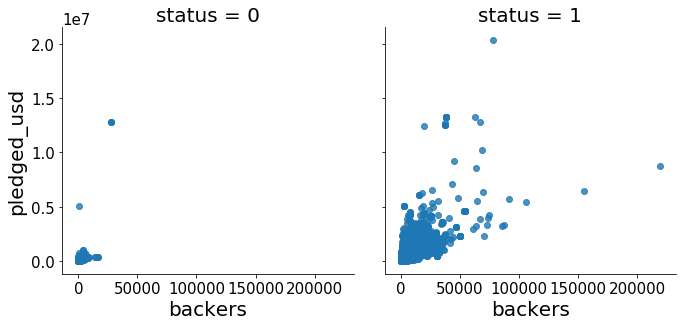

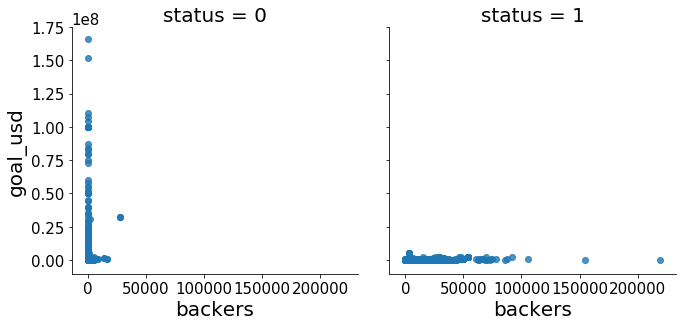

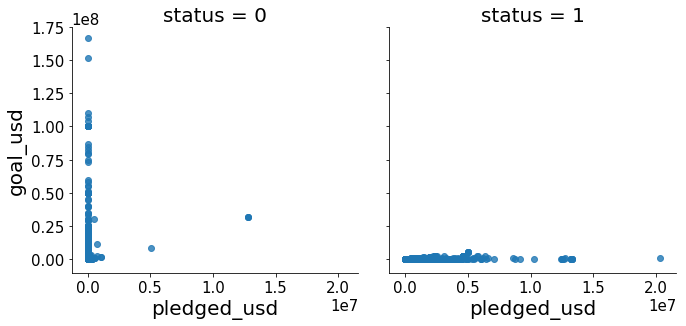

In [121]:
sns.lmplot(x = 'backers', y = 'pledged_usd', col ='status', data = data, fit_reg = False)
sns.lmplot(x = 'backers', y = 'goal_usd', col ='status', data = data, fit_reg = False)
sns.lmplot(x = 'pledged_usd', y = 'goal_usd', col ='status', data = data, fit_reg = False)

In [ ]:
writing
film
gaming
video_games
education
energy_green_tech
environment
culture
animals
video_web
politics
sports
phones_accessories
camera_gear
transmedia
audio
tabletop_games
podcasts_blogs_vlogs
spirituality

### 2. 在不同category下，特徵間的相關性

In [122]:
for i in data['category'].unique():
    df=data.loc[data['category']==i]
    print('category={}'.format(i))
    print(round(df[['backers','pledged_usd','goal_usd']].corr(),2))
    print('\n')

category=Art
             backers  pledged_usd  goal_usd
backers         1.00         0.73      -0.0
pledged_usd     0.73         1.00       0.0
goal_usd       -0.00         0.00       1.0


category=Film & Video
             backers  pledged_usd  goal_usd
backers         1.00         0.94      0.01
pledged_usd     0.94         1.00      0.01
goal_usd        0.01         0.01      1.00


category=Publishing
             backers  pledged_usd  goal_usd
backers         1.00         0.89       0.0
pledged_usd     0.89         1.00       0.0
goal_usd        0.00         0.00       1.0


category=Comics
             backers  pledged_usd  goal_usd
backers         1.00         0.92       0.0
pledged_usd     0.92         1.00       0.0
goal_usd        0.00         0.00       1.0


category=Music
             backers  pledged_usd  goal_usd
backers         1.00         0.83      0.01
pledged_usd     0.83         1.00      0.01
goal_usd        0.01         0.01      1.00


category=Games
         

category=wellness
             backers  pledged_usd  goal_usd
backers         1.00         0.70      0.15
pledged_usd     0.70         1.00      0.35
goal_usd        0.15         0.35      1.00


category=podcasts_blogs_vlogs
             backers  pledged_usd  goal_usd
backers          1.0          1.0       1.0
pledged_usd      1.0          1.0       1.0
goal_usd         1.0          1.0       1.0


category=spirituality
             backers  pledged_usd  goal_usd
backers         1.00         0.64     -0.11
pledged_usd     0.64         1.00      0.35
goal_usd       -0.11         0.35      1.00




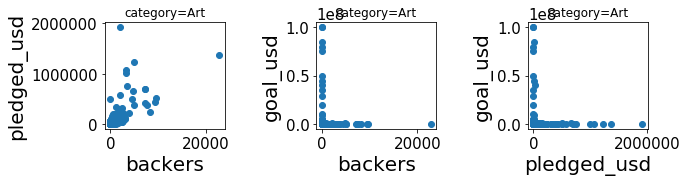

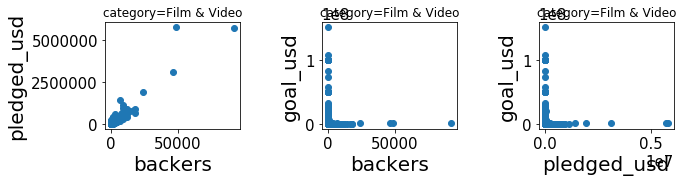

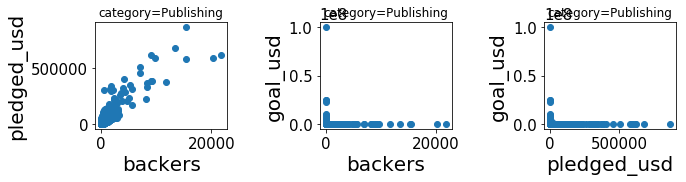

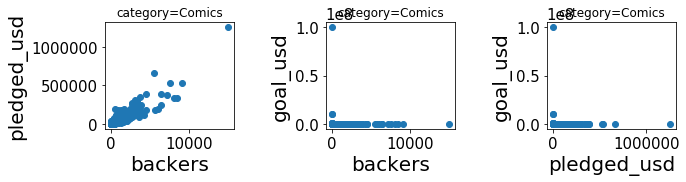

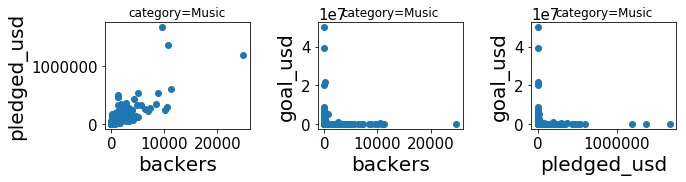

...

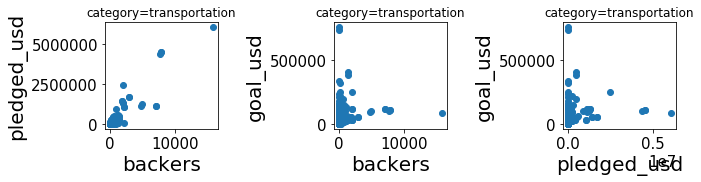

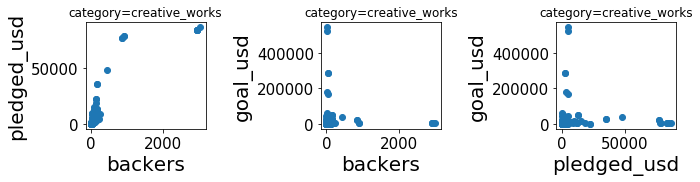

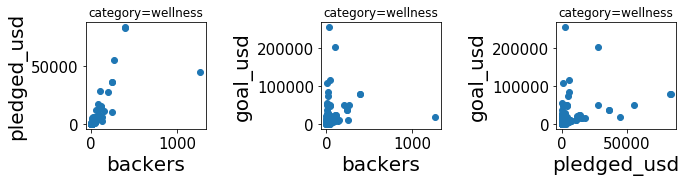

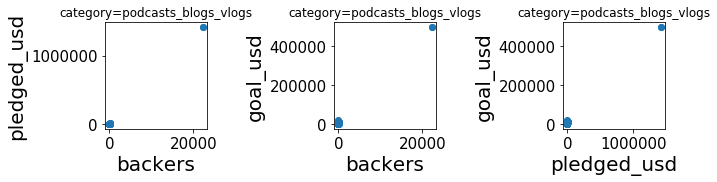

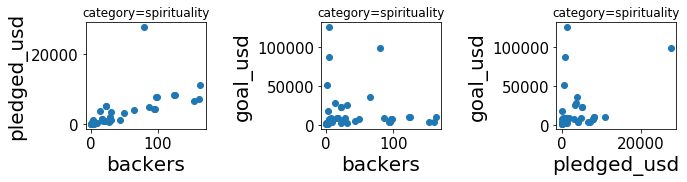

In [123]:
from itertools import combinations
c=list(combinations(['backers','pledged_usd','goal_usd'],2))
for i in data['category'].unique():
    fig,sub=plt.subplots(1,3,figsize=(10,3))
    df=data.loc[data['category']==i]
    for j,ax in zip(c,sub):
        x_name=j[0]
        y_name=j[1]
        ax.scatter(df[x_name],df[y_name])
        ax.set_xlabel(x_name)
        ax.set_ylabel(y_name)
        ax.set_title('category={}'.format(i))
    plt.tight_layout()
    plt.show()

### 3. 在不同category下，分別在成功與失敗專案下，特徵間的相關性

In [124]:
for i in data['category'].unique():
    df=data.loc[data['category']==i]
    df_fail=df.loc[df['status']==0]
    df_success=df.loc[df['status']==1]
    print('category={}'.format(i))
    print('status=failed')
    print(round(df_fail[['backers','pledged_usd','goal_usd']].corr(),2))
    print('status=success')
    print(round(df_success[['backers','pledged_usd','goal_usd']].corr(),2))
    print('\n')

category=Art
status=failed
             backers  pledged_usd  goal_usd
backers         1.00         0.54      0.00
pledged_usd     0.54         1.00      0.02
goal_usd        0.00         0.02      1.00
status=success
             backers  pledged_usd  goal_usd
backers         1.00         0.73      0.42
pledged_usd     0.73         1.00      0.54
goal_usd        0.42         0.54      1.00


category=Film & Video
status=failed
             backers  pledged_usd  goal_usd
backers         1.00         0.77      0.00
pledged_usd     0.77         1.00      0.01
goal_usd        0.00         0.01      1.00
status=success
             backers  pledged_usd  goal_usd
backers         1.00         0.94      0.84
pledged_usd     0.94         1.00      0.91
goal_usd        0.84         0.91      1.00


category=Publishing
status=failed
             backers  pledged_usd  goal_usd
backers          1.0         0.80      0.00
pledged_usd      0.8         1.00      0.01
goal_usd         0.0         0.01

category=energy_green_tech
status=failed
             backers  pledged_usd  goal_usd
backers         1.00         0.82      0.13
pledged_usd     0.82         1.00      0.30
goal_usd        0.13         0.30      1.00
status=success
             backers  pledged_usd  goal_usd
backers         1.00         0.69      0.79
pledged_usd     0.69         1.00      0.12
goal_usd        0.79         0.12      1.00


category=travel_outdoors
status=failed
             backers  pledged_usd  goal_usd
backers         1.00         0.79      0.17
pledged_usd     0.79         1.00      0.29
goal_usd        0.17         0.29      1.00
status=success
             backers  pledged_usd  goal_usd
backers          1.0          0.9       0.4
pledged_usd      0.9          1.0       0.5
goal_usd         0.4          0.5       1.0


category=environment
status=failed
             backers  pledged_usd  goal_usd
backers         1.00         0.74      0.45
pledged_usd     0.74         1.00      0.47
goal_usd       

category=wellness
status=failed
             backers  pledged_usd  goal_usd
backers         1.00         0.79      0.24
pledged_usd     0.79         1.00      0.47
goal_usd        0.24         0.47      1.00
status=success
             backers  pledged_usd  goal_usd
backers         1.00         0.60      0.43
pledged_usd     0.60         1.00      0.98
goal_usd        0.43         0.98      1.00


category=podcasts_blogs_vlogs
status=failed
             backers  pledged_usd  goal_usd
backers         1.00         0.87      0.44
pledged_usd     0.87         1.00      0.38
goal_usd        0.44         0.38      1.00
status=success
             backers  pledged_usd  goal_usd
backers          1.0          1.0       1.0
pledged_usd      1.0          1.0       1.0
goal_usd         1.0          1.0       1.0


category=spirituality
status=failed
             backers  pledged_usd  goal_usd
backers         1.00         0.63      0.05
pledged_usd     0.63         1.00      0.45
goal_usd        0.

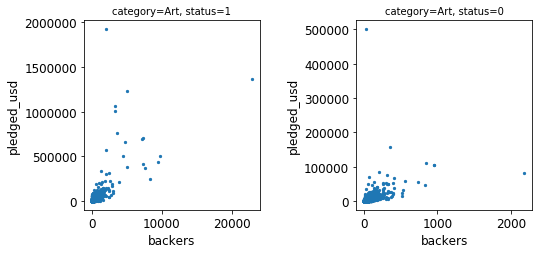

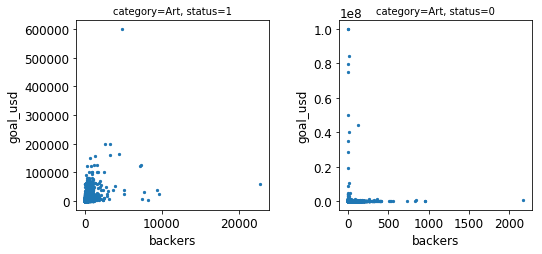

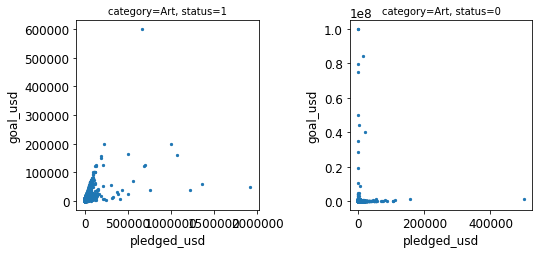

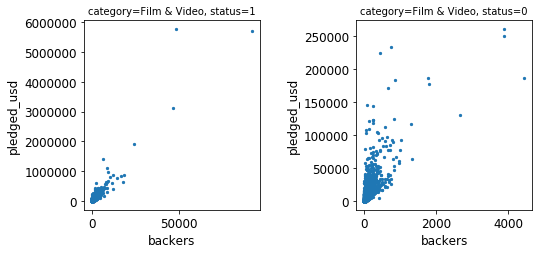

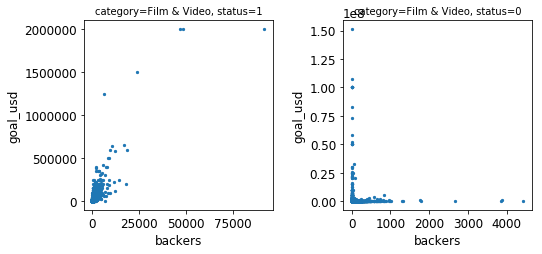

...

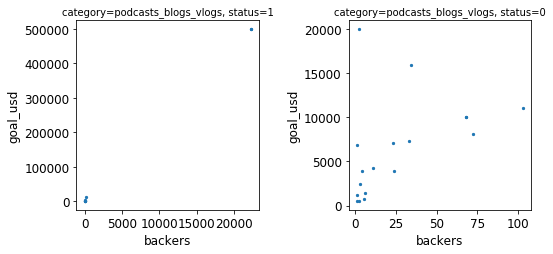

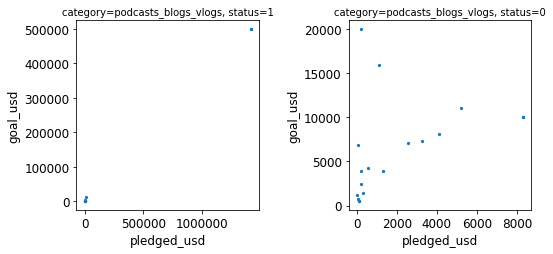

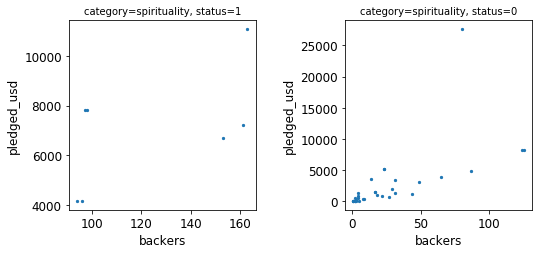

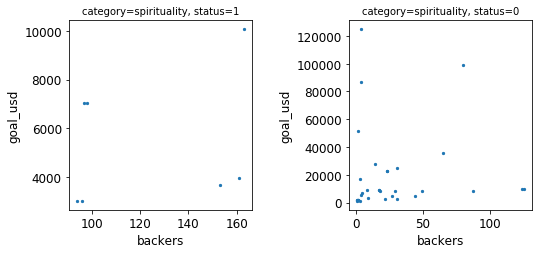

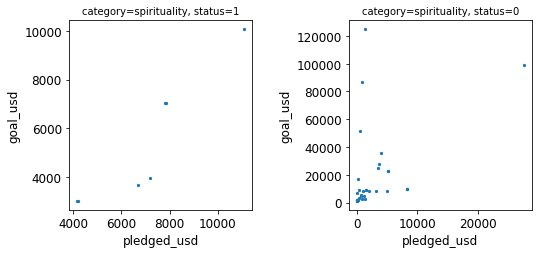

In [131]:
fontsize=12
plt.rcParams['axes.titlesize'] = 10
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['xtick.labelsize'] = fontsize
c=list(combinations(['backers','pledged_usd','goal_usd'],2))
for i in data['category'].unique():
    for w in c:
        fig,ax=plt.subplots(1,2,figsize=(8,4))
        for j,k in zip(data['status'].unique(),ax.flatten()):
            df=data.loc[data['category']==i]
            ddf=df.loc[df['status']==j]
            x=ddf[w[0]]
            y=ddf[w[1]]
            k.scatter(x,y,s=5)
            k.set_xlabel(w[0],fontsize=12)
            k.set_ylabel(w[1],fontsize=12)
            k.set_title('category={}, status={}'.format(i,j))
        plt.tight_layout()
        plt.show() 
    print('\n')